In [1]:
from pathlib import Path

import pandas as pd

In [2]:
import json
import os
from concurrent.futures import ThreadPoolExecutor
from pathlib import Path

import boto3
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from archetypal import settings
from ladybug.epw import EPW
from lightning.pytorch import Trainer
from ml.predict import predict_ubem
from ml.surrogate import Surrogate
from tqdm.notebook import tqdm
from utils.constants import JOULES_TO_KWH
from weather.weather import extract

if os.name == "nt":
    settings.ep_version == "22.2.0"
    settings.energyplus_location = Path("C:/EnergyPlusV22-2-0")
else:
    settings.ep_version == "22.2.0"
    settings.energyplus_location = Path("/usr/local/EnergyPlus-22-2-0")

from archetypal.idfclass import IDF

Couldn't import dot_parser, loading of dot files will not be possible.


c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\outdated\utils.py:14: OutdatedPackageWarning: The package energy-pandas is out of date. Your version is 0.3.3, the latest is 0.3.4.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


In [8]:
bucket = "ml-for-bem"
s3 = boto3.client("s3")

local_dir = Path("data") / "temp"
experiment_type = "validation"
version = "v5"
city = "fairbanks"
experiment_name = f"{experiment_type}/{version}/{city}"
should_gather_idf = False

registry = "ml-for-building-energy-modeling/model-registry"
model = "Global UBEM Shoebox Surrogate with Combined TS Embedder"
tag = "v3"
resource = "model.ckpt"

# load the model
surrogate = Surrogate.load_from_registry(registry, model, tag, resource)
surrogate.model.eval()
torch.set_float32_matmul_precision("medium")

trainer = Trainer(
    accelerator="auto",
    devices="auto",
    strategy="auto",
    enable_progress_bar=True,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


## Facade Analysis

See corresponding grasshopper file for .csv generation

In [32]:
orientation = 0.0
config = {
    "FacadeMass": 2,
    "RoofMass": 2,
    "FacadeRValue": 2.0,
    "RoofRValue": 2.0,
    "SlabRValue": 2.0,
    "WindowUValue": 1.0,
    "WindowShgc": 0.5,
    "PeopleDensity": 0.05,
    "EquipmentPowerDensity": 12,
    "LightingPowerDensity": 12,
    "HeatingSetpoint": 21,
    "CoolingSetpoint": 25,
    "cop_heating": 1,
    "cop_cooling": 1,
    "VentilationMode": 1,  # vent_mode, 2
    "VentilationPerArea": 0.0005,
    "VentilationPerPerson": 0.0025,
    "EconomizerSettings": 0,
    "RecoverySettings": 0,
    "Infiltration": 0.0005,
    "wwr": 0.2,
    "roof_2_footprint": 0.0,
    "ground_2_footprint": 0.0,
    "orientation": orientation,
    "width": 4,
    "height": 3,
    "perim_depth": 3,
    "core_depth": 10,
    "weight": 1,
    "template_idx": 0,
    # "floor_name": "none",
}

epw = EPW(
    "C:/ProgramData/Solemma/Common/WeatherData/EPW/USA_MA_Boston-Logan.Intl.AP.725090_TMYx.2004-2018.epw"
)
climate = extract(epw)
schedules = pd.read_hdf("data/schedules.h5")
scheds = schedules.xs("RefBldgMediumOffice", level=0).values.reshape(1, 3, 8760)
pfeatures = pd.DataFrame(data=[config])
files = list(Path("C:/users/szvsw/desktop/facade-angles/").glob("*.csv"))
dfs = [pd.read_csv(f) for f in files]
# dfs = [pd.Series(pd.read_csv(f).columns).astype(float) for f in files]
# pd.concat(dfs, axis=1, keys=[f.stem for f in files])
shading_df = pd.concat(dfs, keys=[int(f.stem) for f in files]).sort_index()
shading_df.index = pd.Series(range(len(shading_df)), name="building_id")
shading_df = (
    shading_df.set_index(
        pd.Series(shading_df.index.values // 10, name="floor"), append=True
    )
    .set_index(pd.Series(shading_df.index % 10, name="room"), append=True)
    .sort_index()
)
for col in pfeatures.columns:
    shading_df[col] = pfeatures[col].values[0]
ix = shading_df.index
shading_df = shading_df.reset_index("building_id").reset_index(drop=True)

shoebox_results, monthly_results, annual_results = predict_ubem(
    trainer=trainer,
    surrogate=surrogate,
    features=shading_df,
    schedules=scheds,
    climate=climate,
    apply_cops=False,
    batch_size=32,
)
res = shoebox_results["Perimeter"].T.groupby("Name").sum().T
# res = annual_results
res.index = ix
res.reset_index().to_csv("c:/users/szvsw/facade-energy.csv", index=False)
# k = res.Cooling

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 7/7 [00:00<00:00, 26.43it/s]


C:\Users\szvsw\AppData\Local\Temp\ipykernel_23340\2883160975.py:5: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-white")


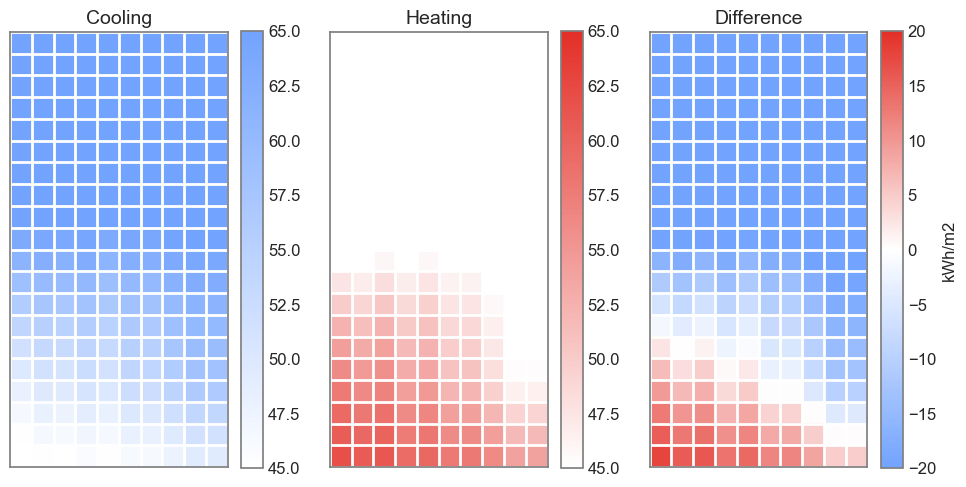

In [47]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

plt.style.use("seaborn-white")
plt.rcParams["font.family"] = "sans serif"
plt.rcParams["font.serif"] = "Ubuntu"
plt.rcParams["font.monospace"] = "Ubuntu Mono"
plt.rcParams["font.size"] = 16
plt.rcParams["axes.labelsize"] = 12
plt.rcParams["axes.labelweight"] = "light"
plt.rcParams["axes.titleweight"] = "light"
plt.rcParams["axes.edgecolor"] = "gray"
plt.rcParams["axes.titlesize"] = 14
plt.rcParams["xtick.labelsize"] = 12
plt.rcParams["ytick.labelsize"] = 12
plt.rcParams["legend.fontsize"] = 10
plt.rcParams["figure.titlesize"] = 14
plt.rcParams["figure.titleweight"] = "bold"
plt.rcParams["figure.subplot.bottom"] = 0.05

color_discrete_map = {"Heating": "#E32f27", "Cooling": "#72a3fE"}
red_color = color_discrete_map["Heating"]
blue_color = color_discrete_map["Cooling"]
custom_rwb = LinearSegmentedColormap.from_list(
    "custom_rb", [blue_color, "white", red_color]
)
custom_reds = LinearSegmentedColormap.from_list("custom_reds", ["white", red_color])
custom_blues = LinearSegmentedColormap.from_list("custom_blues", ["white", blue_color])


fig, ax = plt.subplots(1, 3, figsize=(10, 5))
square = res.droplevel(level="building_id").unstack(level="room")
norm = mcolors.Normalize(vmin=45, vmax=65)
im = ax[0].imshow(square.Cooling, cmap=custom_blues, norm=norm)
fig.colorbar(im, ax=ax[0])
ax[0].set_title("Cooling")
ax[0].invert_yaxis()  # Reverse y-axis orientation
im = ax[1].imshow(square.Heating, cmap=custom_reds, norm=norm)
fig.colorbar(im, ax=ax[1])
ax[1].set_title("Heating")
ax[1].invert_yaxis()  # Reverse y-axis orientation
difference = square.Cooling.values - square.Heating.values
vmin, vmax = -20, 20
norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
im = ax[2].imshow(-difference, cmap=custom_rwb, norm=norm)
fig.colorbar(im, ax=ax[2], label="kWh/m2")
ax[2].set_title("Difference")
ax[2].invert_yaxis()  # Reverse y-axis orientation
# add grid lines to each axis every one units
for a in ax:
    a.set_xticks(np.arange(square.Heating.shape[1] + 1) - 0.5, minor=True)
    a.set_yticks(np.arange(square.Heating.shape[0] + 1) - 0.5, minor=True)
    a.grid(which="minor", color="w", linestyle="-", linewidth=2)
    a.tick_params(which="minor", bottom=False, left=False)
    a.set_xticks([])
    a.set_yticks([])
plt.tight_layout()

## Parametric Sweeps

In [53]:
npts = 256
sweeps = shading_df.copy(deep=True)
for col in sweeps.columns:
    if col.startswith("shading"):
        sweeps[col] = 0
sweeps = sweeps.iloc[0:1]
sweep_ix = pd.MultiIndex.from_product(
    [np.linspace(0, 2 * np.pi, npts), np.linspace(0.2, 0.8, npts)],
    names=["orientation", "wwr"],
)

sweepdf = sweeps.reindex(sweep_ix).drop(columns=["orientation", "wwr"])
for col in sweeps.columns:
    if col.startswith("shading"):
        sweepdf[col] = 0.0
    elif col not in sweepdf.index.names:
        sweepdf[col] = sweeps[col].values[0]
    else:
        pass
sweepdf = sweepdf.reset_index()
sweepdf["building_id"] = range(len(sweepdf))
shoebox_results, monthly_results, annual_results = predict_ubem(
    trainer=trainer,
    surrogate=surrogate,
    features=sweepdf,
    schedules=scheds,
    climate=climate,
    apply_cops=False,
    batch_size=32,
)
# annual_results
res = shoebox_results["Perimeter"].T.groupby("Name").sum().T
res_a = annual_results
res.index = sweep_ix
res_a.index = sweep_ix

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 2048/2048 [00:37<00:00, 54.93it/s]


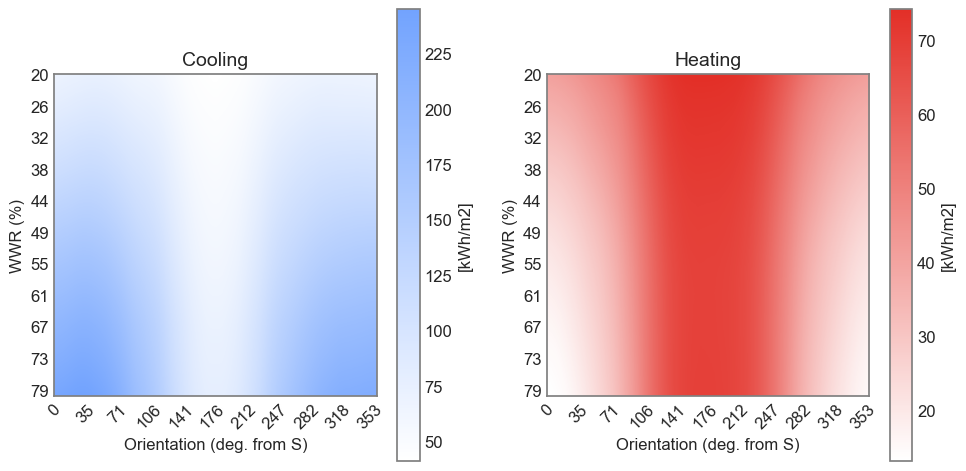

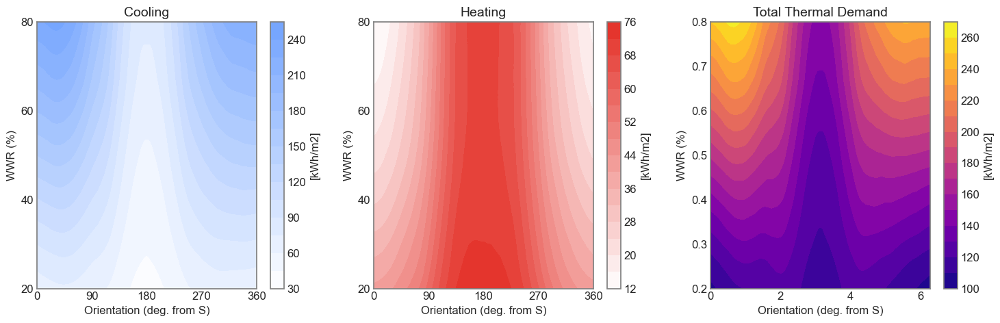

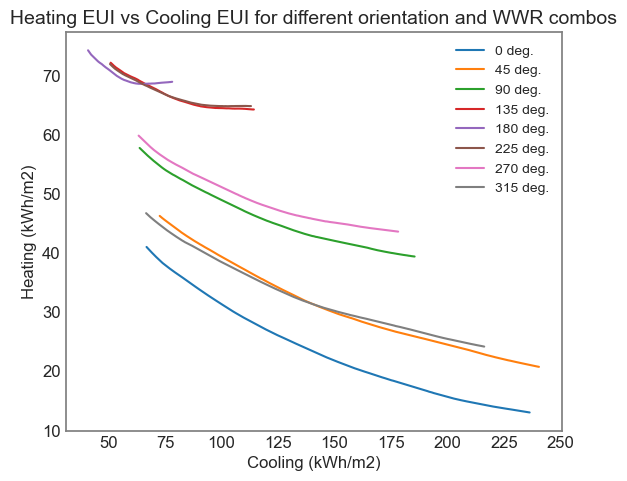

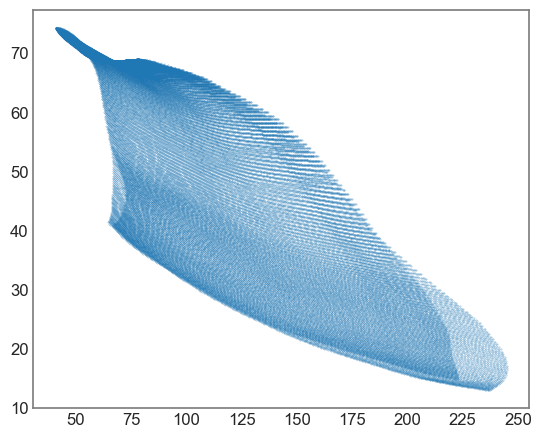

In [56]:
data = res.unstack(level="wwr")
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
im = ax[0].imshow(data.Cooling.values.T, cmap=custom_blues)
n = 25
x_tick_labels = [round(x * 360 / (2 * np.pi)) for x in data.index.values][::n]
y_tick_labels = [round(y * 100) for y in data.Cooling.columns.get_level_values(-1)][::n]
ax[0].set_yticks(range(0, 256, 25), y_tick_labels)
ax[0].set_xticks(range(0, 256, 25), x_tick_labels, rotation=45)
ax[0].set_xlabel("Orientation (deg. from S)")
ax[0].set_ylabel("WWR (%)")
ax[0].set_title("Cooling")
fig.colorbar(im, ax=ax[0], label="[kWh/m2]")
im = ax[1].imshow(data.Heating.values.T, cmap=custom_reds)
n = 25
x_tick_labels = [round(x * 360 / (2 * np.pi)) for x in data.index.values][::n]
y_tick_labels = [round(y * 100) for y in data.Cooling.columns.get_level_values(-1)][::n]
ax[1].set_yticks(range(0, 256, 25), y_tick_labels)
ax[1].set_xticks(range(0, 256, 25), x_tick_labels, rotation=45)
ax[1].set_xlabel("Orientation (deg. from S)")
ax[1].set_ylabel("WWR (%)")
ax[1].set_title("Heating")
# add contour plot
fig.colorbar(im, ax=ax[1], label="[kWh/m2]")
fig.tight_layout()
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
levels = 15
im = ax[0].contourf(
    data.index,
    data.Cooling.columns,
    data.Cooling.values.T,
    levels=levels,
    cmap=custom_blues,
)
ax[0].set_xticks(
    [0, np.pi / 2, np.pi, 3 * np.pi / 2, 2 * np.pi],
    ["0", "90", "180", "270", "360"],
)
ax[0].set_yticks([0.2, 0.4, 0.6, 0.8], ["20", "40", "60", "80"])
ax[0].set_xlabel("Orientation (deg. from S)")
ax[0].set_ylabel("WWR (%)")
ax[0].set_title("Cooling")
im2 = ax[1].contourf(
    data.index,
    data.Cooling.columns,
    data.Heating.values.T,
    levels=levels,
    cmap=custom_reds,
)
ax[1].set_xticks(
    [0, np.pi / 2, np.pi, 3 * np.pi / 2, 2 * np.pi],
    ["0", "90", "180", "270", "360"],
)
ax[1].set_yticks([0.2, 0.4, 0.6, 0.8], ["20", "40", "60", "80"])
ax[1].set_xlabel("Orientation (deg. from S)")
ax[1].set_ylabel("WWR (%)")
ax[1].set_title("Heating")
fig.colorbar(im2, ax=ax[1], label="[kWh/m2]")
fig.colorbar(im, ax=ax[0], label="[kWh/m2]")
im = ax[2].contourf(
    data.index,
    data.Cooling.columns,
    data.Cooling.values.T + data.Heating.values.T,
    levels=levels,
    cmap="plasma",
)
ax[2].set_xlabel("Orientation (deg. from S)")
ax[2].set_ylabel("WWR (%)")
ax[2].set_title("Total Thermal Demand")
fig.colorbar(im, ax=ax[2], label="[kWh/m2]")

fig.tight_layout()

plt.figure()

n = 8
for i in range(n):
    plt.plot(
        data.iloc[i * (len(data) // n) : i * (len(data) // n) + 1]
        .stack(level=-1)
        .Cooling,
        data.iloc[i * (len(data)) // n : i * (len(data) // n) + 1]
        .stack(level=-1)
        .Heating,
        # s=1.0,
        label=f"{round(i*360//n)} deg.",
        # alpha=0.5,
    )
plt.xlabel("Cooling (kWh/m2)")
plt.ylabel("Heating (kWh/m2)")
plt.title("Heating EUI vs Cooling EUI for different orientation and WWR combos")
plt.legend()

plt.figure()
plt.scatter(
    data.stack(level=-1).Cooling,
    data.stack(level=-1).Heating,
    s=0.1,
    alpha=0.5,
)

In [89]:
sweeps = shading_df.copy(deep=True)
for col in sweeps.columns:
    if col.startswith("shading"):
        sweeps[col] = 0
sweeps = sweeps.iloc[0:1]
sweep_ix = pd.MultiIndex.from_product(
    [np.linspace(0, 2 * np.pi, 256), np.linspace(0.2, 0.8, 256)],
    names=["orientation", "wwr"],
)

sweepdf = sweeps.reindex(sweep_ix).drop(columns=["orientation", "wwr"])
for col in sweeps.columns:
    if col.startswith("shading"):
        sweepdf[col] = 0.0
    elif col not in sweepdf.index.names:
        sweepdf[col] = sweeps[col].values[0]
    else:
        pass
sweepdf = sweepdf.reset_index()
sweepdf["building_id"] = range(len(sweepdf))
sweepdf["EquipmentPowerDensity"] = np.random.uniform(0, 20, len(sweepdf))
sweepdf["LightingPowerDensity"] = np.random.uniform(0, 20, len(sweepdf))
sweepdf["PeopleDensity"] = np.random.uniform(0, 0.1, len(sweepdf))
sweepdf["VentilationPerArea"] = np.random.uniform(0, 0.001, len(sweepdf))
sweepdf["VentilationPerPerson"] = np.random.uniform(0, 0.01, len(sweepdf))
sweepdf["Infiltration"] = np.random.uniform(0, 0.001, len(sweepdf))
shoebox_results, monthly_results, annual_results = predict_ubem(
    trainer=trainer,
    surrogate=surrogate,
    features=sweepdf,
    schedules=scheds,
    climate=climate,
    apply_cops=False,
    batch_size=32,
)
# annual_results
res = shoebox_results["Perimeter"].T.groupby("Name").sum().T
res_a = annual_results
res.index = sweep_ix
res_a.index = sweep_ix

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 2048/2048 [00:44<00:00, 46.37it/s]


([], [])

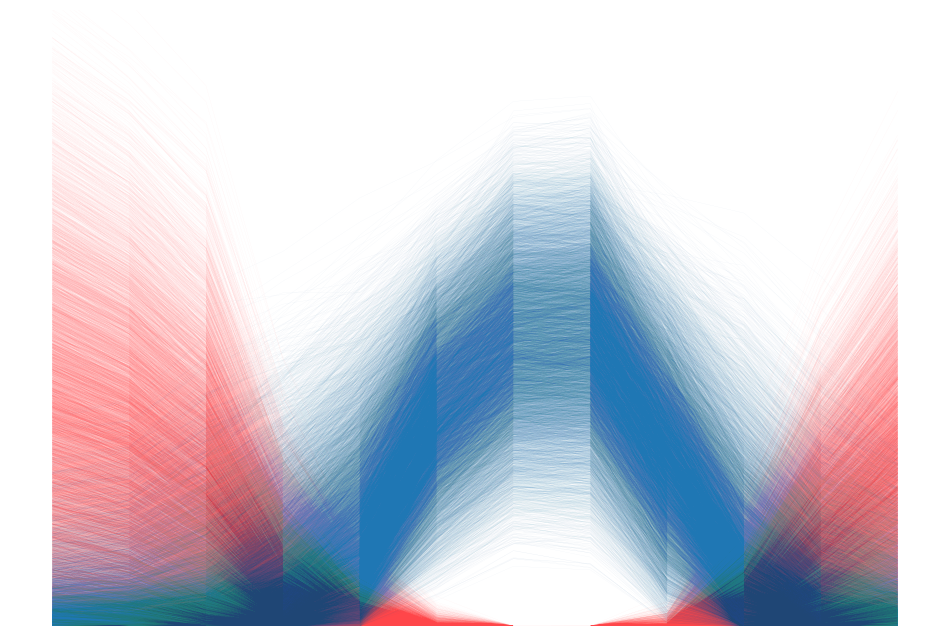

In [90]:
fig = plt.figure(figsize=(12, 8))
d = monthly_results.sample(frac=0.2)

ax = plt.plot(
    d.Heating.values.T,
    color="#ff464a",
    alpha=0.1,
    lw=0.1,
)
ax = plt.plot(
    d.Cooling.values.T * 1.25,
    color="#1f77b4",
    alpha=0.1,
    lw=0.1,
)
# hide the axes and border
plt.ylim(0, d.Heating.max().max() * 0.9)
plt.box(False)
plt.grid(False)
plt.xticks([])
plt.yticks([])

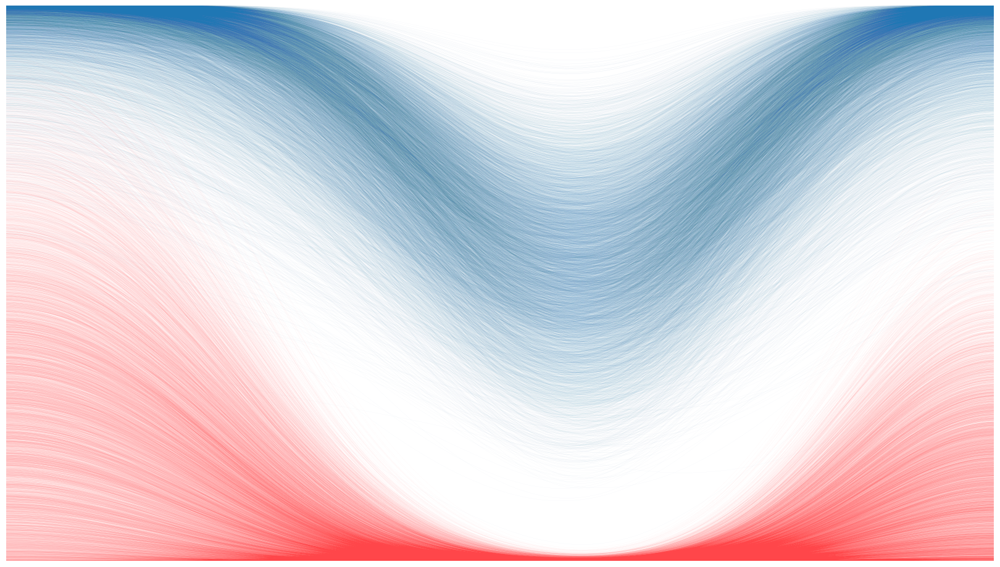

In [141]:
from scipy.ndimage import gaussian_filter1d

# interpolate the cooling values
c = []
h = []
k = monthly_results.sample(frac=0.15)
for i in range(len(k)):
    cooling = np.interp(
        np.linspace(0, 11, 144), np.arange(12), k.iloc[i].Cooling.values
    )
    heating = np.interp(
        np.linspace(0, 11, 144), np.arange(12), k.iloc[i].Heating.values
    )
    c.append(cooling)
    h.append(heating)
cooling = np.array(c)
heating = np.array(h)
# smooth the curves
cooling = gaussian_filter1d(cooling, sigma=12)
heating = gaussian_filter1d(heating, sigma=12)
# plot the smoothed curves
fig = plt.figure(figsize=(16, 9))
plt.plot(
    heating.max() * 0.9 + -1 * cooling.T * 1.25,
    color="#1f77b4",
    lw=0.1,
    alpha=0.1,
    label="Cooling",
)
ax = plt.plot(
    heating.T,
    color="#ff464a",
    lw=0.1,
    alpha=0.1,
    label="Heating",
)
# hide the axes and border
# plt.ylim(0, heating.max() * 0.9)
plt.ylim(0, heating.max() * 0.9)
plt.xlim(0, 143)
plt.box(False)
plt.grid(False)
plt.xticks([])
plt.yticks([])
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
plt.axis("off")
# make sure background is fully white
fig.patch.set_facecolor("white")
# save the image to a file
# plt.savefig(
#     "c:/users/szvsw/desktop/cooling-heating-reverse.png",
#     dpi=300,
#     bbox_inches="tight",
#     pad_inches=0,
# )

([], [])

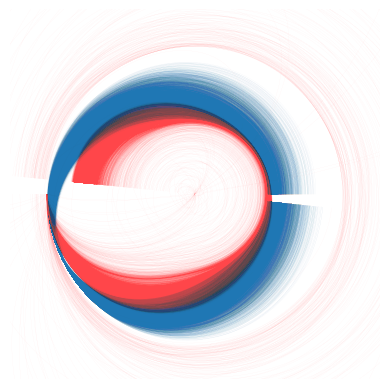

In [124]:
n_pts = cooling.shape[-1]
for i in range(cooling.shape[0]):
    d = cooling[i] / cooling[i].max()
    theta = np.linspace(0, 2 * np.pi - 0.1, n_pts)
    x = np.cos(theta)
    y = np.sin(theta)
    # displace each point by the slope a distance according to d
    plt.plot(x + x * d, y + y * d, lw=0.1, alpha=0.1, color="#1f77b4")
    d = heating[i] / heating[i].max()
    plt.plot(-(x + x * d), -(y + y * d), lw=0.1, alpha=0.1, color="#ff464a")
plt.xlim(-2.5, 2.5)
plt.ylim(-2.5, 2.5)
plt.gca().set_aspect("equal")
plt.grid(False)
# hide the axes and border
plt.box(False)
plt.xticks([])
plt.yticks([])

## SHGC and U-VAl

In [ ]:
sweeps = shading_df.copy(deep=True)
for col in sweeps.columns:
    if col.startswith("shading"):
        sweeps[col] = 0
sweeps = sweeps.iloc[0:1]
sweep_ix = pd.MultiIndex.from_product(
    [np.linspace(0.5, 5, 256), np.linspace(0.4, 0.9, 256)],
    names=["WindowUValue", "WindowShgc"],
)

sweepdf = sweeps.reindex(sweep_ix).drop(columns=["WindowUValue", "WindowShgc"])
for col in sweeps.columns:
    if col.startswith("shading"):
        sweepdf[col] = 0.0
    elif col not in sweepdf.index.names:
        sweepdf[col] = sweeps[col].values[0]
    else:
        pass
sweepdf = sweepdf.reset_index()
sweepdf["building_id"] = range(len(sweepdf))
shoebox_results, monthly_results, annual_results = predict_ubem(
    trainer=trainer,
    surrogate=surrogate,
    features=sweepdf,
    schedules=scheds,
    climate=climate,
    apply_cops=False,
    batch_size=32,
)
# annual_results
res = shoebox_results["Perimeter"].T.groupby("Name").sum().T
res_a = annual_results
res.index = sweep_ix
res_a.index = sweep_ix

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 2048/2048 [00:37<00:00, 54.77it/s]


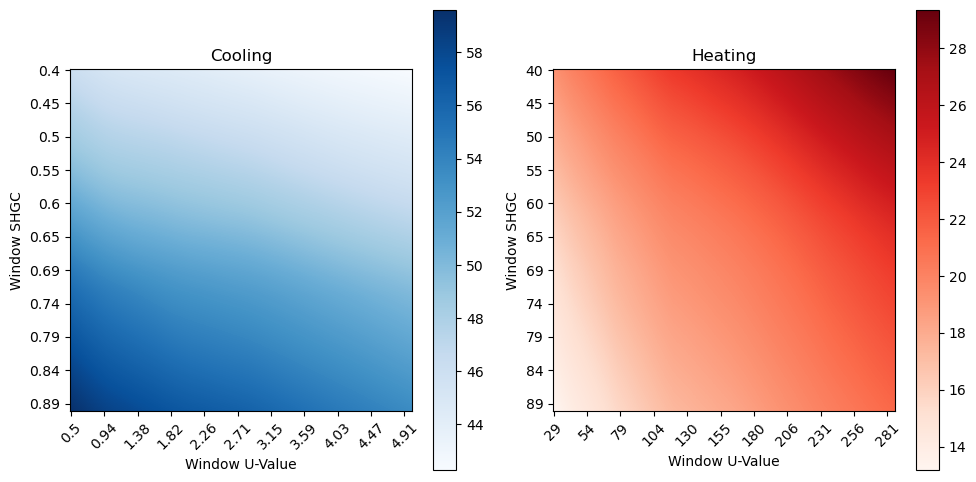

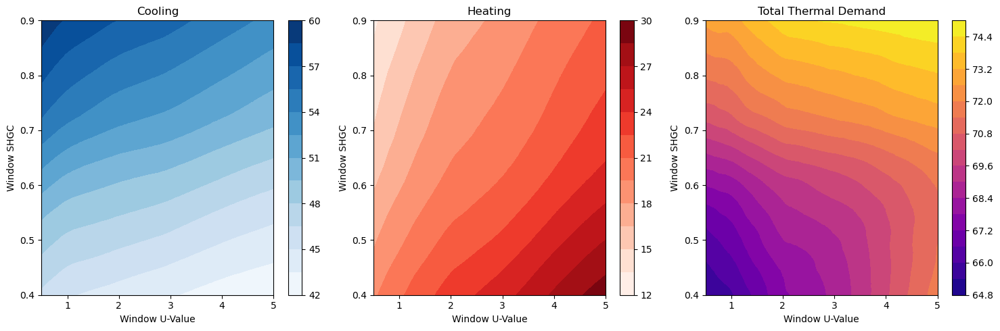

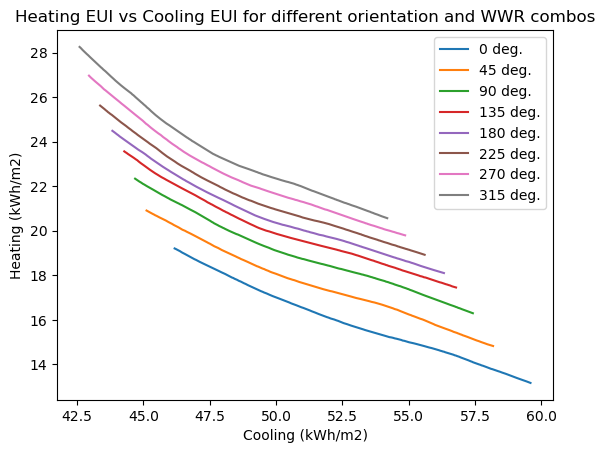

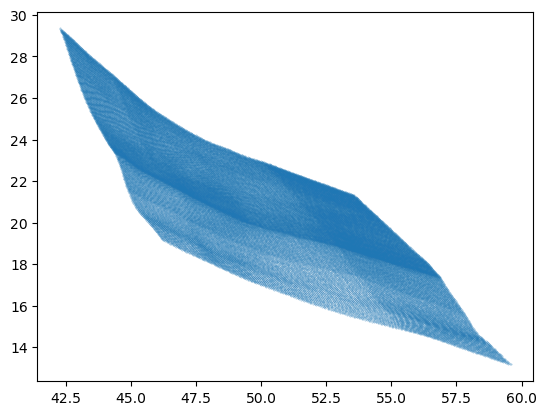

In [ ]:
data = res_a.unstack(level="WindowShgc")
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
im = ax[0].imshow(data.Cooling.values.T, cmap="Blues")
n = 25
x_tick_labels = [round(x, 2) for x in data.index.values][::n]
y_tick_labels = [round(y, 2) for y in data.Cooling.columns.get_level_values(-1)][::n]
ax[0].set_yticks(range(0, 256, 25), y_tick_labels)
ax[0].set_xticks(range(0, 256, 25), x_tick_labels, rotation=45)
ax[0].set_ylabel("Window SHGC")
ax[0].set_xlabel("Window U-Value")
ax[0].set_title("Cooling")
fig.colorbar(im, ax=ax[0])
im = ax[1].imshow(data.Heating.values.T, cmap="Reds")
n = 25
x_tick_labels = [round(x * 360 / (2 * np.pi)) for x in data.index.values][::n]
y_tick_labels = [round(y * 100) for y in data.Cooling.columns.get_level_values(-1)][::n]
ax[1].set_yticks(range(0, 256, 25), y_tick_labels)
ax[1].set_xticks(range(0, 256, 25), x_tick_labels, rotation=45)
ax[1].set_ylabel("Window SHGC")
ax[1].set_xlabel("Window U-Value")
ax[1].set_title("Heating")
# add contour plot
fig.colorbar(im, ax=ax[1])
fig.tight_layout()
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
levels = 15
im = ax[0].contourf(
    data.index,
    data.Cooling.columns,
    data.Cooling.values.T,
    levels=levels,
    cmap="Blues",
)
# ax[0].set_xticks(
#     [],
#     ["0", "90", "180", "270", "360"],
# )
# ax[0].set_yticks([0.2, 0.4, 0.6, 0.8], ["20", "40", "60", "80"])
ax[0].set_xlabel("Window U-Value")
ax[0].set_ylabel("Window SHGC")
ax[0].set_title("Cooling")
im2 = ax[1].contourf(
    data.index,
    data.Cooling.columns,
    data.Heating.values.T,
    levels=levels,
    cmap="Reds",
)
ax[1].set_xlabel("Window U-Value")
ax[1].set_ylabel("Window SHGC")
ax[1].set_title("Heating")
fig.colorbar(im2, ax=ax[1])
fig.colorbar(im, ax=ax[0])
im = ax[2].contourf(
    data.index,
    data.Cooling.columns,
    data.Cooling.values.T + data.Heating.values.T,
    levels=levels,
    cmap="plasma",
)
ax[2].set_xlabel("Window U-Value")
ax[2].set_ylabel("Window SHGC")
ax[2].set_title("Total Thermal Demand")
fig.colorbar(im, ax=ax[2])

fig.tight_layout()

plt.figure()

n = 8
for i in range(n):
    plt.plot(
        data.iloc[i * (len(data) // n) : i * (len(data) // n) + 1]
        .stack(level=-1)
        .Cooling,
        data.iloc[i * (len(data)) // n : i * (len(data) // n) + 1]
        .stack(level=-1)
        .Heating,
        # s=1.0,
        label=f"{round(i*360//n)} deg.",
        # alpha=0.5,
    )
plt.xlabel("Cooling (kWh/m2)")
plt.ylabel("Heating (kWh/m2)")
plt.title("Heating EUI vs Cooling EUI for different orientation and WWR combos")
plt.legend()

plt.figure()
plt.scatter(
    data.stack(level=-1).Cooling,
    data.stack(level=-1).Heating,
    s=0.1,
    alpha=0.5,
)

## NREL

### Automated

In [1]:
import gc
import tempfile
import time
from concurrent.futures import ThreadPoolExecutor
from functools import partial
from pathlib import Path

import boto3
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from botocore import UNSIGNED
from botocore.client import Config
from ladybug.epw import EPW
from lightning.pytorch import Trainer
from ml.predict import predict_ubem
from ml.surrogate import Surrogate
from tqdm.notebook import tqdm
from weather.weather import extract

folder = Path("c:/users/szvsw/downloads")
resstock_path = folder / "resstock_usa.h5"
lookup_path = folder / "spatial_tract_lookup_table.csv"
gpd_names = [
    "map_of_pumas_in_census_region_3_south.geojson",
    "map_of_pumas_in_census_region_1_northeast.geojson",
    "map_of_pumas_in_census_region_2_midwest.geojson",
    "map_of_pumas_in_census_region_4_west.geojson",
]


surrogate_cache = {}
parquet_cache = {}
preds_cache = {}


# TODO: solar position computation; isolate and extract in climate
def calculate_dew_point(T, RH):
    # Constants for the Magnus-Tetens formula
    a = 17.62
    b = 243.12

    # Saturation vapor pressure (es)
    es = 6.112 * np.exp((a * T) / (b + T))

    # Actual vapor pressure (e)
    e = (RH / 100.0) * es

    # Dew point temperature (Td)
    Td = (b * np.log(e / 6.112)) / (a - np.log(e / 6.112))

    return Td


def download_and_open_epw_csv(
    s3_client, bucket: str, local_output_path: Path, key: str
):
    output_path = local_output_path / Path(key).name
    s3_client.download_file(
        Bucket=bucket,
        Key=key,
        Filename=output_path.as_posix(),
    )
    return pd.read_csv(output_path)


channel_map = {
    "dry_bulb_temperature": "Dry Bulb Temperature [°C]",
    "dew_point_temperature": lambda data: calculate_dew_point(
        data["Dry Bulb Temperature [°C]"], data["Relative Humidity [%]"]
    ),
    "relative_humidity": "Relative Humidity [%]",
    "wind_direction": "Wind Direction [Deg]",
    "wind_speed": "Wind Speed [m/s]",
    "direct_normal_radiation": "Direct Normal Radiation [W/m2]",
    "diffuse_horizontal_radiation": "Diffuse Horizontal Radiation [W/m2]",
    "solar_azimuth": None,
    "solar_elevation": None,
    "latitude": None,
    "longitude": None,
}


light_cols = [
    # "out.electricity.lighting_exterior.energy_consumptiony",
    # "out.electricity.lighting_garage.energy_consumption",
    "out.electricity.lighting_interior.energy_consumption",
    "out.natural_gas.lighting.energy_consumption",
]
elec_cols = [
    # "out.electricity.ceiling_fan.energy_consumption",
    "out.electricity.clothes_dryer.energy_consumption",
    "out.electricity.clothes_washer.energy_consumption",
    # "out.electricity.cooling_fans_pumps.energy_consumption",
    "out.electricity.cooling.energy_consumption",
    "out.electricity.dishwasher.energy_consumption",
    "out.electricity.freezer.energy_consumption",
    # "out.electricity.heating_fans_pumps.energy_consumption",
    # "out.electricity.heating_hp_bkup.energy_consumption",
    # "out.electricity.heating.energy_consumption",
    # "out.electricity.hot_tub_heater.energy_consumption",
    # "out.electricity.hot_tub_pump.energy_consumption",
    # "out.electricity.hot_water.energy_consumption",
    # "out.electricity.lighting_exterior.energy_consumption",
    # "out.electricity.lighting_garage.energy_consumption",
    # "out.electricity.lighting_interior.energy_consumption",
    # "out.electricity.mech_vent.energy_consumption",
    "out.electricity.plug_loads.energy_consumption",
    # "out.electricity.pool_heater.energy_consumption",
    # "out.electricity.pool_pump.energy_consumption",
    # "out.electricity.pv.energy_consumption",
    "out.electricity.range_oven.energy_consumption",
    "out.electricity.refrigerator.energy_consumption",
    # "out.electricity.well_pump.energy_consumption",
    # "out.electricity.net.energy_consumption",
    # "out.electricity.total.energy_consumption",
]
res_thermal_output_cols = [
    "out.load.heating.energy_delivered.kbtu",
    "out.load.cooling.energy_delivered.kbtu",
]


def download_and_open_parquet(
    key: str,
    s3_client,
    bucket: str,
):
    with tempfile.TemporaryDirectory() as tmpdir:
        if key in parquet_cache:
            return parquet_cache[key]
        output_path = Path(tmpdir) / Path(key).name
        s3_client.download_file(
            Bucket=bucket,
            Key=key,
            Filename=output_path.as_posix(),
        )
        df_out = pd.read_parquet(output_path)
        df_out.set_index("timestamp", append=True, inplace=True)
        df_out = df_out[light_cols + elec_cols + res_thermal_output_cols]
        assert df_out.index.names == ["bldg_id", "timestamp"]
        assert df_out.index.get_level_values("bldg_id").nunique() == 1
        df_out.reset_index("bldg_id", drop=True, inplace=True)
        df_out.index = df_out.index - pd.Timedelta("15min")
        df_out = df_out.resample("1H").sum()
        # parquet_cache[key] = df_out
        return df_out


gdfs = []
for name in gpd_names:
    gdf = gpd.read_file(folder / name)
    gdfs.append(gdf)
gdf = pd.concat(gdfs)

rs_df = pd.read_hdf(resstock_path, key="features")
rs_df.set_index(["building_id", "county"], inplace=True)
rs_df.drop_duplicates(inplace=True)
tract_df = pd.read_csv(lookup_path).set_index("nhgis_county_gisjoin")
county_list = rs_df.index.get_level_values("county").unique().to_list()
counties_by_cz = {
    cz: rs_df[rs_df.climate_zone == cz]
    .index.get_level_values("county")
    .unique()
    .tolist()
    for cz in rs_df.climate_zone.unique()
}
czs = sorted(list(counties_by_cz.keys()))
run_counties = []
print(f"{len(county_list)} counties in resstock data, {len(rs_df)} buildings")

Couldn't import dot_parser, loading of dot files will not be possible.
3107 counties in resstock data, 548917 buildings


In [2]:
run_counties = []
counted_counties = (
    rs_df.set_index("climate_zone", append=True)
    .groupby(["climate_zone", "county"])
    .count()[["area"]]
    .rename(columns={"area": "count"})
)
counted_counties = (
    counted_counties.reset_index(["climate_zone"])
    .sort_values(["climate_zone", "count"], ascending=False)
    .reset_index()
    .set_index("climate_zone")
)
for cz in czs:
    counties_in_cz = counted_counties.loc[cz]

    run_counties.extend(counties_in_cz.iloc[:3]["county"].values.tolist())

counted_counties = (
    rs_df.set_index("state", append=True)
    .groupby(["state", "county"])
    .count()[["area"]]
    .rename(columns={"area": "count"})
)
counted_counties = (
    counted_counties.reset_index(["state"])
    .sort_values(["state", "county"], ascending=False)
    .reset_index()
    .set_index("state")
)
for state in sorted(rs_df["state"].unique()):
    counties_in_state = counted_counties.loc[state]
    if state == "DC":
        continue
    run_counties.extend(counties_in_state.iloc[:1]["county"].values.tolist())
run_counties = list(set(run_counties))
len(run_counties)

92

  0%|          | 0/92 [00:00<?, ?it/s]


 -------------------- G3001110 --------------------
Loading surrogate model from registry...


c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\utilities\parsing.py:198: Attribute 'target_transform' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['target_transform'])`.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\utilities\parsing.py:198: Attribute 'weather_transform' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['weather_transform'])`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to acce

Surrogate model loaded.
Loading Data For County
GISMATCH                                                   3000700
GEOID                                                      3000700
STATEFIP                                                        30
State                                                      Montana
PUMA                                                         00700
Name                                            Billings City PUMA
state_abbr                                                      MT
division_name                                             Mountain
region_name                                                   West
puma_tsv                                                 MT, 00700
geometry         (POLYGON ((-108.48607300007333 45.848405999693...
Name: G30000700, dtype: object
done loading data for county: found 275 buildings
Attempting to pull 275 parquet files...


  0%|          | 0/275 [00:00<?, ?it/s]

Succesfully pulled 275 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
33 setpoints are crossed over.
115 setpoints are out of bounds (heating: 34, cooling:91).
121 buildings have setpoint errors.
154 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 154/275 buildings in G3001110 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0:   5%|▌         | 2/39 [00:02<00:41,  0.89it/s]

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\torch\nn\modules\conv.py:309: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\Convolution.cpp:1004.)
  return F.conv1d(input, weight, bias, self.stride,


Predicting DataLoader 0: 100%|██████████| 39/39 [00:03<00:00, 12.61it/s]
Beginning evaluation...
Done evaluating.


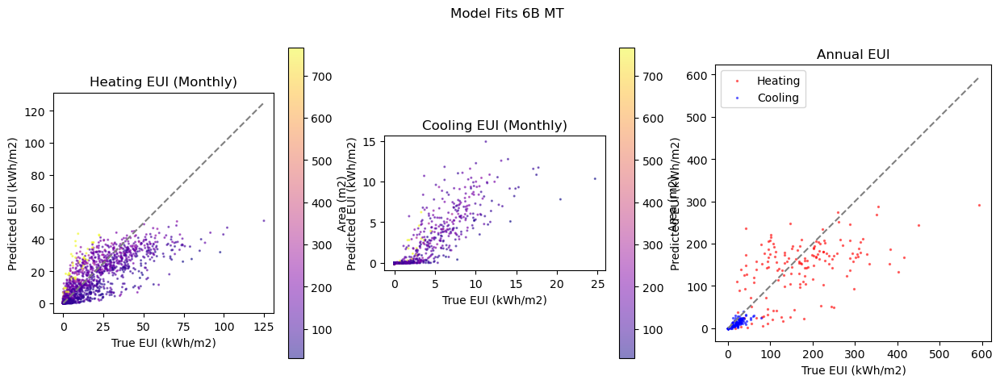

annual urban euis
               True        Pred
Name                           
Cooling   14.278946    9.032196
Heating  155.567887  160.325436
building errors
        Annual             Monthly            
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE  RMSE
Name                                          
Cooling   70.1 -40.1  11.3    87.5 -40.1   1.8
Heating   53.2 -17.8  92.8    73.1 -17.8  10.6

 -------------------- G1200110 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G1200110 has 14 PUMAs; lat/lon may be off
GISMATCH                                                   1201103
GEOID                                                      1201103
STATEFIP                                                        12
State                                                      Florida
PUMA                                                         01103
Name             Broward County--Deerfield, Pompano Beach (Nort...
state_abbr   

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/2000 [00:00<?, ?it/s]

Succesfully pulled 2000 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
355 setpoints are crossed over.
854 setpoints are out of bounds (heating: 590, cooling:374).
896 buildings have setpoint errors.
1104 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 1104/3350 buildings in G1200110 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 276/276 [00:05<00:00, 53.53it/s]
Beginning evaluation...
Done evaluating.


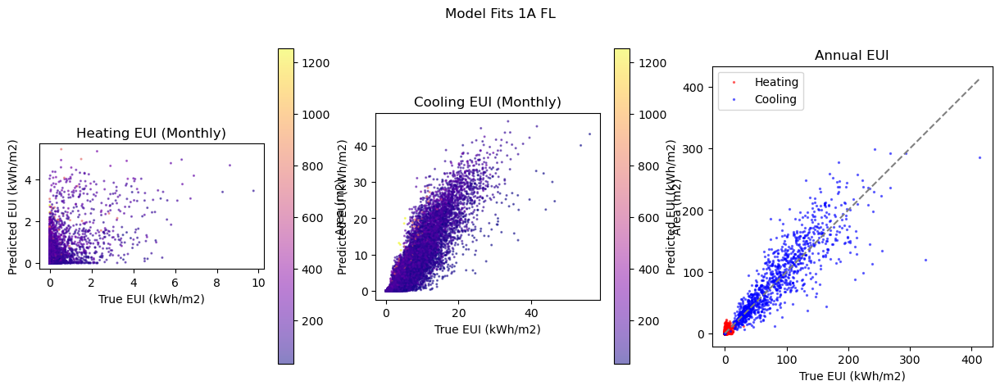

annual urban euis
              True       Pred
Name                         
Cooling  76.437912  84.798819
Heating   1.430064   3.607549
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   34.0   4.5  28.8    56.2   4.5  4.0
Heating  276.1  77.2   3.9   415.5  77.2  0.5

 -------------------- G1700310 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G1700310 has 34 PUMAs; lat/lon may be off
GISMATCH                                                   1703501
GEOID                                                      1703501
STATEFIP                                                        17
State                                                     Illinois
PUMA                                                         03501
Name             Chicago City (North)--Edgewater, Uptown & Roge...
state_abbr                

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/2000 [00:00<?, ?it/s]

Succesfully pulled 2000 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
432 setpoints are crossed over.
1039 setpoints are out of bounds (heating: 289, cooling:867).
1085 buildings have setpoint errors.
915 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 915/8952 buildings in G1700310 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 229/229 [00:04<00:00, 53.61it/s]
Beginning evaluation...
Done evaluating.


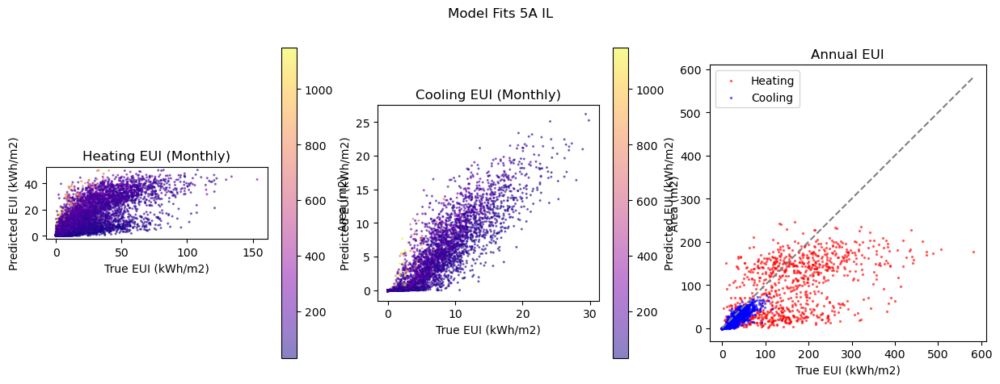

annual urban euis
               True        Pred
Name                           
Cooling   26.936031   19.907214
Heating  154.272281  115.101525
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   49.5 -32.2   15.6    69.0 -32.2   2.2
Heating   66.4 -41.0  108.6   100.9 -41.0  13.8

 -------------------- G3500610 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   3500700
GEOID                                                      3500700
STATEFIP                                                        35
State                                                   New Mexico
PUMA                                                         00700
Name             Valencia, Bernalillo (East Mountains) Counties...
state_abbr                                               

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/125 [00:00<?, ?it/s]

Succesfully pulled 125 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
21 setpoints are crossed over.
55 setpoints are out of bounds (heating: 25, cooling:38).
56 buildings have setpoint errors.
69 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 69/125 buildings in G3500610 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 18/18 [00:00<00:00, 29.89it/s]
Beginning evaluation...
Done evaluating.


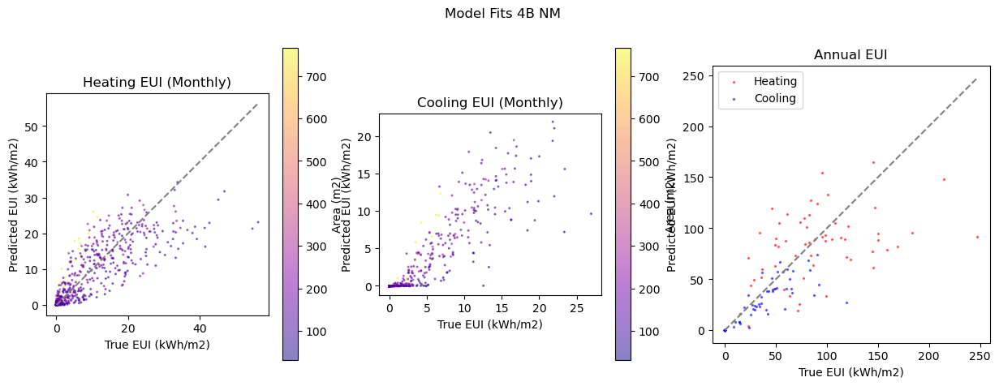

annual urban euis
              True       Pred
Name                         
Cooling  27.188366  22.855183
Heating  68.618822  73.419972
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   59.3 -25.9  17.6    67.7 -25.9  2.6
Heating   55.6  -8.6  42.3    77.8  -8.6  4.9

 -------------------- G3600810 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G3600810 has 14 PUMAs; lat/lon may be off
GISMATCH                                                   3604109
GEOID                                                      3604109
STATEFIP                                                        36
State                                                     New York
PUMA                                                         04109
Name             NYC-Queens Community District 2--Sunnyside & W...
state_abbr                

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/2000 [00:00<?, ?it/s]

Succesfully pulled 2000 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
576 setpoints are crossed over.
1087 setpoints are out of bounds (heating: 281, cooling:951).
1134 buildings have setpoint errors.
866 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 866/3489 buildings in G3600810 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 217/217 [00:04<00:00, 51.79it/s]
Beginning evaluation...
Done evaluating.


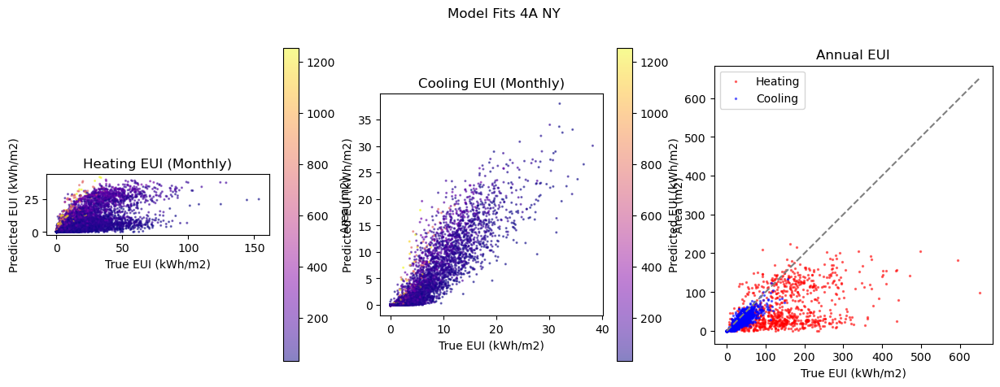

annual urban euis
               True       Pred
Name                          
Cooling   30.020438  24.714678
Heating  135.432457  78.700326
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   45.9 -27.3   17.1    69.4 -27.3   2.5
Heating   81.0 -59.3  119.4   118.6 -59.3  14.7

 -------------------- G1303210 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   1300800
GEOID                                                      1300800
STATEFIP                                                        13
State                                                      Georgia
PUMA                                                         00800
Name             Southwest Georgia Regional Commission (East)--...
state_abbr                                                   

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/38 [00:00<?, ?it/s]

Succesfully pulled 38 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
14 setpoints are crossed over.
16 setpoints are out of bounds (heating: 7, cooling:13).
19 buildings have setpoint errors.
19 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 19/38 buildings in G1303210 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 5/5 [00:00<00:00, 19.37it/s]
Beginning evaluation...
Done evaluating.


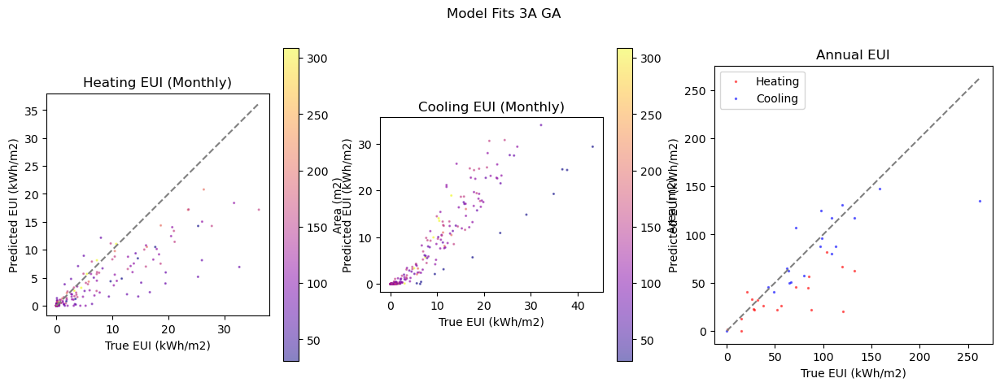

annual urban euis
              True       Pred
Name                         
Cooling  85.090157  80.792388
Heating  57.232175  35.720883
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   35.5 -10.8  33.6    44.1 -10.8  3.7
Heating   65.5 -42.8  38.5    97.4 -42.8  4.8

 -------------------- G3901750 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   3902300
GEOID                                                      3902300
STATEFIP                                                        39
State                                                         Ohio
PUMA                                                         02300
Name                      Seneca, Crawford & Wyandot Counties PUMA
state_abbr                                                      OH
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/41 [00:00<?, ?it/s]

Succesfully pulled 41 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
6 setpoints are crossed over.
18 setpoints are out of bounds (heating: 3, cooling:15).
18 buildings have setpoint errors.
23 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 23/41 buildings in G3901750 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 6/6 [00:00<00:00, 16.71it/s]
Beginning evaluation...
Done evaluating.


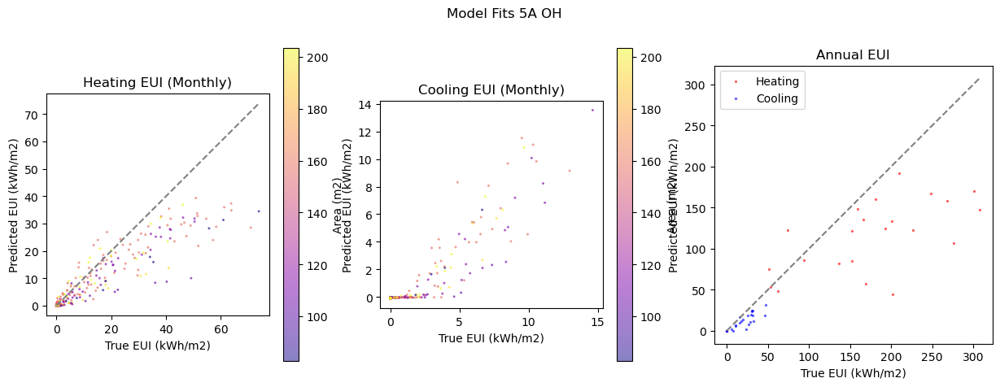

annual urban euis
               True        Pred
Name                           
Cooling   21.041635   12.377152
Heating  166.641025  111.852500
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   55.8 -42.3  11.8    76.8 -42.3  1.6
Heating   49.4 -34.5  83.5    69.9 -34.5  9.8

 -------------------- G4601370 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   4600200
GEOID                                                      4600200
STATEFIP                                                        46
State                                                 South Dakota
PUMA                                                         00200
Name                                            Lakota Region PUMA
state_abbr                                                      SD


c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/4 [00:00<?, ?it/s]

Succesfully pulled 4 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
0 setpoints are crossed over.
1 setpoints are out of bounds (heating: 1, cooling:0).
1 buildings have setpoint errors.
3 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 3/4 buildings in G4601370 county.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Done preparing weather
Clearing prediction cache.
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  8.60it/s]
Beginning evaluation...
Done evaluating.


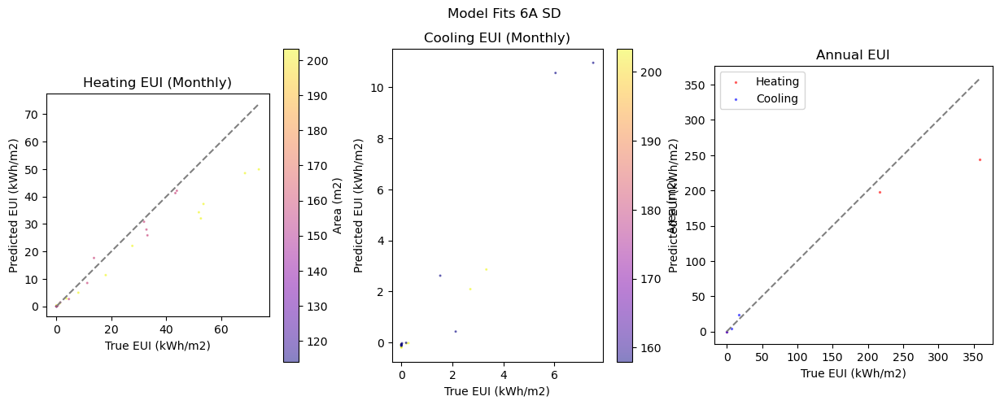

annual urban euis
              True        Pred
Name                          
Cooling    8.57269    9.607533
Heating  225.11953  170.405875
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   50.7  16.2   4.0   125.3  16.2  1.2
Heating   34.8 -23.0  66.6    48.6 -23.0  7.8

 -------------------- G1600870 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   1600400
GEOID                                                      1600400
STATEFIP                                                        16
State                                                        Idaho
PUMA                                                         00400
Name             Ada (North), Payette, Canyon (North), Gem & Wa...
state_abbr                                                      ID
divi

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/19 [00:00<?, ?it/s]

Succesfully pulled 19 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
3 setpoints are crossed over.
5 setpoints are out of bounds (heating: 1, cooling:5).
6 buildings have setpoint errors.
13 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 13/19 buildings in G1600870 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 4/4 [00:00<00:00, 18.46it/s]
Beginning evaluation...
Done evaluating.


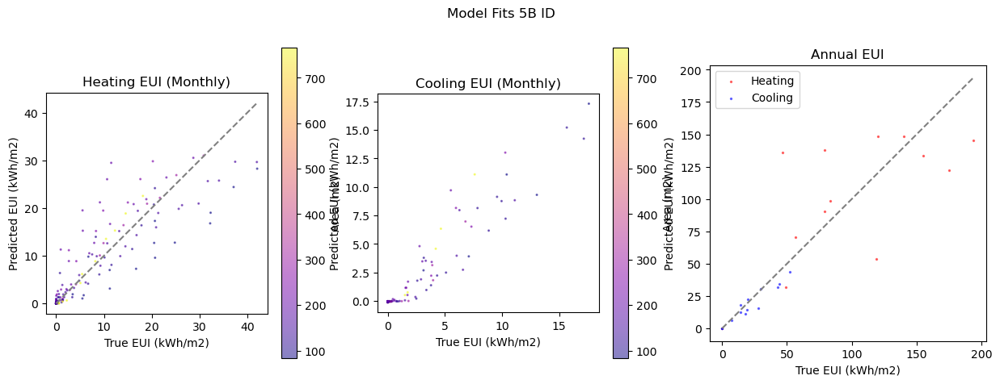

annual urban euis
              True        Pred
Name                          
Cooling  20.534814   18.722642
Heating  96.170493  107.712303
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   28.7 -16.5   6.4    54.2 -16.5  1.2
Heating   42.2   1.6  42.1    59.4   1.6  4.9

 -------------------- G2801630 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   2800900
GEOID                                                      2800900
STATEFIP                                                        28
State                                                  Mississippi
PUMA                                                         00900
Name                 Central Region--Madison & Yazoo Counties PUMA
state_abbr                                                      MS
divi

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/42 [00:00<?, ?it/s]

Succesfully pulled 42 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
9 setpoints are crossed over.
20 setpoints are out of bounds (heating: 8, cooling:14).
20 buildings have setpoint errors.
22 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 22/42 buildings in G2801630 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 6/6 [00:00<00:00, 23.46it/s]
Beginning evaluation...
Done evaluating.


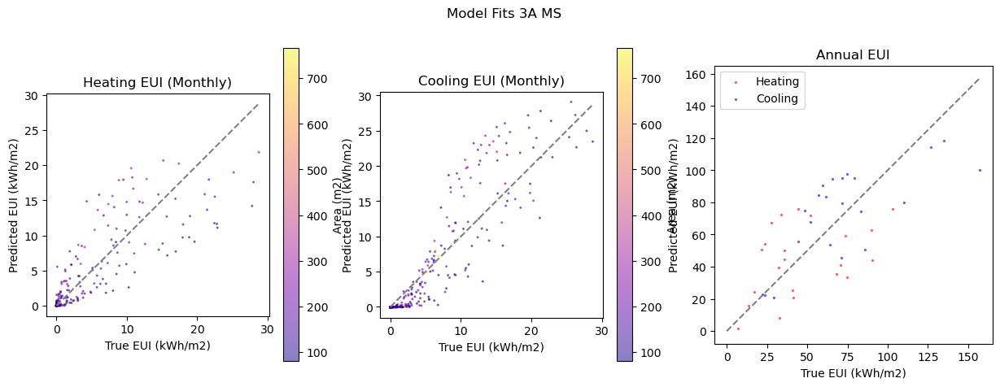

annual urban euis
              True       Pred
Name                         
Cooling  61.362431  64.509001
Heating  41.862050  43.689084
building errors
        Annual            Monthly          
        CVRMSE NMBE  RMSE  CVRMSE NMBE RMSE
Name                                       
Cooling   32.5  1.8  23.6    60.3  1.8  3.6
Heating   56.3 -5.3  26.3    87.8 -5.3  3.4

 -------------------- G0601150 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                    610100
GEOID                                                      0610100
STATEFIP                                                        06
State                                                   California
PUMA                                                         10100
Name                        Sutter & Yuba Counties--Yuba City PUMA
state_abbr                                                      CA
division_name     

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/116 [00:00<?, ?it/s]

Succesfully pulled 116 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
21 setpoints are crossed over.
43 setpoints are out of bounds (heating: 14, cooling:34).
45 buildings have setpoint errors.
71 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 71/116 buildings in G0601150 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 18/18 [00:00<00:00, 37.22it/s]
Beginning evaluation...
Done evaluating.


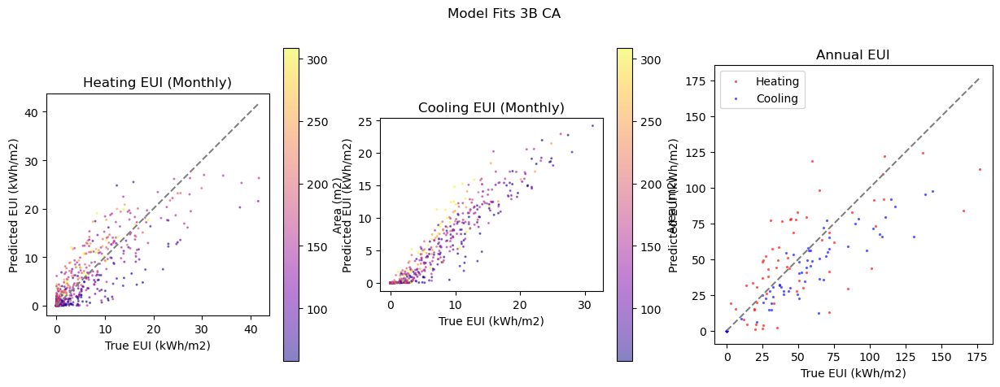

annual urban euis
              True       Pred
Name                         
Cooling  45.511308  35.967250
Heating  42.363158  46.365956
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   40.3 -25.5  19.8    46.1 -25.5  2.4
Heating   58.4  -1.6  25.4    85.9  -1.6  3.1

 -------------------- G5500250 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   5500103
GEOID                                                      5500103
STATEFIP                                                        55
State                                                    Wisconsin
PUMA                                                         00103
Name                                       Dane County (West) PUMA
state_abbr                                                      WI
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/917 [00:00<?, ?it/s]

Succesfully pulled 917 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
151 setpoints are crossed over.
378 setpoints are out of bounds (heating: 67, cooling:337).
390 buildings have setpoint errors.
527 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 527/917 buildings in G5500250 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 132/132 [00:02<00:00, 50.79it/s]
Beginning evaluation...
Done evaluating.


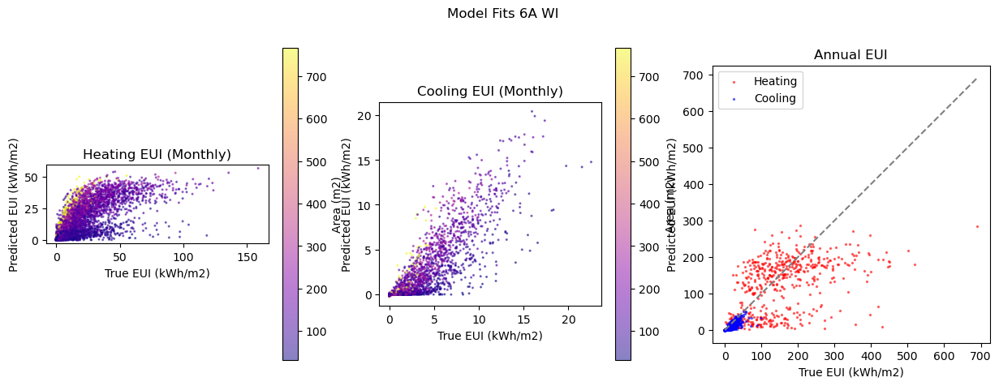

annual urban euis
               True        Pred
Name                           
Cooling   13.839403   10.159706
Heating  149.183595  151.469651
building errors
        Annual             Monthly            
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE  RMSE
Name                                          
Cooling   67.1 -34.8  10.8    87.3 -34.8   1.7
Heating   62.8 -20.2  98.0    92.6 -20.2  12.1

 -------------------- G0801250 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                    800100
GEOID                                                      0800100
STATEFIP                                                        08
State                                                     Colorado
PUMA                                                         00100
Name                Northeast Colorado--Eastern Plains Region PUMA
state_abbr                                                    

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/18 [00:00<?, ?it/s]

Succesfully pulled 18 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
3 setpoints are crossed over.
4 setpoints are out of bounds (heating: 3, cooling:2).
5 buildings have setpoint errors.
13 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 13/18 buildings in G0801250 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 4/4 [00:00<00:00, 19.62it/s]
Beginning evaluation...
Done evaluating.


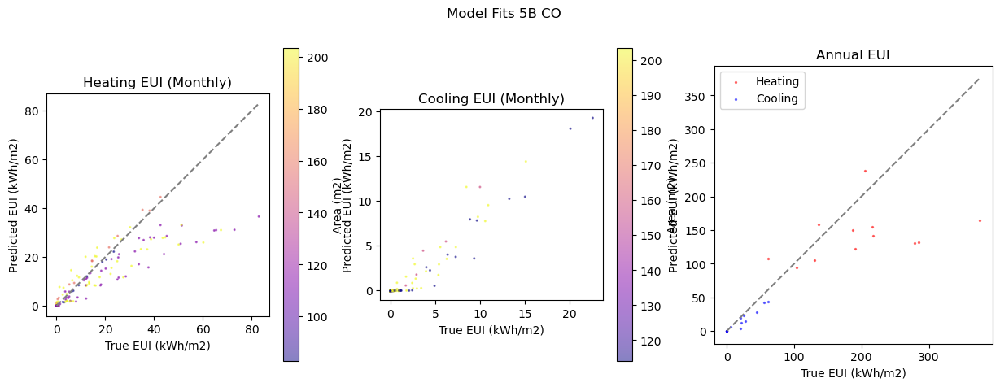

annual urban euis
               True        Pred
Name                           
Cooling   21.681441   14.920706
Heating  175.720285  128.244207
building errors
        Annual             Monthly            
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE  RMSE
Name                                          
Cooling   46.0 -31.6  10.0    58.0 -31.6   1.5
Heating   50.0 -28.7  91.8    68.6 -28.7  10.5

 -------------------- G1702030 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   1702501
GEOID                                                      1702501
STATEFIP                                                        17
State                                                     Illinois
PUMA                                                         02501
Name             Knox, Stark, Bureau, Marshall & Woodford Count...
state_abbr                                                    

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/63 [00:00<?, ?it/s]

Succesfully pulled 63 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
13 setpoints are crossed over.
35 setpoints are out of bounds (heating: 5, cooling:33).
35 buildings have setpoint errors.
28 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 28/63 buildings in G1702030 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 7/7 [00:00<00:00, 46.30it/s]
Beginning evaluation...
Done evaluating.


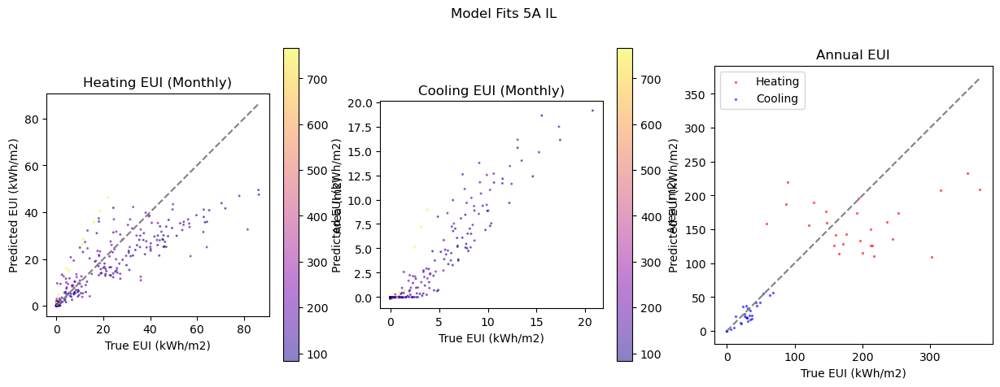

annual urban euis
               True        Pred
Name                           
Cooling   26.827924   24.459427
Heating  177.854287  163.432043
building errors
        Annual             Monthly            
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE  RMSE
Name                                          
Cooling   30.3 -15.7   8.9    51.5 -15.7   1.4
Heating   44.8 -20.0  85.6    65.5 -20.0  10.4

 -------------------- G3000290 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   3000100
GEOID                                                      3000100
STATEFIP                                                        30
State                                                      Montana
PUMA                                                         00100
Name                        Northwest Montana--Kalispell City PUMA
state_abbr                                                    

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/195 [00:00<?, ?it/s]

Succesfully pulled 195 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
18 setpoints are crossed over.
102 setpoints are out of bounds (heating: 52, cooling:72).
104 buildings have setpoint errors.
91 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 91/195 buildings in G3000290 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 23/23 [00:00<00:00, 33.73it/s]
Beginning evaluation...
Done evaluating.


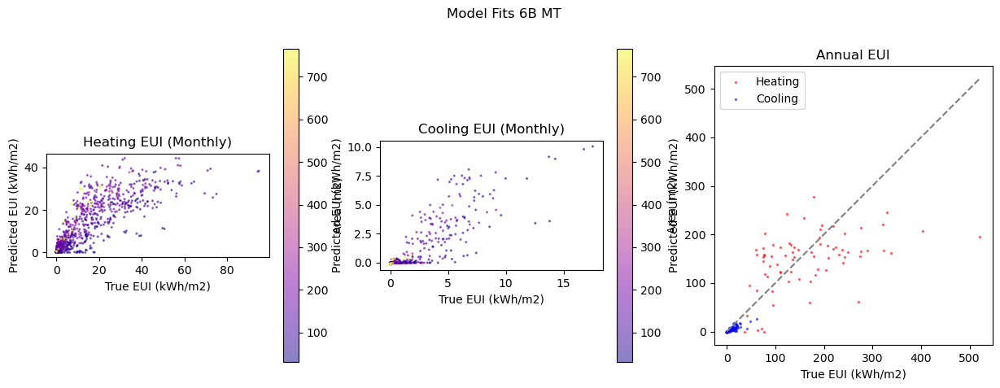

annual urban euis
               True        Pred
Name                           
Cooling    7.686399    3.790117
Heating  122.319339  127.698852
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   86.6 -50.1   8.8   116.0 -50.1  1.4
Heating   57.4 -11.0  76.8    73.7 -11.0  8.3

 -------------------- G1200990 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G1200990 has 11 PUMAs; lat/lon may be off
GISMATCH                                                   1209901
GEOID                                                      1209901
STATEFIP                                                        12
State                                                      Florida
PUMA                                                         09901
Name                            Palm Beach County (Northeast) PUMA
state_abbr        

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/2000 [00:00<?, ?it/s]

Succesfully pulled 2000 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
366 setpoints are crossed over.
892 setpoints are out of bounds (heating: 636, cooling:380).
947 buildings have setpoint errors.
1053 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 1053/2779 buildings in G1200990 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 264/264 [00:05<00:00, 52.02it/s]
Beginning evaluation...
Done evaluating.


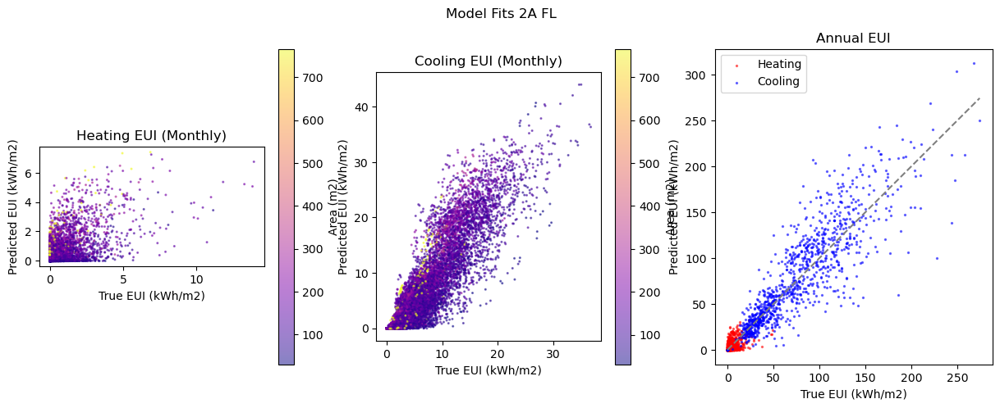

annual urban euis
              True       Pred
Name                         
Cooling  68.204755  74.986672
Heating   3.775811   5.174926
building errors
        Annual            Monthly          
        CVRMSE NMBE  RMSE  CVRMSE NMBE RMSE
Name                                       
Cooling   34.9  4.0  26.4    57.5  4.0  3.7
Heating  144.0  0.1   5.4   224.3  0.1  0.7

 -------------------- G3205100 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   3200200
GEOID                                                      3200200
STATEFIP                                                        32
State                                                       Nevada
PUMA                                                         00200
Name             Carson City, Lyon, Douglas & Storey Counties PUMA
state_abbr                                                      NV
division_name     

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/97 [00:00<?, ?it/s]

Succesfully pulled 97 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
14 setpoints are crossed over.
43 setpoints are out of bounds (heating: 14, cooling:35).
44 buildings have setpoint errors.
53 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 53/97 buildings in G3205100 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 14/14 [00:00<00:00, 26.47it/s]
Beginning evaluation...
Done evaluating.


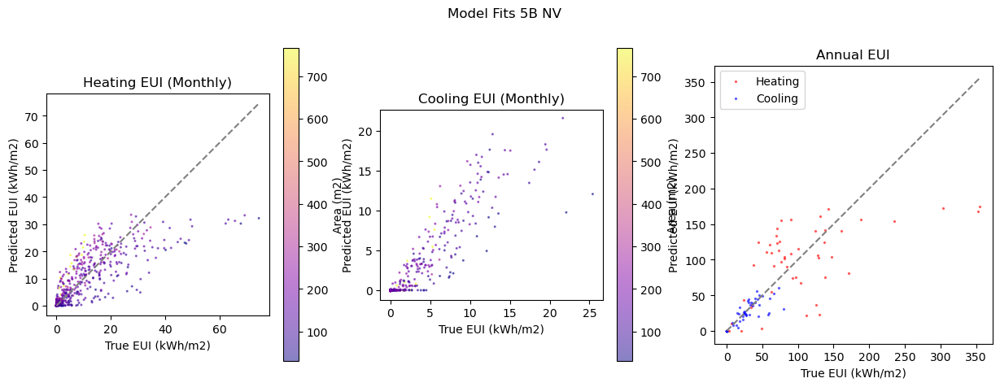

annual urban euis
              True        Pred
Name                          
Cooling  20.487260   20.522139
Heating  87.653709  100.867359
building errors
        Annual            Monthly          
        CVRMSE NMBE  RMSE  CVRMSE NMBE RMSE
Name                                       
Cooling   47.0 -9.5  11.9    67.5 -9.5  1.9
Heating   60.5 -7.0  59.8    83.5 -7.0  6.9

 -------------------- G2601650 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   2600400
GEOID                                                      2600400
STATEFIP                                                        26
State                                                     Michigan
PUMA                                                         00400
Name                         Northwest Lower Peninsula (East) PUMA
state_abbr                                                      MI
division_name 

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/69 [00:00<?, ?it/s]

Succesfully pulled 69 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
9 setpoints are crossed over.
42 setpoints are out of bounds (heating: 25, cooling:28).
42 buildings have setpoint errors.
27 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 27/69 buildings in G2601650 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 7/7 [00:00<00:00, 17.10it/s]
Beginning evaluation...
Done evaluating.


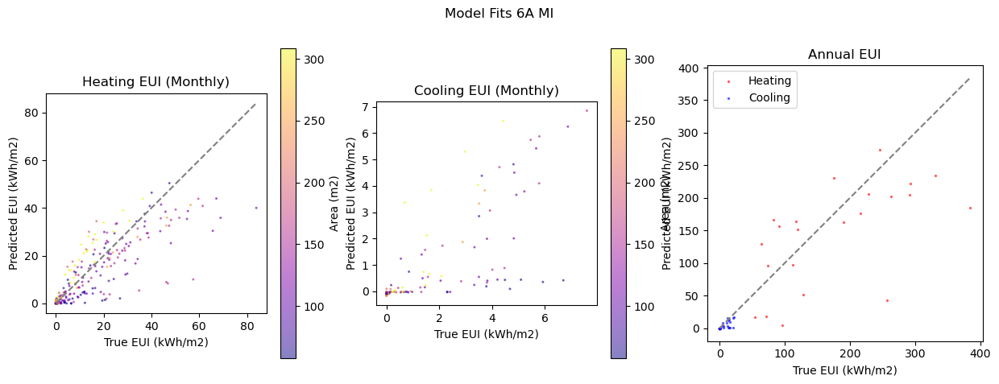

annual urban euis
               True        Pred
Name                           
Cooling    6.684060    4.358968
Heating  127.194195  116.069740
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   88.0 -46.7   6.9   123.7 -46.7  1.2
Heating   52.9 -17.8  76.1    72.0 -17.8  8.6

 -------------------- G4100510 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G4100510 has 6 PUMAs; lat/lon may be off
GISMATCH                                                   4101303
GEOID                                                      4101303
STATEFIP                                                        41
State                                                       Oregon
PUMA                                                         01303
Name                                Portland City (Southeast) PUMA
state_abbr         

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/1366 [00:00<?, ?it/s]

Succesfully pulled 1366 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
213 setpoints are crossed over.
707 setpoints are out of bounds (heating: 86, cooling:666).
727 buildings have setpoint errors.
639 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 639/1366 buildings in G4100510 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 160/160 [00:03<00:00, 46.33it/s]
Beginning evaluation...
Done evaluating.


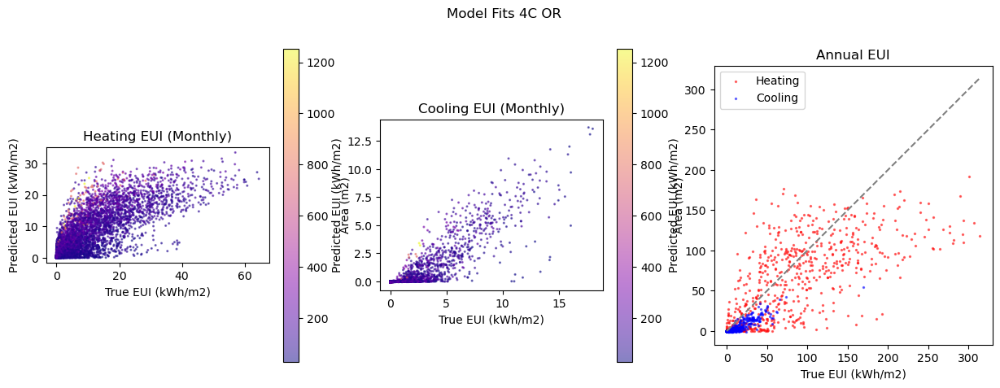

annual urban euis
              True       Pred
Name                         
Cooling   6.920625   2.763977
Heating  88.025299  82.096573
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  127.4 -60.5  10.4   105.4 -60.5  1.9
Heating   63.5 -24.5  54.2    88.0 -24.5  6.3

 -------------------- G0801170 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                    800400
GEOID                                                      0800400
STATEFIP                                                        08
State                                                     Colorado
PUMA                                                         00400
Name                  Eagle, Summit, Grand & Jackson Counties PUMA
state_abbr                                                      CO
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/125 [00:00<?, ?it/s]

Succesfully pulled 125 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
7 setpoints are crossed over.
96 setpoints are out of bounds (heating: 68, cooling:76).
96 buildings have setpoint errors.
29 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 29/125 buildings in G0801170 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 8/8 [00:00<00:00, 19.44it/s]
Beginning evaluation...
Done evaluating.


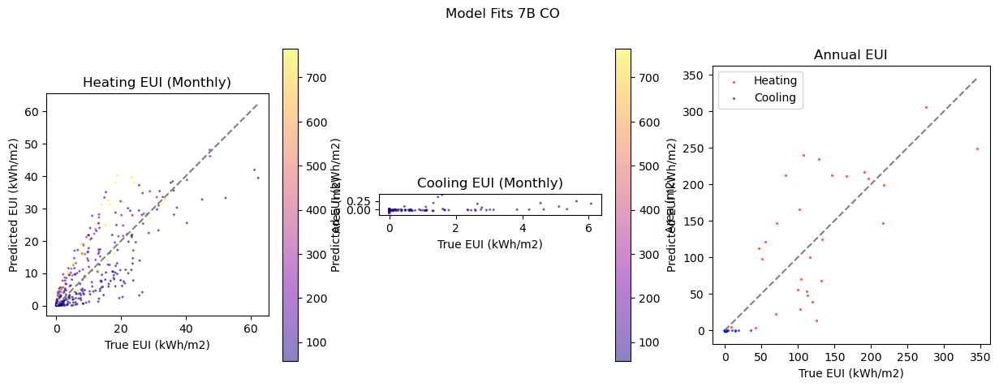

annual urban euis
               True        Pred
Name                           
Cooling    1.416995   -0.430702
Heating  135.651160  176.386538
building errors
        Annual              Monthly            
        CVRMSE   NMBE  RMSE  CVRMSE   NMBE RMSE
Name                                           
Cooling  235.4 -106.9   8.7   234.4 -106.9  1.2
Heating   53.2    0.9  67.5    66.4    0.9  7.0

 -------------------- G3000630 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   3000200
GEOID                                                      3000200
STATEFIP                                                        30
State                                                      Montana
PUMA                                                         00200
Name                              West Montana--Missoula City PUMA
state_abbr                                               

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/211 [00:00<?, ?it/s]

Succesfully pulled 211 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
31 setpoints are crossed over.
95 setpoints are out of bounds (heating: 28, cooling:78).
98 buildings have setpoint errors.
113 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 113/211 buildings in G3000630 county.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Done preparing weather
Clearing prediction cache.


c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 29/29 [00:00<00:00, 37.01it/s]
Beginning evaluation...
Done evaluating.


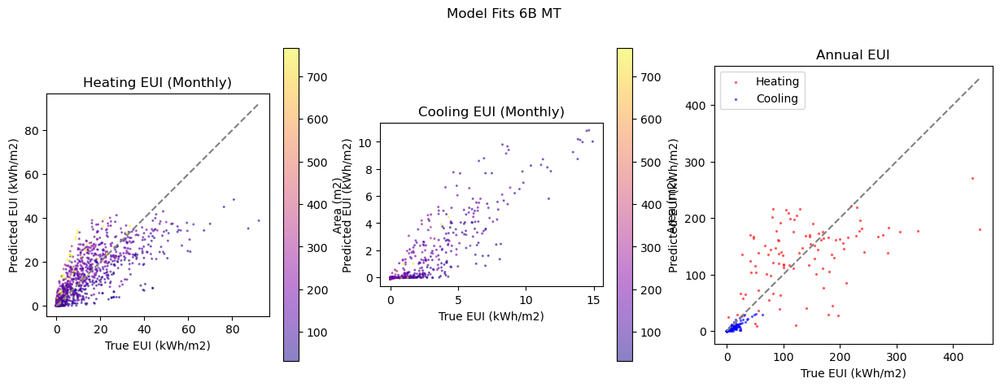

annual urban euis
               True        Pred
Name                           
Cooling    8.644250    5.133465
Heating  110.853158  132.786219
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   73.7 -43.5   8.3    94.6 -43.5  1.3
Heating   60.2  -2.9  73.3    78.2  -2.9  7.9

 -------------------- G5501410 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   5501601
GEOID                                                      5501601
STATEFIP                                                        55
State                                                    Wisconsin
PUMA                                                         01601
Name             Central Sands--Wood, Portage, Juneau & Adams C...
state_abbr                                                      WI


c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/142 [00:00<?, ?it/s]

Succesfully pulled 142 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
17 setpoints are crossed over.
65 setpoints are out of bounds (heating: 28, cooling:41).
68 buildings have setpoint errors.
74 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 74/142 buildings in G5501410 county.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Done preparing weather
Clearing prediction cache.
Predicting DataLoader 0: 100%|██████████| 19/19 [00:00<00:00, 31.34it/s]
Beginning evaluation...
Done evaluating.


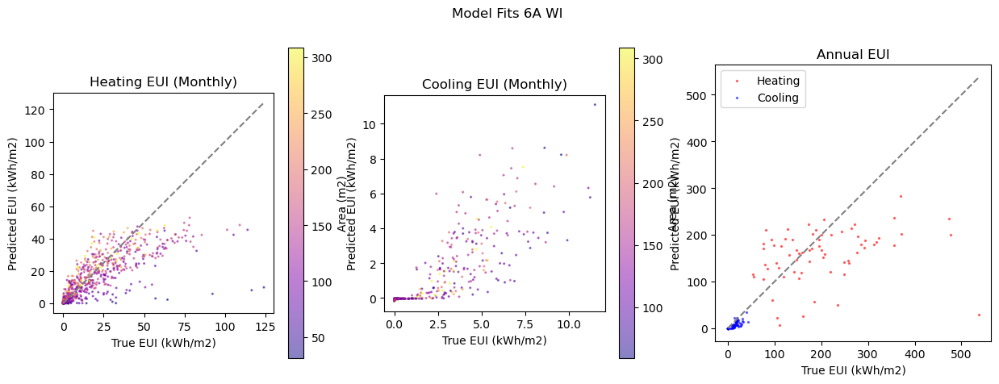

annual urban euis
               True        Pred
Name                           
Cooling   12.035560    6.314988
Heating  175.955671  152.454407
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   72.8 -47.8    9.0    96.7 -47.8   1.5
Heating   57.6 -21.7  106.9    82.8 -21.7  12.8

 -------------------- G2002090 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   2000500
GEOID                                                      2000500
STATEFIP                                                        20
State                                                       Kansas
PUMA                                                         00500
Name                            Wyandotte County--Kansas City PUMA
state_abbr                                               

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/278 [00:00<?, ?it/s]

Succesfully pulled 278 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
55 setpoints are crossed over.
134 setpoints are out of bounds (heating: 36, cooling:112).
142 buildings have setpoint errors.
136 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 136/278 buildings in G2002090 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 34/34 [00:00<00:00, 38.21it/s]
Beginning evaluation...
Done evaluating.


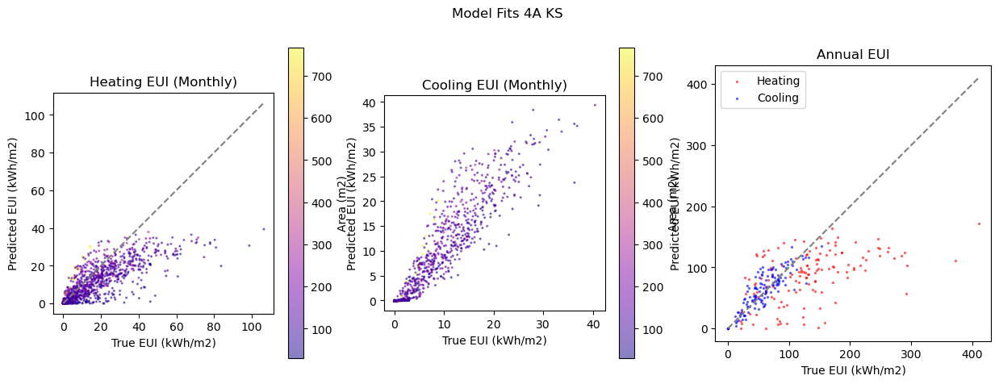

annual urban euis
               True       Pred
Name                          
Cooling   52.583756  59.451195
Heating  122.585329  94.849567
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   29.1   7.4  16.8    58.0   7.4  2.9
Heating   58.6 -34.9  78.2    87.4 -34.9  9.7

 -------------------- G0600730 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G0600730 has 22 PUMAs; lat/lon may be off
GISMATCH                                                    607316
GEOID                                                      0607316
STATEFIP                                                        06
State                                                   California
PUMA                                                         07316
Name             San Diego County (South Central)--San Diego Ci...
state_abbr            

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/2000 [00:00<?, ?it/s]

Succesfully pulled 2000 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
485 setpoints are crossed over.
925 setpoints are out of bounds (heating: 329, cooling:715).
958 buildings have setpoint errors.
1042 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 1042/4892 buildings in G0600730 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 261/261 [00:05<00:00, 50.92it/s]
Beginning evaluation...
Done evaluating.


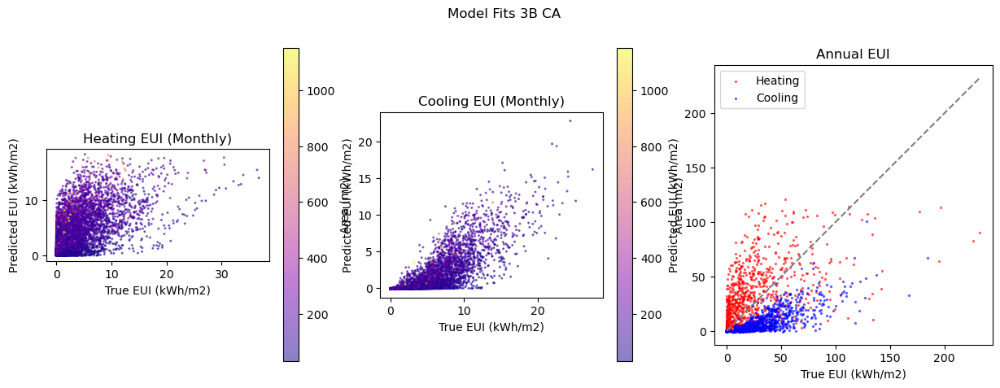

annual urban euis
              True       Pred
Name                         
Cooling  24.935162   6.834798
Heating  21.120914  33.429570
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  100.4 -74.0  29.2   106.5 -74.0  3.4
Heating  127.4  29.2  26.5   157.0  29.2  2.8

 -------------------- G3800170 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   3800500
GEOID                                                      3800500
STATEFIP                                                        38
State                                                 North Dakota
PUMA                                                         00500
Name                                  Cass County--Fargo City PUMA
state_abbr                                                      ND
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/311 [00:00<?, ?it/s]

Succesfully pulled 311 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
63 setpoints are crossed over.
194 setpoints are out of bounds (heating: 27, cooling:182).
198 buildings have setpoint errors.
113 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 113/311 buildings in G3800170 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 29/29 [00:00<00:00, 42.81it/s]
Beginning evaluation...
Done evaluating.


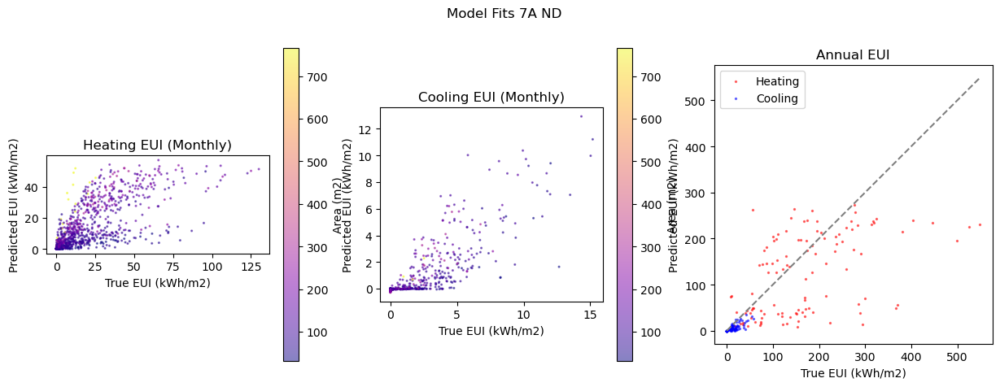

annual urban euis
               True        Pred
Name                           
Cooling    9.321431    4.755747
Heating  176.965804  158.411802
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   91.5 -53.2   10.3   104.0 -53.2   1.7
Heating   66.4 -27.6  112.7    95.5 -27.6  13.8

 -------------------- G3300190 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   3300500
GEOID                                                      3300500
STATEFIP                                                        33
State                                                New Hampshire
PUMA                                                         00500
Name             Southwestern New Hampshire--Cheshire & Sulliva...
state_abbr                                               

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/91 [00:00<?, ?it/s]

Succesfully pulled 91 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
15 setpoints are crossed over.
46 setpoints are out of bounds (heating: 23, cooling:28).
46 buildings have setpoint errors.
45 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 45/91 buildings in G3300190 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 12/12 [00:00<00:00, 34.09it/s]
Beginning evaluation...
Done evaluating.


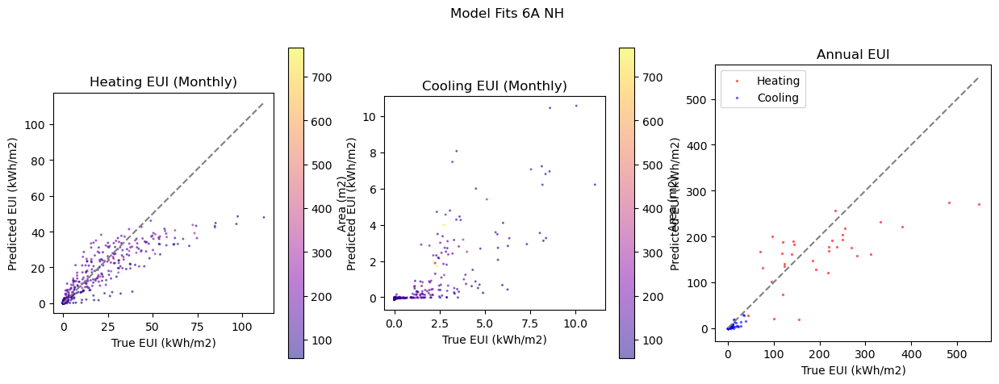

annual urban euis
               True        Pred
Name                           
Cooling    9.081133    5.103304
Heating  144.166117  119.310755
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   81.3 -48.8   8.3   109.9 -48.8  1.3
Heating   53.9 -20.4  81.0    75.7 -20.4  9.5

 -------------------- G0600850 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G0600850 has 14 PUMAs; lat/lon may be off
GISMATCH                                                    608509
GEOID                                                      0608509
STATEFIP                                                        06
State                                                   California
PUMA                                                         08509
Name             Santa Clara County (Central)--San Jose City (N...
state_abbr        

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/2000 [00:00<?, ?it/s]

Succesfully pulled 2000 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
302 setpoints are crossed over.
942 setpoints are out of bounds (heating: 162, cooling:840).
968 buildings have setpoint errors.
1032 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 1032/2689 buildings in G0600850 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 258/258 [00:04<00:00, 52.25it/s]
Beginning evaluation...
Done evaluating.


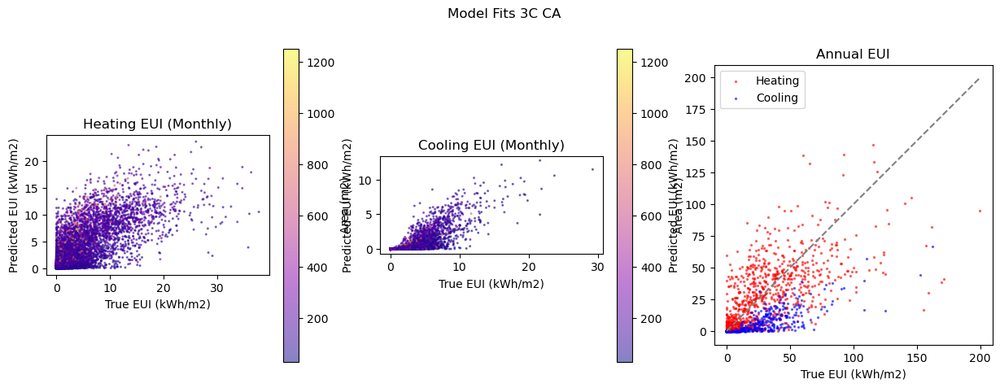

annual urban euis
              True       Pred
Name                         
Cooling   8.295846   2.042083
Heating  28.913736  29.778587
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  164.1 -75.0  16.5   108.0 -75.0  3.0
Heating   83.5 -10.5  22.7   121.2 -10.5  2.7

 -------------------- G2405100 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   2400804
GEOID                                                      2400804
STATEFIP                                                        24
State                                                     Maryland
PUMA                                                         00804
Name             Baltimore City--Inner Harbor, Canton & Bayview...
state_abbr                                                      MD
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/1220 [00:00<?, ?it/s]

Succesfully pulled 1220 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
295 setpoints are crossed over.
730 setpoints are out of bounds (heating: 292, cooling:570).
758 buildings have setpoint errors.
462 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 462/1220 buildings in G2405100 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 116/116 [00:02<00:00, 51.37it/s]
Beginning evaluation...
Done evaluating.


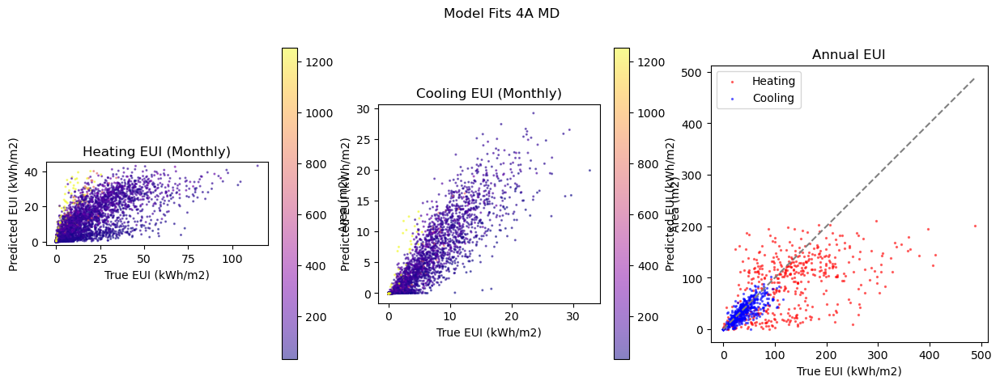

annual urban euis
               True        Pred
Name                           
Cooling   30.582450   30.014753
Heating  122.432999  112.363473
building errors
        Annual             Monthly            
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE  RMSE
Name                                          
Cooling   39.3 -12.0  14.7    62.4 -12.0   2.1
Heating   62.9 -32.0  84.4    94.8 -32.0  10.6

 -------------------- G0501490 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                    501300
GEOID                                                      0501300
STATEFIP                                                        05
State                                                     Arkansas
PUMA                                                         01300
Name             Pope, Johnson, Yell, Conway & Perry Counties PUMA
state_abbr                                                    

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/40 [00:00<?, ?it/s]

Succesfully pulled 40 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
6 setpoints are crossed over.
20 setpoints are out of bounds (heating: 13, cooling:12).
20 buildings have setpoint errors.
20 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 20/40 buildings in G0501490 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 5/5 [00:00<00:00, 22.79it/s]
Beginning evaluation...
Done evaluating.


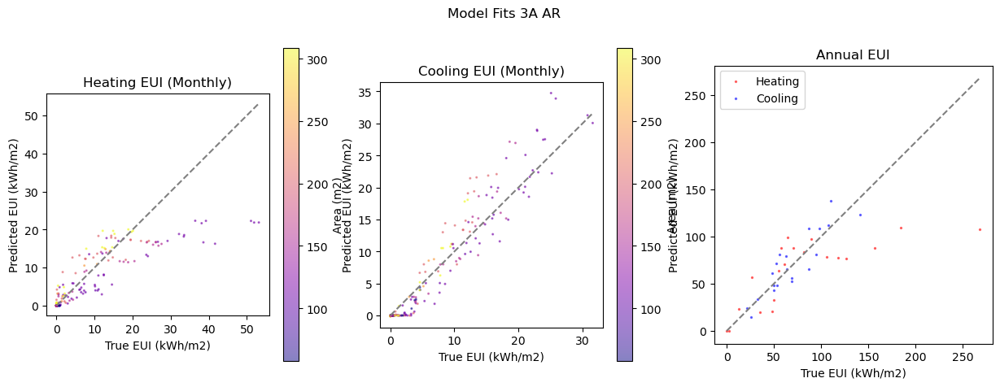

annual urban euis
              True       Pred
Name                         
Cooling  62.540541  66.468853
Heating  79.154034  70.370289
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   21.4   2.7  14.7    42.5   2.7  2.4
Heating   59.3 -20.8  47.9    84.9 -20.8  5.7

 -------------------- G4900570 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   4957001
GEOID                                                      4957001
STATEFIP                                                        49
State                                                         Utah
PUMA                                                         57001
Name             Weber County (West)--Roy, North Ogden, Ogden (...
state_abbr                                                      UT
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/363 [00:00<?, ?it/s]

Succesfully pulled 363 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
69 setpoints are crossed over.
146 setpoints are out of bounds (heating: 39, cooling:122).
151 buildings have setpoint errors.
212 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 212/363 buildings in G4900570 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 53/53 [00:01<00:00, 46.09it/s]
Beginning evaluation...
Done evaluating.


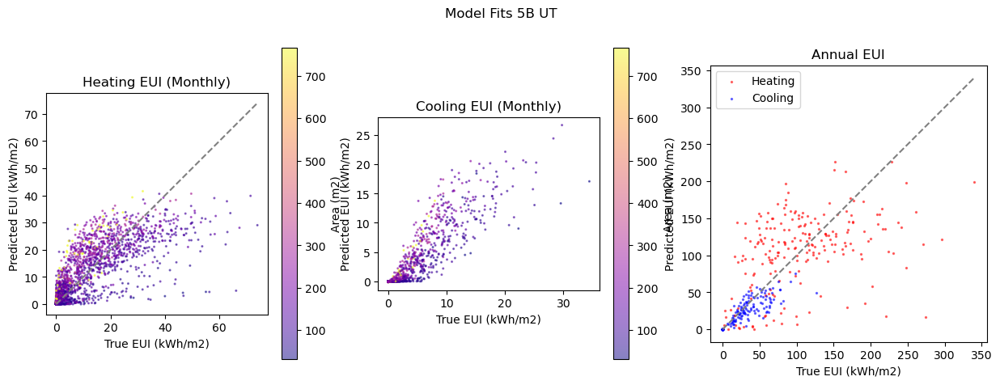

annual urban euis
             True        Pred
Name                         
Cooling  17.83292   15.647418
Heating  97.24575  117.800670
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   58.8 -21.6  12.8    70.0 -21.6  2.2
Heating   59.0   0.1  62.9    83.7   0.1  7.4

 -------------------- G0900150 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                    901500
GEOID                                                      0901500
STATEFIP                                                        09
State                                                  Connecticut
PUMA                                                         01500
Name                                           Windham County PUMA
state_abbr                                                      CT
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/203 [00:00<?, ?it/s]

Succesfully pulled 203 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
48 setpoints are crossed over.
100 setpoints are out of bounds (heating: 24, cooling:80).
105 buildings have setpoint errors.
98 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 98/203 buildings in G0900150 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 25/25 [00:00<00:00, 33.80it/s]
Beginning evaluation...
Done evaluating.


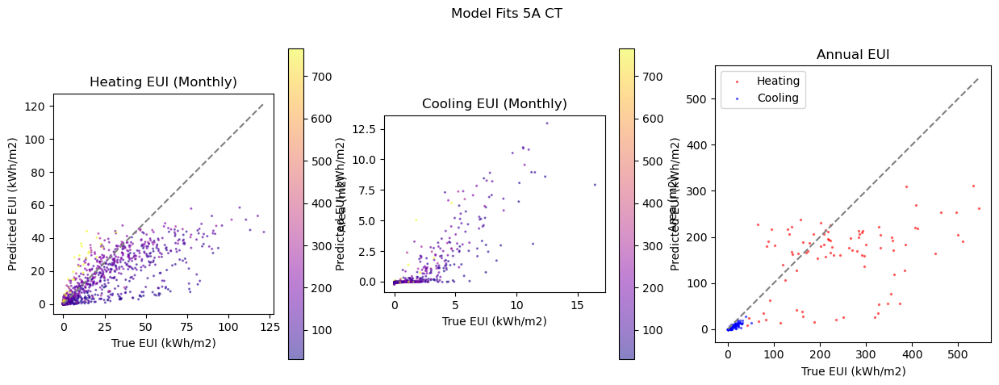

annual urban euis
               True        Pred
Name                           
Cooling    8.545856    4.198215
Heating  187.193236  151.943357
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   79.6 -55.2    8.8   110.6 -55.2   1.3
Heating   61.9 -36.1  138.1    85.3 -36.1  15.9

 -------------------- G2102390 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   2102000
GEOID                                                      2102000
STATEFIP                                                        21
State                                                     Kentucky
PUMA                                                         02000
Name               Bluegrass Area Development District (West) PUMA
state_abbr                                               

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/45 [00:00<?, ?it/s]

Succesfully pulled 45 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
7 setpoints are crossed over.
19 setpoints are out of bounds (heating: 6, cooling:15).
19 buildings have setpoint errors.
26 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 26/45 buildings in G2102390 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 7/7 [00:00<00:00, 17.53it/s]
Beginning evaluation...
Done evaluating.


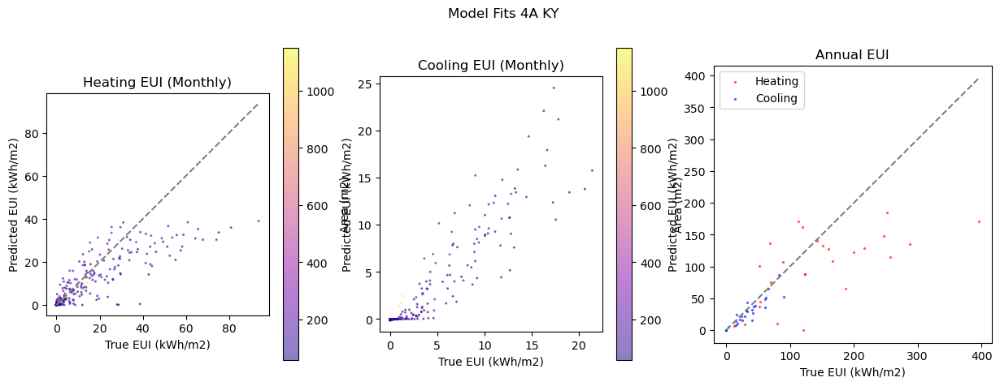

annual urban euis
               True       Pred
Name                          
Cooling   25.438443  22.163494
Heating  126.440708  98.530936
building errors
        Annual             Monthly            
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE  RMSE
Name                                          
Cooling   35.5 -18.8  12.2    60.1 -18.8   2.0
Heating   56.8 -30.5  82.4    86.4 -30.5  10.4

 -------------------- G1200860 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G1200860 has 25 PUMAs; lat/lon may be off
GISMATCH                                                   1208604
GEOID                                                      1208604
STATEFIP                                                        12
State                                                      Florida
PUMA                                                         08604
Name             Miami-Dade County (Northeast)--Aventura City &...
state_abbr       

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/2000 [00:00<?, ?it/s]

Succesfully pulled 2000 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
416 setpoints are crossed over.
826 setpoints are out of bounds (heating: 547, cooling:385).
874 buildings have setpoint errors.
1126 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 1126/4123 buildings in G1200860 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 282/282 [00:05<00:00, 52.96it/s]
Beginning evaluation...
Done evaluating.


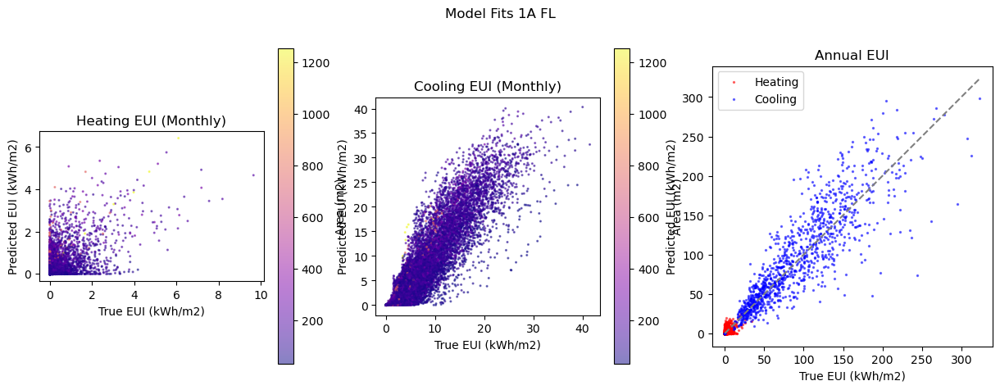

annual urban euis
              True       Pred
Name                         
Cooling  83.204495  91.626864
Heating   1.985937   3.196274
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   33.2   4.4  29.8    50.1   4.4  3.8
Heating  201.7  21.8   3.5   298.0  21.8  0.4

 -------------------- G3101850 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   3100600
GEOID                                                      3100600
STATEFIP                                                        31
State                                                     Nebraska
PUMA                                                         00600
Name                                       Southeast Nebraska PUMA
state_abbr                                                      NE
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/26 [00:00<?, ?it/s]

Succesfully pulled 26 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
2 setpoints are crossed over.
15 setpoints are out of bounds (heating: 6, cooling:10).
15 buildings have setpoint errors.
11 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 11/26 buildings in G3101850 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 3/3 [00:00<00:00, 14.01it/s]
Beginning evaluation...
Done evaluating.


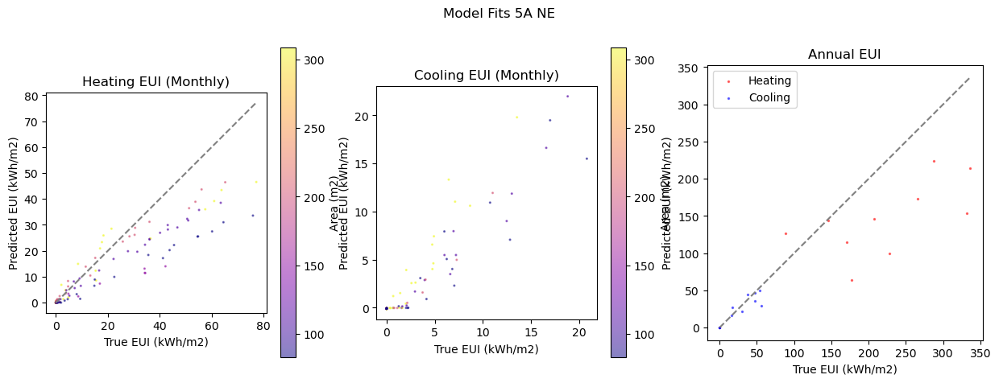

annual urban euis
               True        Pred
Name                           
Cooling   24.164441   23.932228
Heating  183.709235  130.580926
building errors
        Annual             Monthly            
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE  RMSE
Name                                          
Cooling   35.3 -11.0   9.8    57.6 -11.0   1.8
Heating   46.1 -34.8  93.8    67.8 -34.8  11.5

 -------------------- G0600170 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                    601700
GEOID                                                      0601700
STATEFIP                                                        06
State                                                   California
PUMA                                                         01700
Name                        El Dorado County--El Dorado Hills PUMA
state_abbr                                                    

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/367 [00:00<?, ?it/s]

Succesfully pulled 367 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
52 setpoints are crossed over.
187 setpoints are out of bounds (heating: 97, cooling:116).
191 buildings have setpoint errors.
176 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 176/367 buildings in G0600170 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 44/44 [00:00<00:00, 44.59it/s]
Beginning evaluation...
Done evaluating.


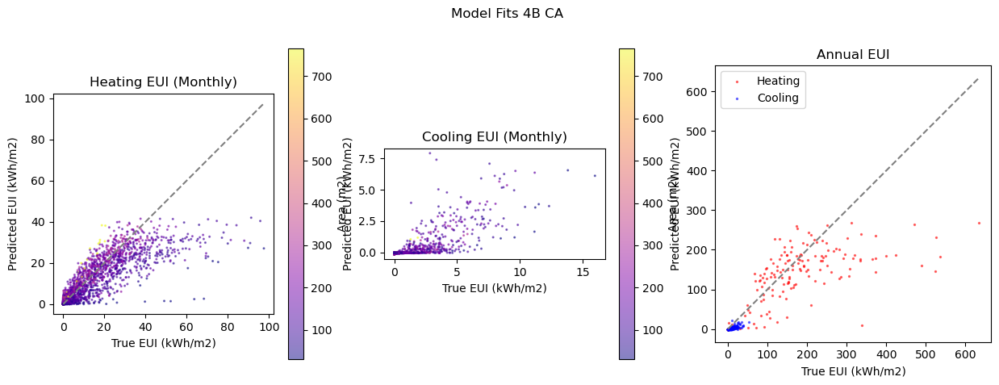

annual urban euis
               True        Pred
Name                           
Cooling    7.060232    1.456197
Heating  138.431593  123.359586
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  111.1 -76.8  10.1   160.4 -76.8  1.5
Heating   59.4 -22.8  93.7    73.0 -22.8  9.6

 -------------------- G4500910 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   4500502
GEOID                                                      4500502
STATEFIP                                                        45
State                                               South Carolina
PUMA                                                         00502
Name             York County (East)--Rock Hill City & Fort Mill...
state_abbr                                                      SC


c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/411 [00:00<?, ?it/s]

Succesfully pulled 411 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
119 setpoints are crossed over.
200 setpoints are out of bounds (heating: 76, cooling:149).
210 buildings have setpoint errors.
201 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 201/411 buildings in G4500910 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 51/51 [00:01<00:00, 41.55it/s]
Beginning evaluation...
Done evaluating.


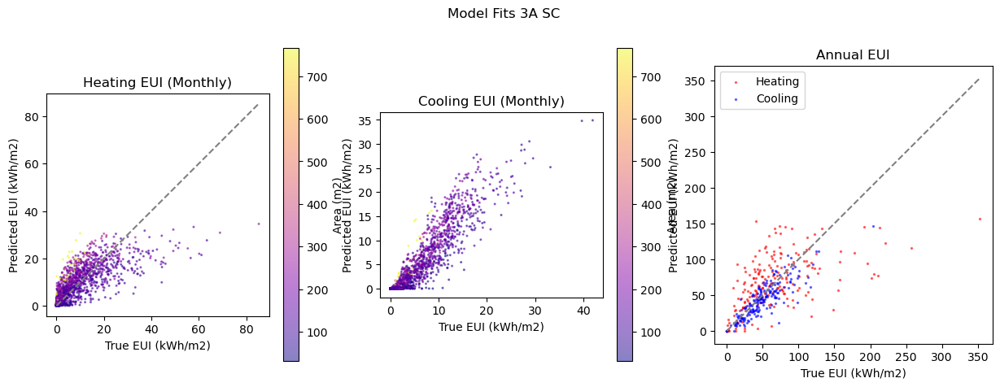

annual urban euis
              True       Pred
Name                         
Cooling  42.175714  39.493532
Heating  62.036237  76.079215
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   31.0 -11.9  15.4    53.4 -11.9  2.3
Heating   65.8   2.2  43.6    97.4   2.2  5.4

 -------------------- G2201270 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   2200600
GEOID                                                      2200600
STATEFIP                                                        22
State                                                    Louisiana
PUMA                                                         00600
Name             Kisatchie Delta Regional Planning & Developmen...
state_abbr                                                      LA
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/30 [00:00<?, ?it/s]

Succesfully pulled 30 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
7 setpoints are crossed over.
19 setpoints are out of bounds (heating: 15, cooling:7).
20 buildings have setpoint errors.
10 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 10/30 buildings in G2201270 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 3/3 [00:00<00:00, 10.84it/s]
Beginning evaluation...
Done evaluating.


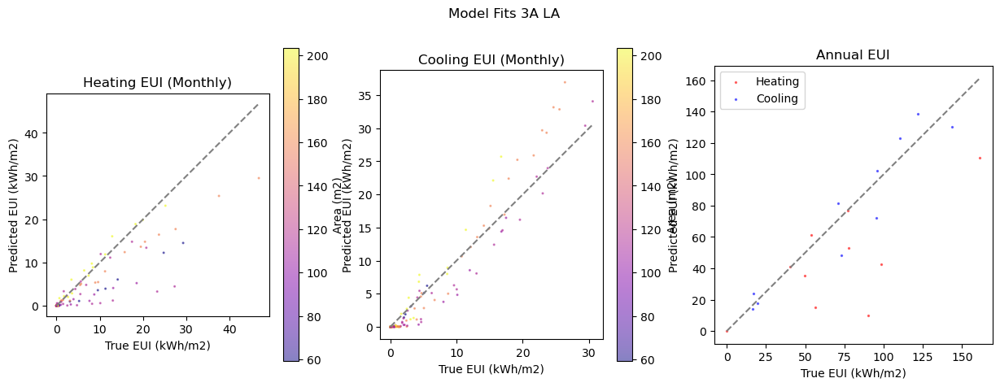

annual urban euis
              True       Pred
Name                         
Cooling  77.654795  79.086618
Heating  69.654547  48.971804
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   18.3  -1.6  14.0    42.1  -1.6  2.7
Heating   54.4 -36.7  38.3    84.7 -36.7  5.0

 -------------------- G5000270 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   5000300
GEOID                                                      5000300
STATEFIP                                                        50
State                                                      Vermont
PUMA                                                         00300
Name             Southeast Vermont--Windsor, Windham & Orange C...
state_abbr                                                      VT
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/141 [00:00<?, ?it/s]

Succesfully pulled 141 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
14 setpoints are crossed over.
73 setpoints are out of bounds (heating: 45, cooling:39).
73 buildings have setpoint errors.
68 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 68/141 buildings in G5000270 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 17/17 [00:00<00:00, 37.41it/s]
Beginning evaluation...
Done evaluating.


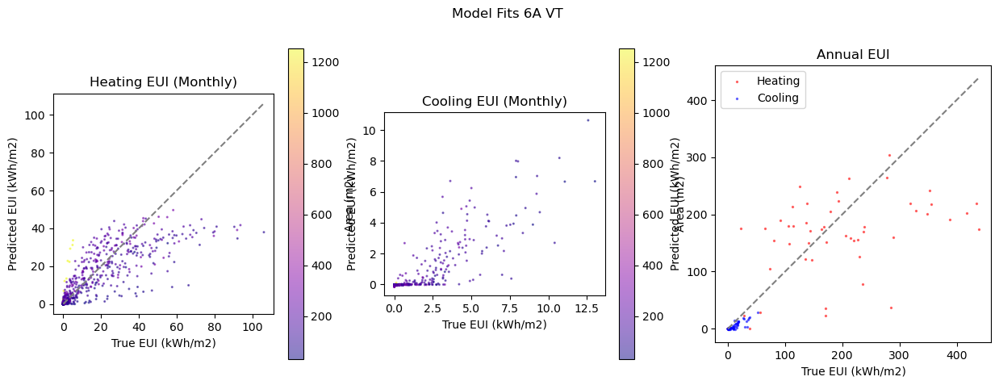

annual urban euis
               True        Pred
Name                           
Cooling    7.540597    3.141212
Heating  139.282395  139.100931
building errors
        Annual             Monthly            
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE  RMSE
Name                                          
Cooling   91.4 -55.5   8.8   111.7 -55.5   1.4
Heating   63.2 -17.4  91.2    87.6 -17.4  10.5

 -------------------- G4802010 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G4802010 has 38 PUMAs; lat/lon may be off
GISMATCH                                                   4804602
GEOID                                                      4804602
STATEFIP                                                        48
State                                                        Texas
PUMA                                                         04602
Name             Houston City (East Central)--East of I-45 & In...
state_abbr   

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/2000 [00:00<?, ?it/s]

Succesfully pulled 2000 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
398 setpoints are crossed over.
750 setpoints are out of bounds (heating: 490, cooling:346).
804 buildings have setpoint errors.
1196 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 1196/6960 buildings in G4802010 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 299/299 [00:05<00:00, 52.69it/s]
Beginning evaluation...
Done evaluating.


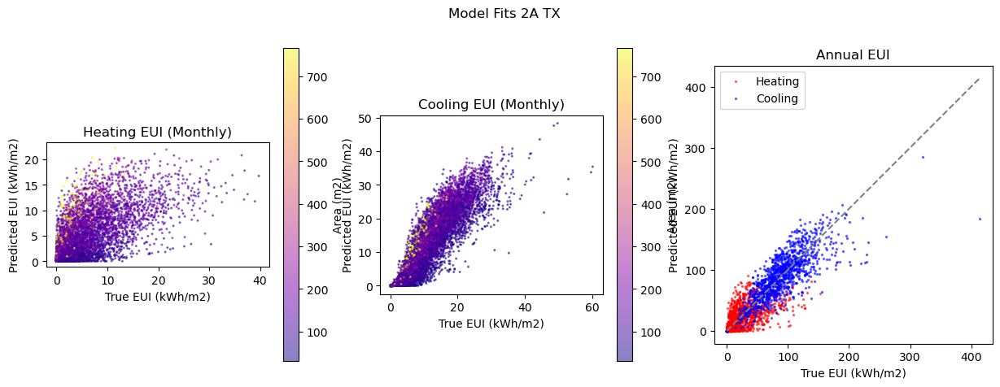

annual urban euis
              True       Pred
Name                         
Cooling  78.709799  85.106158
Heating  26.912767  31.363038
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   27.9   0.3  25.0    49.8   0.3  3.8
Heating   82.0 -10.5  22.4   129.2 -10.5  2.9

 -------------------- G5600450 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   5600200
GEOID                                                      5600200
STATEFIP                                                        56
State                                                      Wyoming
PUMA                                                         00200
Name             Campbell, Goshen, Platte, Johnson, Washakie, W...
state_abbr                                                      WY
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/14 [00:00<?, ?it/s]

Succesfully pulled 14 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
1 setpoints are crossed over.
7 setpoints are out of bounds (heating: 6, cooling:4).
7 buildings have setpoint errors.
7 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 7/14 buildings in G5600450 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 2/2 [00:00<00:00,  9.79it/s]
Beginning evaluation...
Done evaluating.


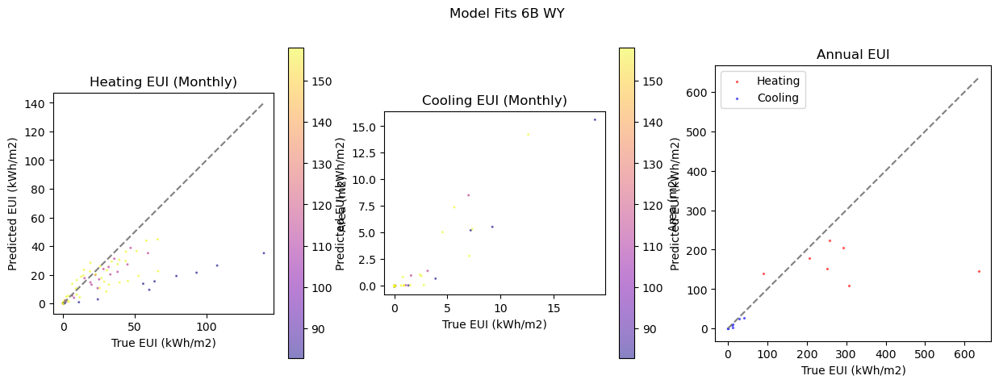

annual urban euis
               True        Pred
Name                           
Cooling   13.474831    9.471462
Heating  269.985856  165.845184
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   46.2 -30.5    6.8    72.7 -30.5   1.3
Heating   71.2 -43.7  207.8    93.0 -43.7  22.6

 -------------------- G0400190 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G0400190 has 9 PUMAs; lat/lon may be off
GISMATCH                                                    400208
GEOID                                                      0400208
STATEFIP                                                        04
State                                                      Arizona
PUMA                                                         00208
Name                                      Tucson City (South) PUMA
state_abb

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/1857 [00:00<?, ?it/s]

Succesfully pulled 1857 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
229 setpoints are crossed over.
635 setpoints are out of bounds (heating: 499, cooling:195).
656 buildings have setpoint errors.
1201 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 1201/1857 buildings in G0400190 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 301/301 [00:06<00:00, 48.02it/s]
Beginning evaluation...
Done evaluating.


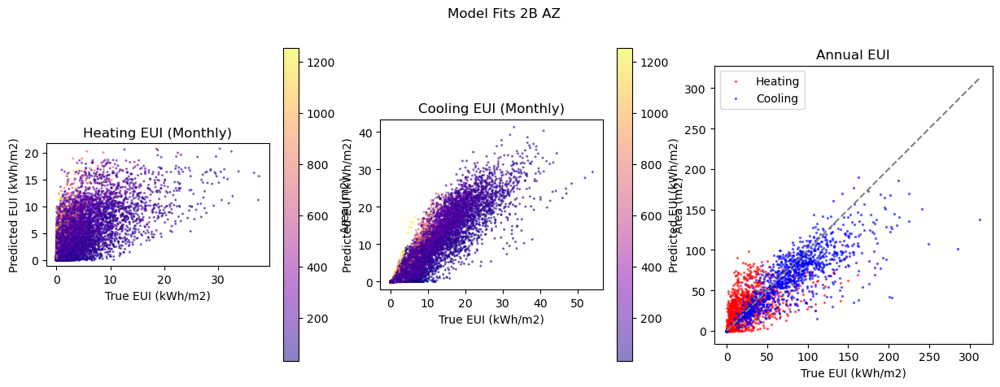

annual urban euis
              True       Pred
Name                         
Cooling  64.058509  59.663154
Heating  21.708973  34.688054
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   38.1 -18.0  28.7    48.3 -18.0  3.3
Heating   90.5  16.1  22.4   138.0  16.1  2.9

 -------------------- G1200870 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   1208700
GEOID                                                      1208700
STATEFIP                                                        12
State                                                      Florida
PUMA                                                         08700
Name             Miami-Dade (South/Outside Urban Development Bo...
state_abbr                                                      FL
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/219 [00:00<?, ?it/s]

Succesfully pulled 219 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
29 setpoints are crossed over.
119 setpoints are out of bounds (heating: 101, cooling:36).
123 buildings have setpoint errors.
96 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 96/219 buildings in G1200870 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 24/24 [00:00<00:00, 36.19it/s]
Beginning evaluation...
Done evaluating.


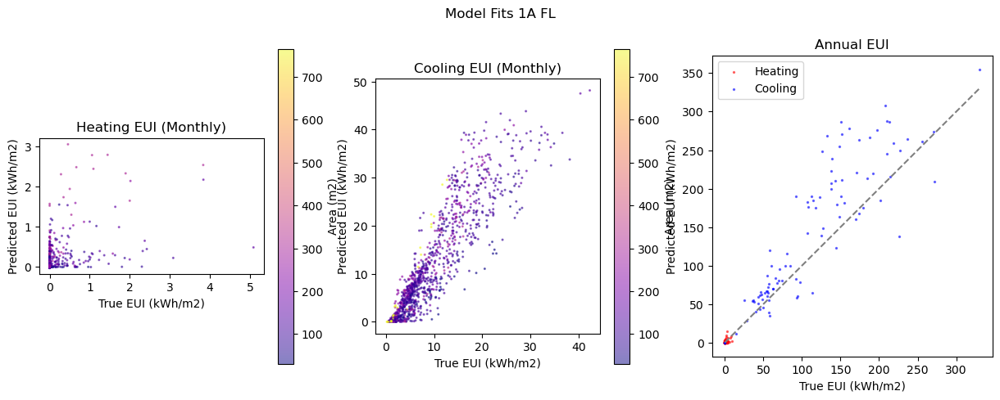

annual urban euis
               True        Pred
Name                           
Cooling  105.455973  141.551618
Heating    1.067590    1.699383
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   44.6  25.2  51.3    60.4  25.2  6.0
Heating  217.2  17.1   2.2   397.6  17.1  0.4

 -------------------- G0400210 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                    400803
GEOID                                                      0400803
STATEFIP                                                        04
State                                                      Arizona
PUMA                                                         00803
Name               Pinal County (North)--Apache Junction City PUMA
state_abbr                                                      AZ


c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/687 [00:00<?, ?it/s]

Succesfully pulled 687 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
63 setpoints are crossed over.
239 setpoints are out of bounds (heating: 189, cooling:59).
241 buildings have setpoint errors.
446 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 446/687 buildings in G0400210 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 112/112 [00:02<00:00, 48.18it/s]
Beginning evaluation...
Done evaluating.


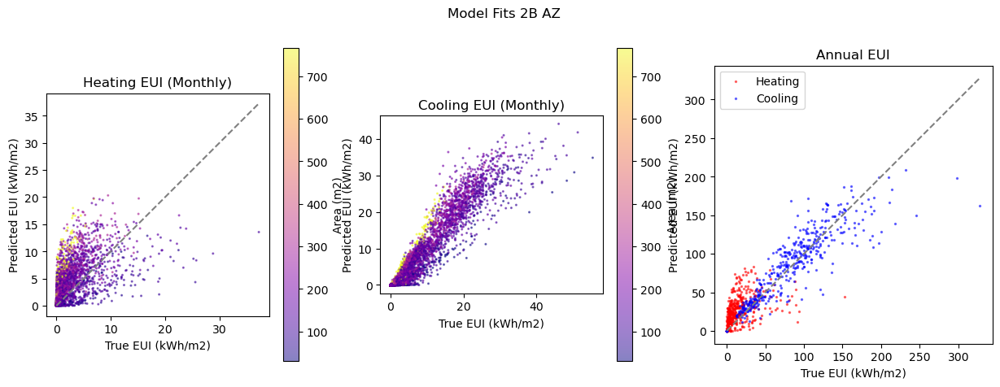

annual urban euis
              True       Pred
Name                         
Cooling  70.580407  77.443394
Heating  13.395200  31.116605
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   27.6   1.0  23.0    42.6   1.0  3.1
Heating  142.7  69.1  22.5   214.4  69.1  2.8

 -------------------- G4001530 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   4000500
GEOID                                                      4000500
STATEFIP                                                        40
State                                                     Oklahoma
PUMA                                                         00500
Name                           Panhandle & Northwest Oklahoma PUMA
state_abbr                                                      OK
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/37 [00:00<?, ?it/s]

Succesfully pulled 37 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
12 setpoints are crossed over.
24 setpoints are out of bounds (heating: 17, cooling:14).
25 buildings have setpoint errors.
12 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 12/37 buildings in G4001530 county.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Done preparing weather
Clearing prediction cache.
Predicting DataLoader 0: 100%|██████████| 3/3 [00:00<00:00, 11.85it/s]
Beginning evaluation...
Done evaluating.


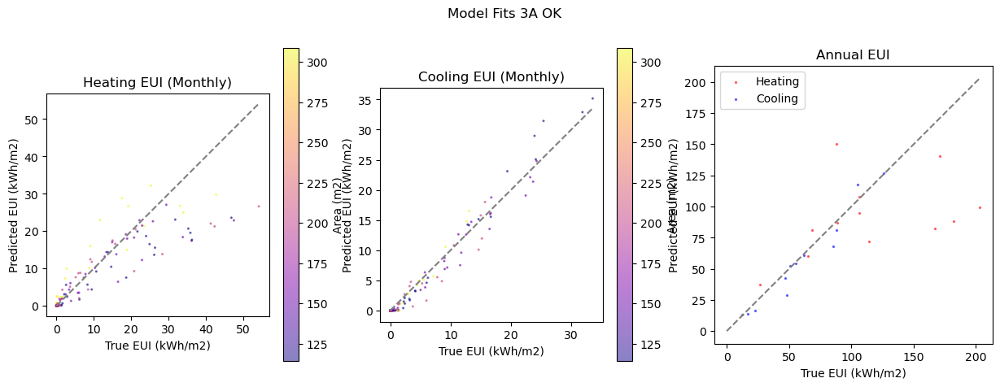

annual urban euis
               True       Pred
Name                          
Cooling   53.553370  49.827311
Heating  115.432361  98.296747
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   14.9  -6.1   9.0    28.7  -6.1  1.4
Heating   45.8 -20.7  53.0    68.7 -20.7  6.6

 -------------------- G0600590 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G0600590 has 18 PUMAs; lat/lon may be off
GISMATCH                                                    605906
GEOID                                                      0605906
STATEFIP                                                        06
State                                                   California
PUMA                                                         05906
Name             Orange County (North)--Yorba Linda, La Habra &...
state_abbr            

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/2000 [00:00<?, ?it/s]

Succesfully pulled 2000 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
481 setpoints are crossed over.
884 setpoints are out of bounds (heating: 304, cooling:686).
917 buildings have setpoint errors.
1083 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 1083/4421 buildings in G0600590 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 271/271 [00:05<00:00, 53.29it/s]
Beginning evaluation...
Done evaluating.


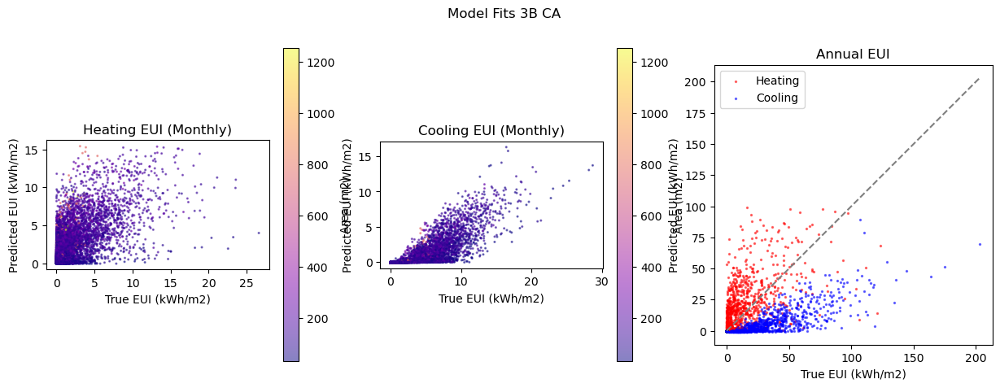

annual urban euis
              True       Pred
Name                         
Cooling  23.173243   4.661021
Heating  12.771213  22.361017
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  111.2 -79.5  30.5   108.1 -79.5  3.4
Heating  145.5  42.9  18.4   181.6  42.9  2.0

 -------------------- G0600750 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G0600750 has 7 PUMAs; lat/lon may be off
GISMATCH                                                    607502
GEOID                                                      0607502
STATEFIP                                                        06
State                                                   California
PUMA                                                         07502
Name             San Francisco County (North & East)--North Bea...
state_abbr                 

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/1586 [00:00<?, ?it/s]

Succesfully pulled 1586 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
248 setpoints are crossed over.
725 setpoints are out of bounds (heating: 205, cooling:591).
753 buildings have setpoint errors.
833 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 833/1586 buildings in G0600750 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 209/209 [00:03<00:00, 52.96it/s]
Beginning evaluation...
Done evaluating.


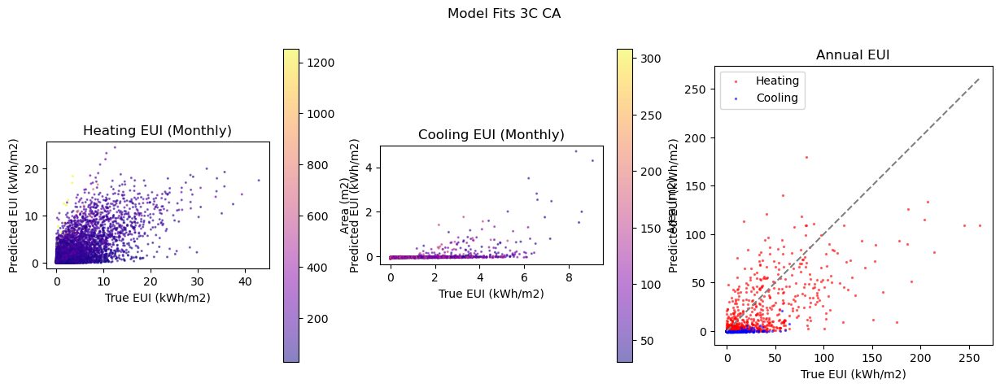

annual urban euis
              True       Pred
Name                         
Cooling   2.117659  -0.023748
Heating  30.407147  23.845585
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  313.3 -99.5   7.9   145.5 -99.5  1.8
Heating  104.8 -38.0  29.0   126.0 -38.0  3.1

 -------------------- G0800310 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                    800813
GEOID                                                      0800813
STATEFIP                                                        08
State                                                     Colorado
PUMA                                                         00813
Name                                  Denver City (Northwest) PUMA
state_abbr                                                      CO
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/1229 [00:00<?, ?it/s]

Succesfully pulled 1229 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
282 setpoints are crossed over.
533 setpoints are out of bounds (heating: 113, cooling:464).
555 buildings have setpoint errors.
674 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 674/1229 buildings in G0800310 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 169/169 [00:03<00:00, 49.92it/s]
Beginning evaluation...
Done evaluating.


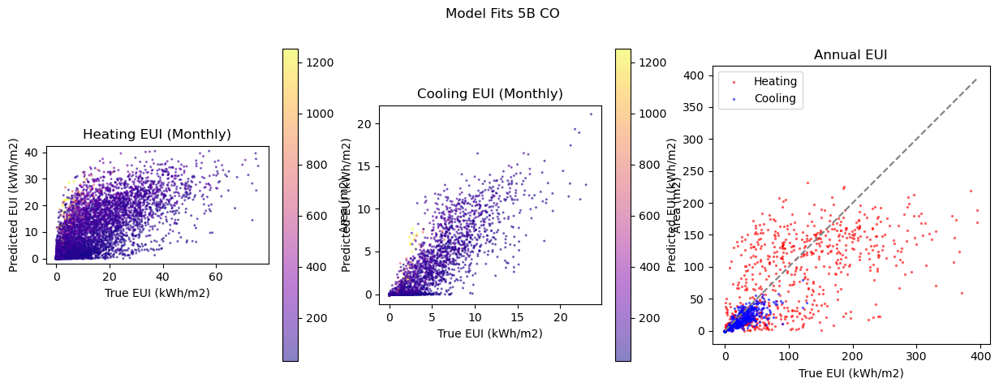

annual urban euis
               True        Pred
Name                           
Cooling   14.802711   11.455549
Heating  109.210449  107.347202
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   72.1 -33.4  13.0    74.0 -33.4  1.9
Heating   65.8 -22.3  74.3    85.9 -22.3  8.1

 -------------------- G3500010 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G3500010 has 7 PUMAs; lat/lon may be off
GISMATCH                                                   3500801
GEOID                                                      3500801
STATEFIP                                                        35
State                                                   New Mexico
PUMA                                                         00801
Name                 Albuquerque City (Far Northeast Heights) PUMA
state_abbr         

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/1189 [00:00<?, ?it/s]

Succesfully pulled 1189 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
239 setpoints are crossed over.
518 setpoints are out of bounds (heating: 203, cooling:391).
538 buildings have setpoint errors.
651 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 651/1189 buildings in G3500010 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 163/163 [00:03<00:00, 50.07it/s]
Beginning evaluation...
Done evaluating.


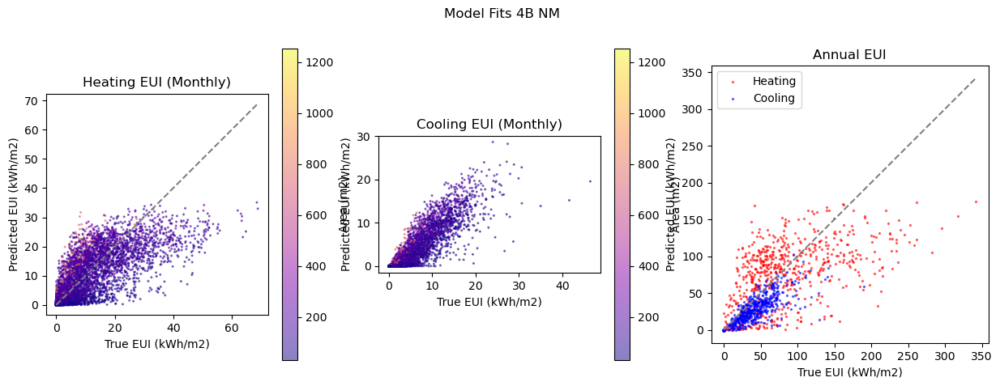

annual urban euis
              True       Pred
Name                         
Cooling  29.544072  21.665866
Heating  77.422622  84.011194
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   57.2 -34.0  19.9    71.2 -34.0  2.7
Heating   62.8 -11.5  52.5    88.9 -11.5  6.2

 -------------------- G4100710 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   4101200
GEOID                                                      4101200
STATEFIP                                                        41
State                                                       Oregon
PUMA                                                         01200
Name                                  Yamhill & Polk Counties PUMA
state_abbr                                                      OR
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/156 [00:00<?, ?it/s]

Succesfully pulled 156 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
22 setpoints are crossed over.
80 setpoints are out of bounds (heating: 7, cooling:77).
82 buildings have setpoint errors.
74 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 74/156 buildings in G4100710 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 19/19 [00:00<00:00, 40.15it/s]
Beginning evaluation...
Done evaluating.


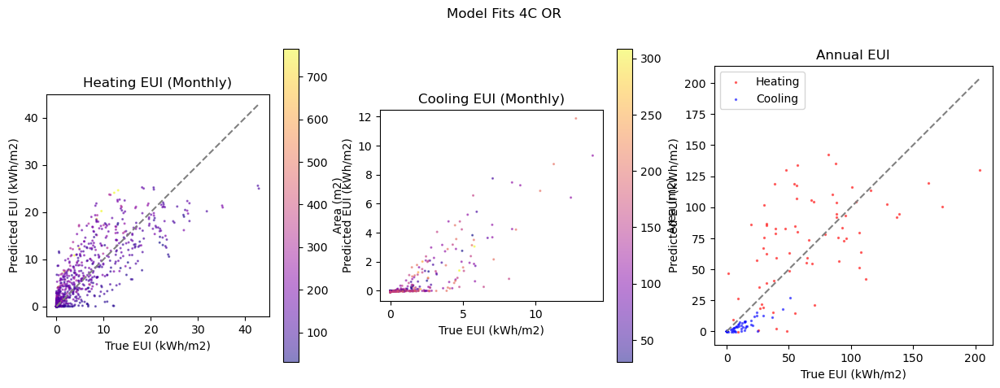

annual urban euis
              True       Pred
Name                         
Cooling   7.368423   2.704682
Heating  61.432436  78.303574
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  103.4 -62.4   8.4   110.4 -62.4  1.3
Heating   61.1   9.9  38.4    77.3   9.9  4.1

 -------------------- G4804390 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G4804390 has 16 PUMAs; lat/lon may be off
GISMATCH                                                   4802512
GEOID                                                      4802512
STATEFIP                                                        48
State                                                        Texas
PUMA                                                         02512
Name             Fort Worth City (North Central) & Haltom City ...
state_abbr                

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/2000 [00:00<?, ?it/s]

Succesfully pulled 2000 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
515 setpoints are crossed over.
917 setpoints are out of bounds (heating: 337, cooling:703).
965 buildings have setpoint errors.
1035 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 1035/3050 buildings in G4804390 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 259/259 [00:04<00:00, 53.16it/s]
Beginning evaluation...
Done evaluating.


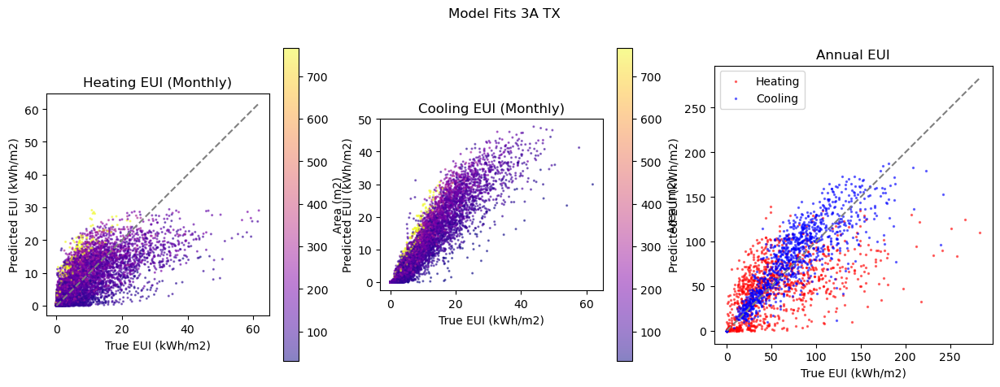

annual urban euis
              True       Pred
Name                         
Cooling  66.239056  79.145615
Heating  53.786251  59.671136
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   31.2   7.9  23.1    55.0   7.9  3.5
Heating   68.8 -11.4  38.6   100.7 -11.4  4.7

 -------------------- G0400130 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G0400130 has 35 PUMAs; lat/lon may be off
GISMATCH                                                    400111
GEOID                                                      0400111
STATEFIP                                                        04
State                                                      Arizona
PUMA                                                         00111
Name             Maricopa County (Northeast)--Scottsdale City (...
state_abbr                

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/2000 [00:00<?, ?it/s]

Succesfully pulled 2000 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
257 setpoints are crossed over.
648 setpoints are out of bounds (heating: 482, cooling:218).
662 buildings have setpoint errors.
1338 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 1338/6919 buildings in G0400130 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 335/335 [00:06<00:00, 53.46it/s]
Beginning evaluation...
Done evaluating.


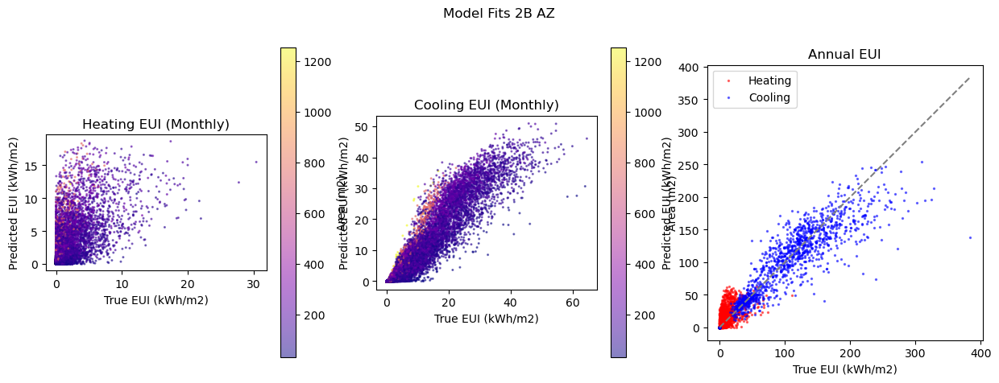

annual urban euis
              True       Pred
Name                         
Cooling  89.833221  94.753823
Heating   9.224354  21.408084
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   28.4  -4.9  28.9    42.5  -4.9  3.9
Heating  151.0  74.4  15.2   263.1  74.4  2.2

 -------------------- G2500270 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G2500270 has 8 PUMAs; lat/lon may be off
GISMATCH                                                   2500400
GEOID                                                      2500400
STATEFIP                                                        25
State                                                Massachusetts
PUMA                                                         00400
Name             Worcester & Middlesex Counties (Outside Leomin...
state_abbr                 

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/1359 [00:00<?, ?it/s]

Succesfully pulled 1359 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
282 setpoints are crossed over.
660 setpoints are out of bounds (heating: 162, cooling:570).
675 buildings have setpoint errors.
684 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 684/1359 buildings in G2500270 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 171/171 [00:03<00:00, 50.65it/s]
Beginning evaluation...
Done evaluating.


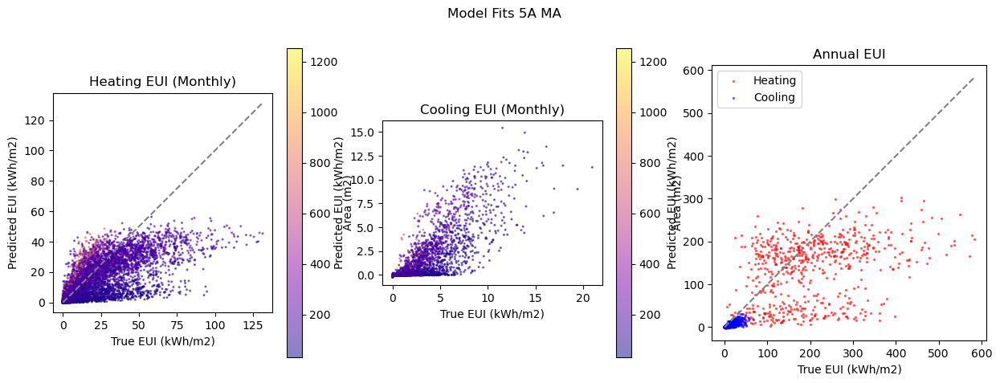

annual urban euis
               True        Pred
Name                           
Cooling   10.320889    4.968809
Heating  174.899991  147.429291
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   83.9 -55.7   11.3   116.5 -55.7   1.5
Heating   64.9 -33.5  125.1    90.7 -33.5  14.6

 -------------------- G0800410 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G0800410 has 6 PUMAs; lat/lon may be off
GISMATCH                                                    804103
GEOID                                                      0804103
STATEFIP                                                        08
State                                                     Colorado
PUMA                                                         04103
Name             El Paso County (Central)--Colorado Springs Cit...
state_abb

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/1096 [00:00<?, ?it/s]

Succesfully pulled 1096 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
216 setpoints are crossed over.
444 setpoints are out of bounds (heating: 92, cooling:382).
464 buildings have setpoint errors.
632 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 632/1096 buildings in G0800410 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 158/158 [00:03<00:00, 50.36it/s]
Beginning evaluation...
Done evaluating.


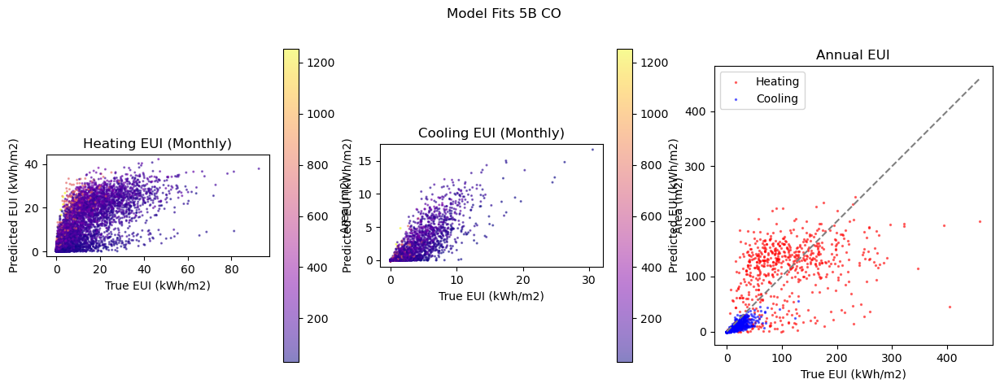

annual urban euis
              True        Pred
Name                          
Cooling  10.494992    5.807978
Heating  96.151391  124.467720
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   89.9 -48.7  12.6    97.5 -48.7  1.8
Heating   64.9   0.8  69.8    85.3   0.8  7.7

 -------------------- G2300310 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   2300900
GEOID                                                      2300900
STATEFIP                                                        23
State                                                        Maine
PUMA                                                         00900
Name             Cumberland (Outside Portland) & York (East) Co...
state_abbr                                                      ME
divi

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/442 [00:00<?, ?it/s]

Succesfully pulled 442 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
39 setpoints are crossed over.
228 setpoints are out of bounds (heating: 117, cooling:148).
229 buildings have setpoint errors.
213 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 213/442 buildings in G2300310 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 54/54 [00:01<00:00, 43.37it/s]
Beginning evaluation...
Done evaluating.


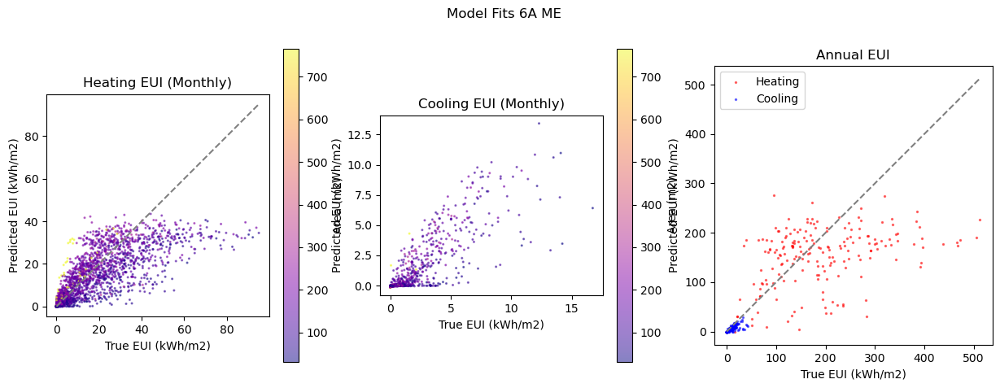

annual urban euis
               True        Pred
Name                           
Cooling    6.343314    4.149735
Heating  152.761045  141.211490
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   81.1 -39.1    6.7   116.8 -39.1   1.1
Heating   57.6 -20.4  100.6    74.6 -20.4  10.8

 -------------------- G5401090 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   5401300
GEOID                                                      5401300
STATEFIP                                                        54
State                                                West Virginia
PUMA                                                         01300
Name                Logan, Mingo, Wyoming & McDowell Counties PUMA
state_abbr                                               

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/45 [00:00<?, ?it/s]

Succesfully pulled 45 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
5 setpoints are crossed over.
24 setpoints are out of bounds (heating: 17, cooling:11).
25 buildings have setpoint errors.
20 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 20/45 buildings in G5401090 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 5/5 [00:00<00:00, 13.18it/s]
Beginning evaluation...
Done evaluating.


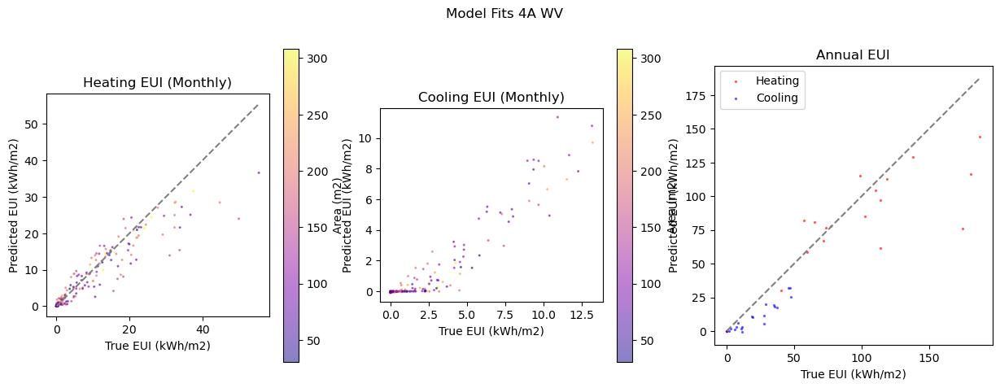

annual urban euis
              True       Pred
Name                         
Cooling  19.500141   9.702318
Heating  95.434407  82.512199
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   58.5 -49.1  12.5    79.1 -49.1  1.5
Heating   36.0 -15.1  32.1    54.1 -15.1  4.0

 -------------------- G1201330 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   1200500
GEOID                                                      1200500
STATEFIP                                                        12
State                                                      Florida
PUMA                                                         00500
Name                Walton, Washington, Holmes & Bay Counties PUMA
state_abbr                                                      FL
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/44 [00:00<?, ?it/s]

Succesfully pulled 44 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
4 setpoints are crossed over.
24 setpoints are out of bounds (heating: 21, cooling:8).
25 buildings have setpoint errors.
19 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 19/44 buildings in G1201330 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 5/5 [00:00<00:00, 13.38it/s]
Beginning evaluation...
Done evaluating.


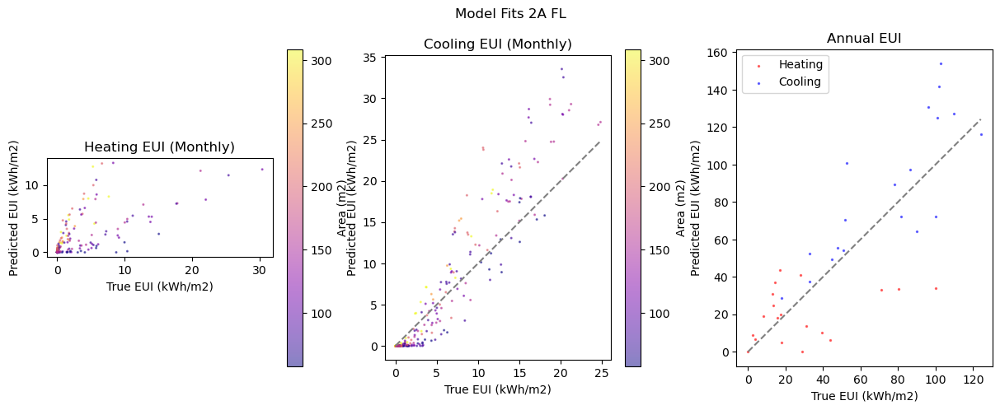

annual urban euis
              True       Pred
Name                         
Cooling  66.484361  81.937752
Heating  24.179498  22.306985
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   33.2  16.8  24.5    63.3  16.8  3.9
Heating   93.0 -29.3  26.7   138.4 -29.3  3.5

 -------------------- G2701730 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   2702000
GEOID                                                      2702000
STATEFIP                                                        27
State                                                    Minnesota
PUMA                                                         02000
Name             Brown, Lyon, Redwood, Chippewa, Yellow Medicin...
state_abbr                                                      MN
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/20 [00:00<?, ?it/s]

Succesfully pulled 20 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
3 setpoints are crossed over.
7 setpoints are out of bounds (heating: 0, cooling:7).
7 buildings have setpoint errors.
13 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 13/20 buildings in G2701730 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 4/4 [00:00<00:00, 12.74it/s]
Beginning evaluation...
Done evaluating.


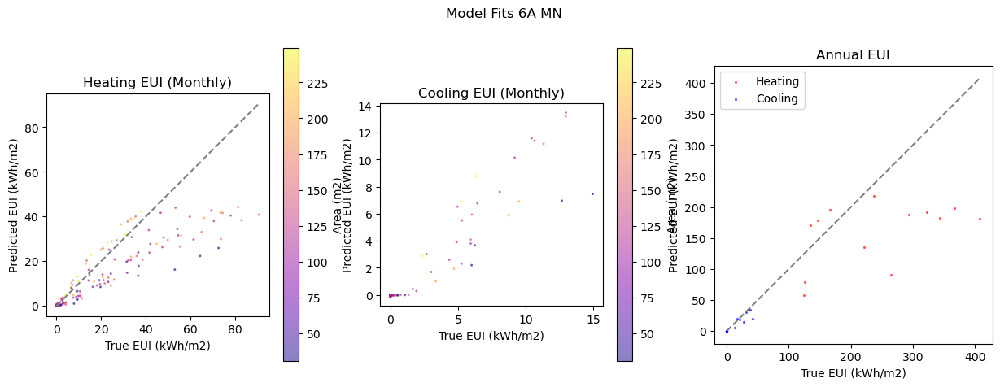

annual urban euis
               True        Pred
Name                           
Cooling   16.172630   13.680114
Heating  244.961347  173.884719
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   43.1 -20.8    7.4    59.9 -20.8   1.4
Heating   48.7 -34.4  118.2    69.5 -34.4  14.0

 -------------------- G2701370 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   2700500
GEOID                                                      2700500
STATEFIP                                                        27
State                                                    Minnesota
PUMA                                                         00500
Name             St. Louis County (Southeast)--Duluth, Hermanto...
state_abbr                                               

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/425 [00:00<?, ?it/s]

Succesfully pulled 425 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
69 setpoints are crossed over.
305 setpoints are out of bounds (heating: 88, cooling:277).
306 buildings have setpoint errors.
119 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 119/425 buildings in G2701370 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 30/30 [00:00<00:00, 38.68it/s]
Beginning evaluation...
Done evaluating.


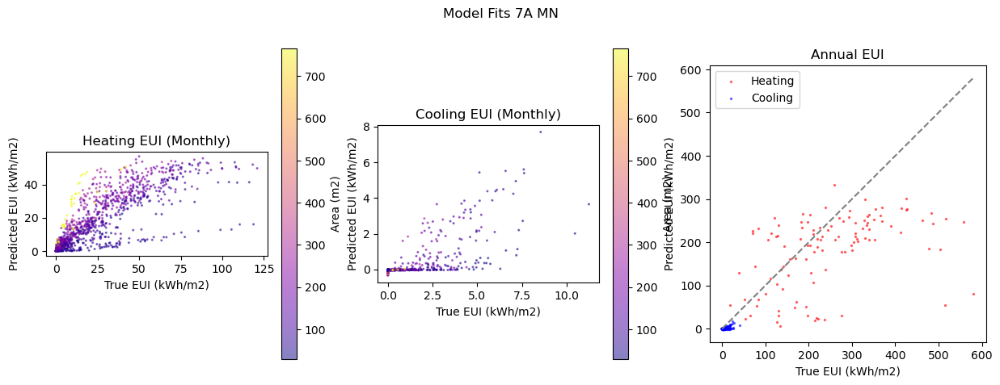

annual urban euis
               True        Pred
Name                           
Cooling    3.997912    0.643603
Heating  209.089231  196.570762
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling  127.7 -77.8    8.0   153.9 -77.8   1.3
Heating   54.5 -26.5  127.5    75.3 -26.5  14.8

 -------------------- G4801130 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G4801130 has 22 PUMAs; lat/lon may be off
GISMATCH                                                   4802306
GEOID                                                      4802306
STATEFIP                                                        48
State                                                        Texas
PUMA                                                         02306
Name             Dallas (Northeast) & Mesquite (North) Cities--...
state_ab

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/2000 [00:00<?, ?it/s]

Succesfully pulled 2000 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
590 setpoints are crossed over.
970 setpoints are out of bounds (heating: 357, cooling:728).
1041 buildings have setpoint errors.
959 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 959/4015 buildings in G4801130 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 240/240 [00:04<00:00, 50.76it/s]
Beginning evaluation...
Done evaluating.


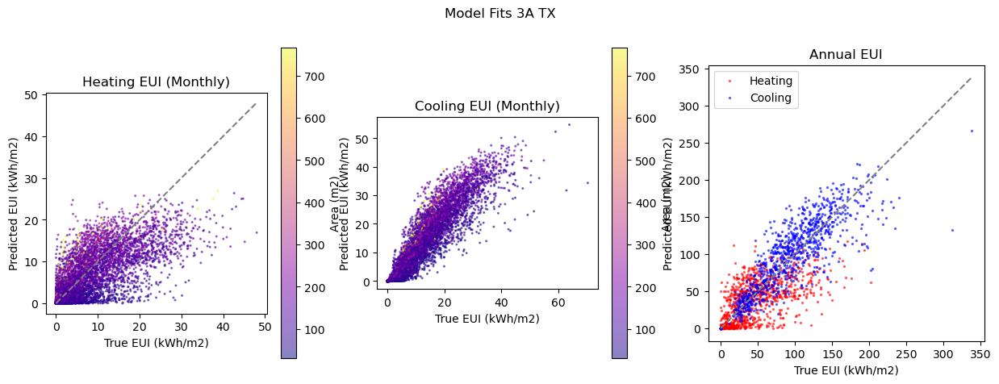

annual urban euis
              True       Pred
Name                         
Cooling  88.802178  99.790628
Heating  49.963041  47.570866
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   28.8   3.8  26.9    47.8   3.8  3.8
Heating   66.9 -19.9  32.2   102.6 -19.9  4.1

 -------------------- G3601230 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   3601400
GEOID                                                      3601400
STATEFIP                                                        36
State                                                     New York
PUMA                                                         01400
Name                                 Ontario & Yates Counties PUMA
state_abbr                                                      NY
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/57 [00:00<?, ?it/s]

Succesfully pulled 57 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
12 setpoints are crossed over.
34 setpoints are out of bounds (heating: 10, cooling:31).
37 buildings have setpoint errors.
20 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 20/57 buildings in G3601230 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 5/5 [00:00<00:00, 18.41it/s]
Beginning evaluation...
Done evaluating.


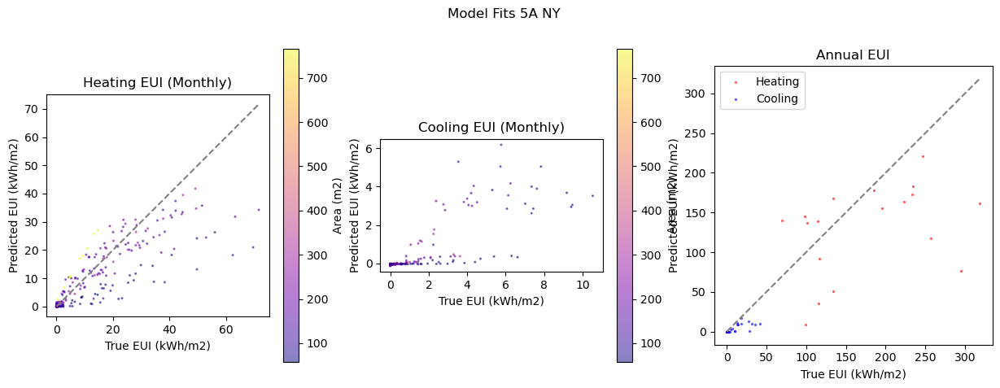

annual urban euis
               True        Pred
Name                           
Cooling    8.989619    3.437580
Heating  137.567148  124.875988
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   93.3 -63.1  13.3   124.9 -63.1  1.6
Heating   52.1 -26.0  82.5    71.4 -26.0  9.4

 -------------------- G2700350 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   2700700
GEOID                                                      2700700
STATEFIP                                                        27
State                                                    Minnesota
PUMA                                                         00700
Name              Crow Wing, Morrison, Todd & Wadena Counties PUMA
state_abbr                                                      MN


c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/169 [00:00<?, ?it/s]

Succesfully pulled 169 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
24 setpoints are crossed over.
127 setpoints are out of bounds (heating: 54, cooling:106).
128 buildings have setpoint errors.
41 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 41/169 buildings in G2700350 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 11/11 [00:00<00:00, 22.93it/s]
Beginning evaluation...
Done evaluating.


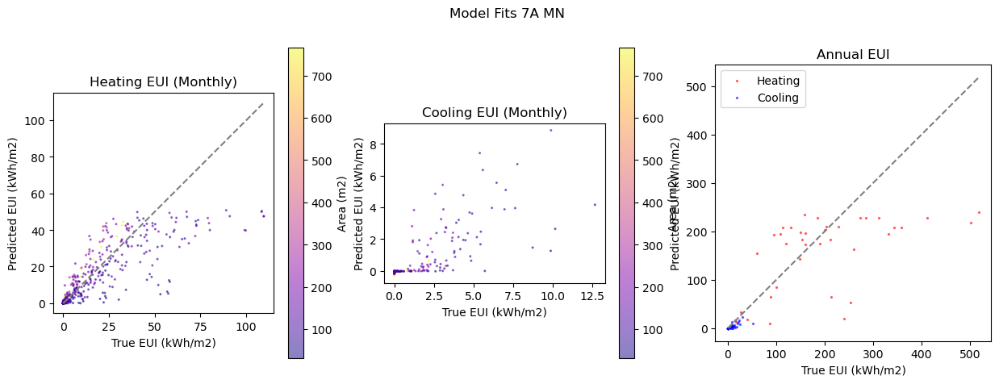

annual urban euis
               True        Pred
Name                           
Cooling    5.963832    2.575472
Heating  158.110072  152.280396
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling  109.0 -55.9    9.0   122.6 -55.9   1.6
Heating   57.8 -19.8  104.7    83.5 -19.8  12.6

 -------------------- G4800290 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G4800290 has 16 PUMAs; lat/lon may be off
GISMATCH                                                   4805901
GEOID                                                      4805901
STATEFIP                                                        48
State                                                        Texas
PUMA                                                         05901
Name                               San Antonio City (Central) PUMA
state_ab

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/2000 [00:00<?, ?it/s]

Succesfully pulled 2000 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
375 setpoints are crossed over.
717 setpoints are out of bounds (heating: 424, cooling:375).
766 buildings have setpoint errors.
1234 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 1234/2803 buildings in G4800290 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 309/309 [00:05<00:00, 54.23it/s]
Beginning evaluation...
Done evaluating.


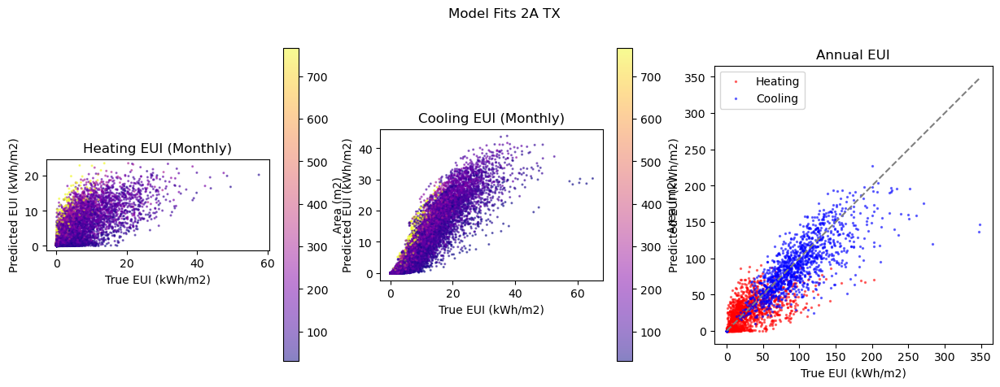

annual urban euis
              True       Pred
Name                         
Cooling  83.186039  84.129756
Heating  29.673229  32.776673
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   29.1  -7.4  27.9    46.4  -7.4  3.8
Heating   77.0 -15.4  24.4   122.5 -15.4  3.2

 -------------------- G5300330 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G5300330 has 16 PUMAs; lat/lon may be off
GISMATCH                                                   5311602
GEOID                                                      5311602
STATEFIP                                                        53
State                                                   Washington
PUMA                                                         11602
Name                                 Seattle City (Northeast) PUMA
state_abbr                

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/2000 [00:00<?, ?it/s]

Succesfully pulled 2000 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
299 setpoints are crossed over.
1006 setpoints are out of bounds (heating: 118, cooling:947).
1033 buildings have setpoint errors.
967 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 967/3632 buildings in G5300330 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 242/242 [00:04<00:00, 51.27it/s]
Beginning evaluation...
Done evaluating.


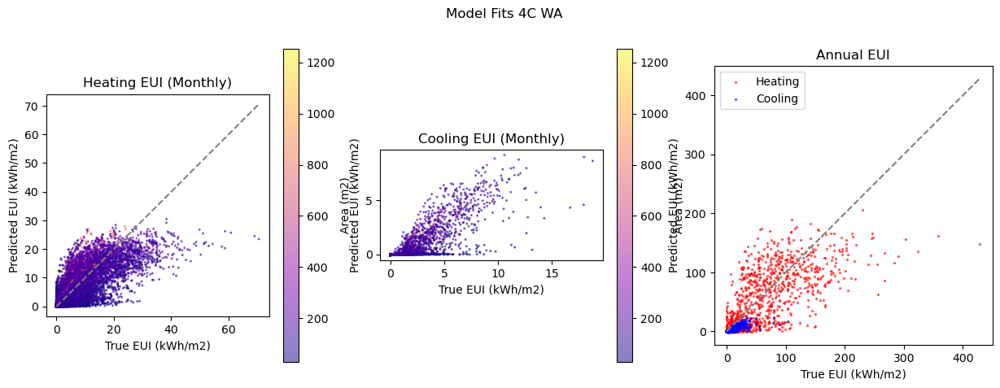

annual urban euis
              True       Pred
Name                         
Cooling   5.450177   2.050124
Heating  74.912097  77.230197
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  143.0 -65.0   8.8   123.7 -65.0  1.5
Heating   67.2 -12.9  47.2    86.3 -12.9  5.1

 -------------------- G1801830 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   1800900
GEOID                                                      1800900
STATEFIP                                                        18
State                                                      Indiana
PUMA                                                         00900
Name              Huntington, Whitley, Adams & Wells Counties PUMA
state_abbr                                                      IN
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/60 [00:00<?, ?it/s]

Succesfully pulled 60 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
9 setpoints are crossed over.
25 setpoints are out of bounds (heating: 6, cooling:21).
26 buildings have setpoint errors.
34 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 34/60 buildings in G1801830 county.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Done preparing weather
Clearing prediction cache.
Predicting DataLoader 0: 100%|██████████| 9/9 [00:00<00:00, 23.04it/s]
Beginning evaluation...
Done evaluating.


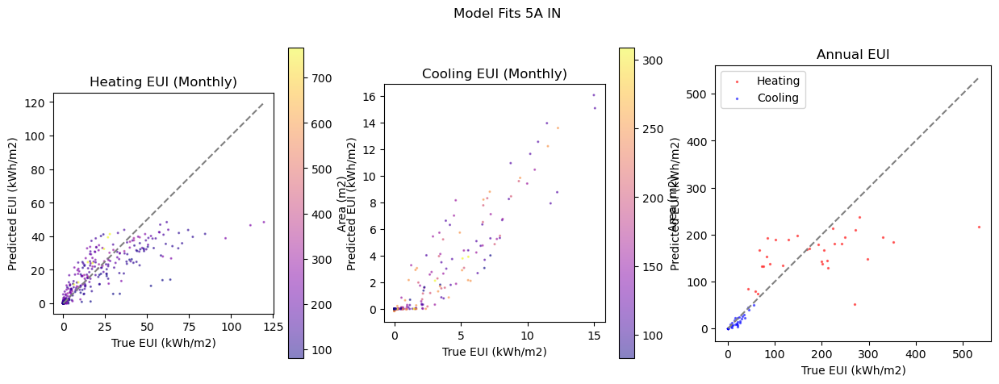

annual urban euis
               True        Pred
Name                           
Cooling   13.894401   11.018423
Heating  165.437547  156.113229
building errors
        Annual             Monthly            
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE  RMSE
Name                                          
Cooling   39.9 -20.6   6.6    61.2 -20.6   1.1
Heating   53.8 -14.3  94.5    76.7 -14.3  11.2

 -------------------- G2905100 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   2901902
GEOID                                                      2901902
STATEFIP                                                        29
State                                                     Missouri
PUMA                                                         01902
Name                                   St. Louis City (South) PUMA
state_abbr                                                    

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/721 [00:00<?, ?it/s]

Succesfully pulled 721 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
151 setpoints are crossed over.
408 setpoints are out of bounds (heating: 169, cooling:320).
423 buildings have setpoint errors.
298 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 298/721 buildings in G2905100 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 75/75 [00:01<00:00, 48.18it/s]
Beginning evaluation...
Done evaluating.


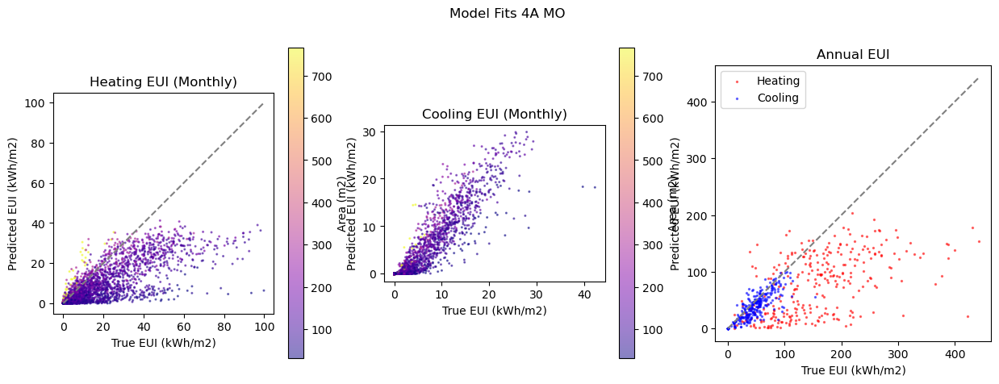

annual urban euis
               True       Pred
Name                          
Cooling   38.063809  33.919362
Heating  150.202342  92.588483
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   39.5 -18.0   17.2    58.9 -18.0   2.5
Heating   68.1 -50.6  107.0   101.2 -50.6  13.3

 -------------------- G2700530 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G2700530 has 10 PUMAs; lat/lon may be off
GISMATCH                                                   2701405
GEOID                                                      2701405
STATEFIP                                                        27
State                                                    Minnesota
PUMA                                                         01405
Name             Hennepin County--Minneapolis (North) & St. Ant...
state_abbr  

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/2000 [00:00<?, ?it/s]

Succesfully pulled 2000 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
332 setpoints are crossed over.
898 setpoints are out of bounds (heating: 150, cooling:816).
920 buildings have setpoint errors.
1080 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 1080/2138 buildings in G2700530 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 270/270 [00:05<00:00, 51.72it/s]
Beginning evaluation...
Done evaluating.


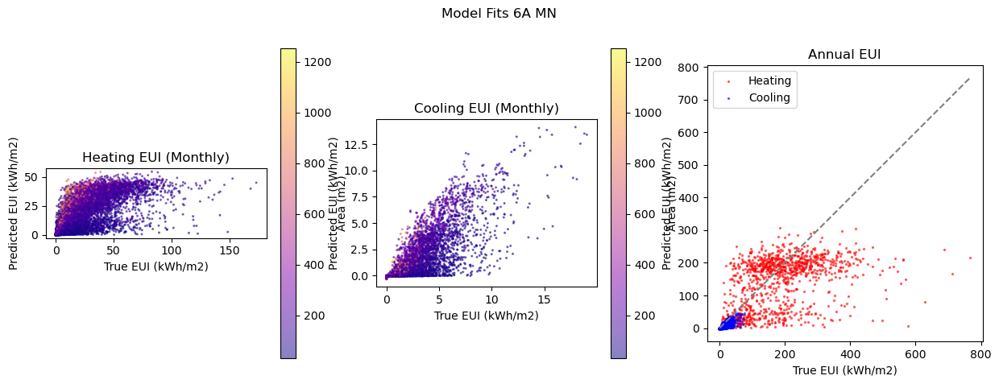

annual urban euis
               True        Pred
Name                           
Cooling    9.983064    6.265355
Heating  172.400450  169.437423
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   81.2 -45.5   10.7    98.8 -45.5   1.5
Heating   62.6 -24.1  115.7    88.9 -24.1  13.8

 -------------------- G4400090 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   4400400
GEOID                                                      4400400
STATEFIP                                                        44
State                                                 Rhode Island
PUMA                                                         00400
Name                    South Rhode Island--Washington County PUMA
state_abbr                                               

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/259 [00:00<?, ?it/s]

Succesfully pulled 259 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
35 setpoints are crossed over.
148 setpoints are out of bounds (heating: 74, cooling:106).
151 buildings have setpoint errors.
108 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 108/259 buildings in G4400090 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 27/27 [00:00<00:00, 35.13it/s]
Beginning evaluation...
Done evaluating.


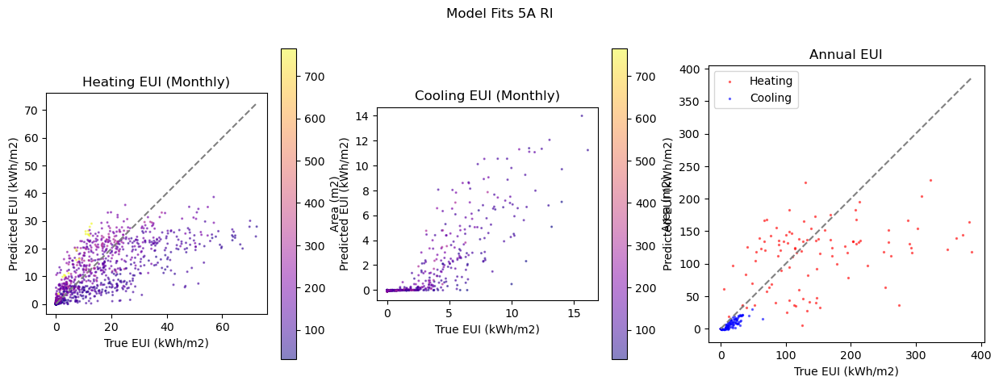

annual urban euis
               True        Pred
Name                           
Cooling   11.319401    5.643218
Heating  128.146549  118.121494
building errors
        Annual             Monthly            
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE  RMSE
Name                                          
Cooling   72.4 -51.5  10.2   108.4 -51.5   1.6
Heating   63.6 -25.4  89.8    84.7 -25.4  10.0

 -------------------- G1000050 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   1000300
GEOID                                                      1000300
STATEFIP                                                        10
State                                                     Delaware
PUMA                                                         00300
Name                                            Sussex County PUMA
state_abbr                                                    

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/533 [00:00<?, ?it/s]

Succesfully pulled 533 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
79 setpoints are crossed over.
336 setpoints are out of bounds (heating: 197, cooling:205).
339 buildings have setpoint errors.
194 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 194/533 buildings in G1000050 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 49/49 [00:01<00:00, 42.80it/s]
Beginning evaluation...
Done evaluating.


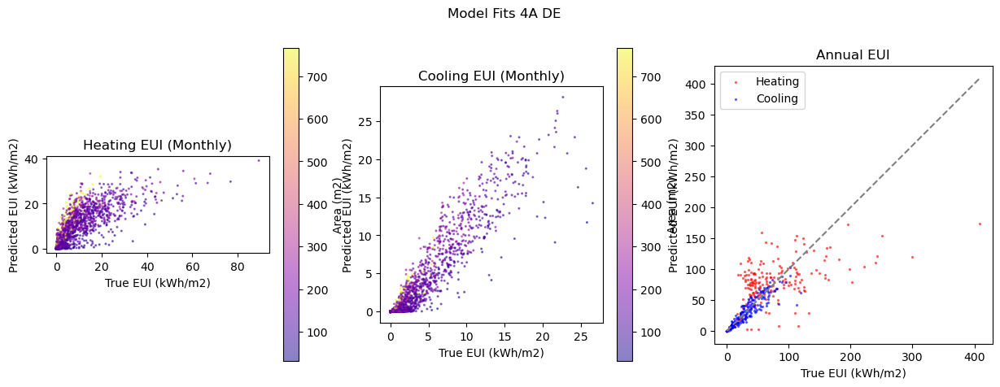

annual urban euis
              True       Pred
Name                         
Cooling  26.544813  26.364555
Heating  63.841444  79.851640
building errors
        Annual            Monthly          
        CVRMSE NMBE  RMSE  CVRMSE NMBE RMSE
Name                                       
Cooling   31.5 -5.0  11.0    59.0 -5.0  1.8
Heating   64.5  3.2  47.7    89.9  3.2  5.6

 -------------------- G5300530 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G5300530 has 7 PUMAs; lat/lon may be off
GISMATCH                                                   5311505
GEOID                                                      5311505
STATEFIP                                                        53
State                                                   Washington
PUMA                                                         11505
Name             Pierce County (North Central)--Tacoma (Port) &...
state_abbr                           

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/1374 [00:00<?, ?it/s]

Succesfully pulled 1374 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
182 setpoints are crossed over.
719 setpoints are out of bounds (heating: 94, cooling:668).
727 buildings have setpoint errors.
647 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 647/1374 buildings in G5300530 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 162/162 [00:03<00:00, 50.72it/s]
Beginning evaluation...
Done evaluating.


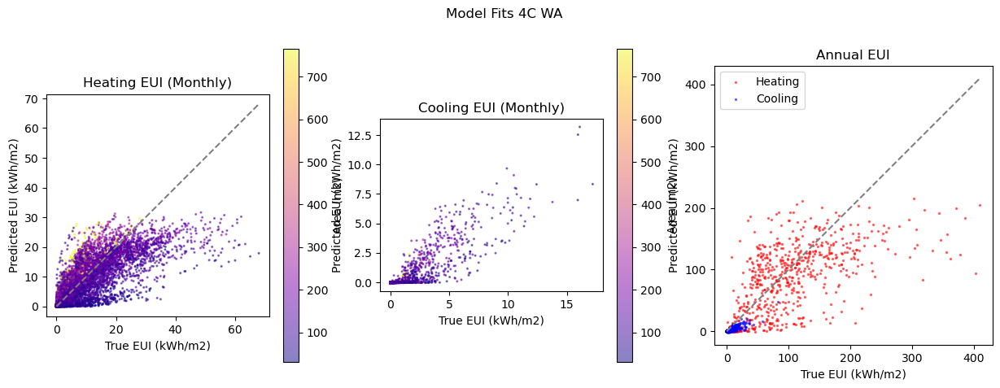

annual urban euis
               True        Pred
Name                           
Cooling    3.398361    1.386970
Heating  102.664960  102.218288
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  135.5 -59.9   5.5   133.8 -59.9  1.1
Heating   60.9 -17.0  62.3    76.8 -17.0  6.5

 -------------------- G2500170 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G2500170 has 16 PUMAs; lat/lon may be off
GISMATCH                                                   2500400
GEOID                                                      2500400
STATEFIP                                                        25
State                                                Massachusetts
PUMA                                                         00400
Name             Worcester & Middlesex Counties (Outside Leomin...
state_abbr        

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/2000 [00:00<?, ?it/s]

Succesfully pulled 2000 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
445 setpoints are crossed over.
967 setpoints are out of bounds (heating: 174, cooling:865).
1005 buildings have setpoint errors.
995 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 995/2551 buildings in G2500170 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 249/249 [00:04<00:00, 53.55it/s]
Beginning evaluation...
Done evaluating.


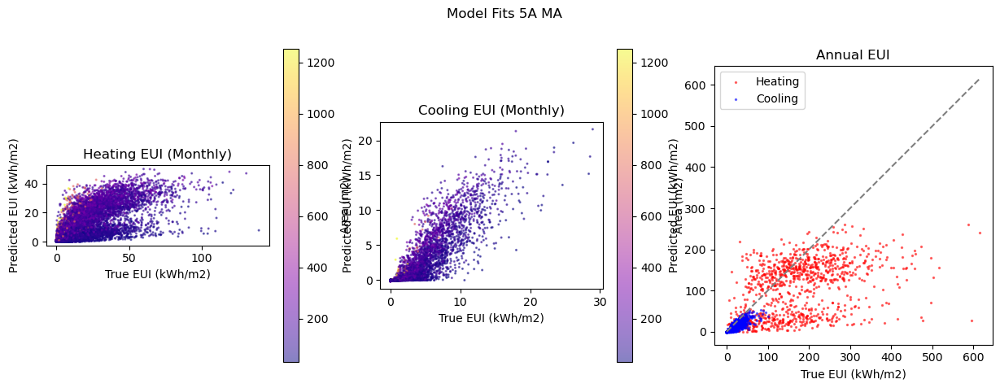

annual urban euis
               True        Pred
Name                           
Cooling   15.747714   10.415776
Heating  161.478171  123.684236
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   61.7 -39.3   12.2    86.0 -39.3   1.8
Heating   66.8 -38.1  115.1    93.4 -38.1  13.4

 -------------------- G0801070 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                    800200
GEOID                                                      0800200
STATEFIP                                                        08
State                                                     Colorado
PUMA                                                         00200
Name             Northwest Colorado--Garfield, Routt, Moffat & ...
state_abbr                                               

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/68 [00:00<?, ?it/s]

Succesfully pulled 68 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
13 setpoints are crossed over.
53 setpoints are out of bounds (heating: 14, cooling:44).
53 buildings have setpoint errors.
15 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 15/68 buildings in G0801070 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 4/4 [00:00<00:00, 11.90it/s]
Beginning evaluation...
Done evaluating.


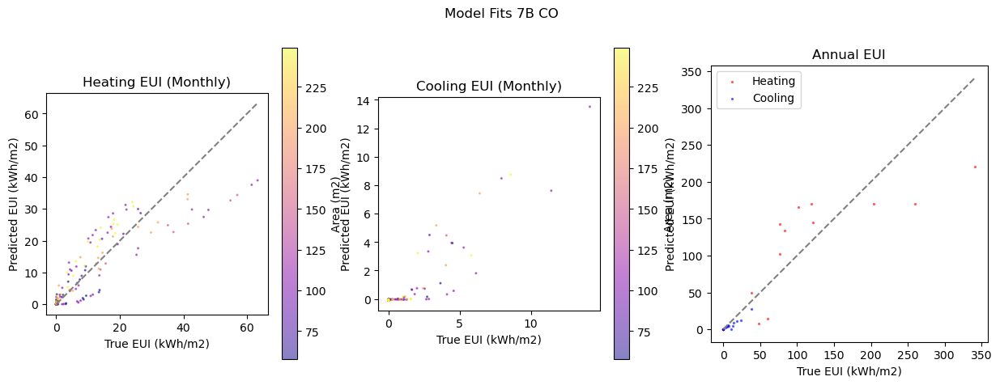

annual urban euis
               True        Pred
Name                           
Cooling    9.498110    5.837255
Heating  104.484922  107.509566
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   60.1 -41.2   5.9    95.1 -41.2  1.1
Heating   52.0  -2.3  53.1    71.4  -2.3  6.1

 -------------------- G0800490 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                    800400
GEOID                                                      0800400
STATEFIP                                                        08
State                                                     Colorado
PUMA                                                         00400
Name                  Eagle, Summit, Grand & Jackson Counties PUMA
state_abbr                                                      CO


c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/67 [00:00<?, ?it/s]

Succesfully pulled 67 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
5 setpoints are crossed over.
57 setpoints are out of bounds (heating: 44, cooling:40).
57 buildings have setpoint errors.
10 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 10/67 buildings in G0800490 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 3/3 [00:00<00:00, 11.42it/s]
Beginning evaluation...
Done evaluating.


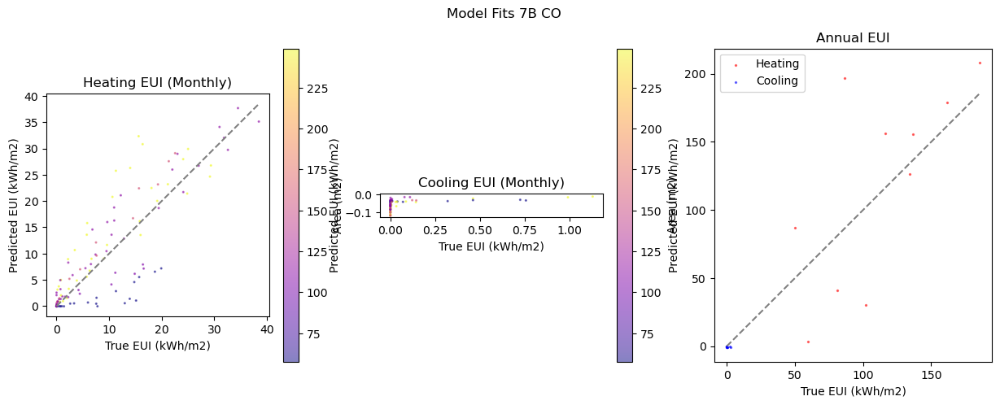

annual urban euis
               True        Pred
Name                           
Cooling    0.634576   -0.493857
Heating  116.210565  139.038086
building errors
        Annual              Monthly            
        CVRMSE   NMBE  RMSE  CVRMSE   NMBE RMSE
Name                                           
Cooling  269.7 -174.2   1.6   313.4 -174.2  0.3
Heating   46.0    6.2  51.2    59.2    6.2  5.5

 -------------------- G5108400 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   5151084
GEOID                                                      5151084
STATEFIP                                                        51
State                                                     Virginia
PUMA                                                         51084
Name             Northern Shenandoah Valley Regional Commission...
state_abbr                                               

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/49 [00:00<?, ?it/s]

Succesfully pulled 49 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
7 setpoints are crossed over.
20 setpoints are out of bounds (heating: 5, cooling:16).
20 buildings have setpoint errors.
29 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 29/49 buildings in G5108400 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 8/8 [00:00<00:00, 19.11it/s]
Beginning evaluation...
Done evaluating.


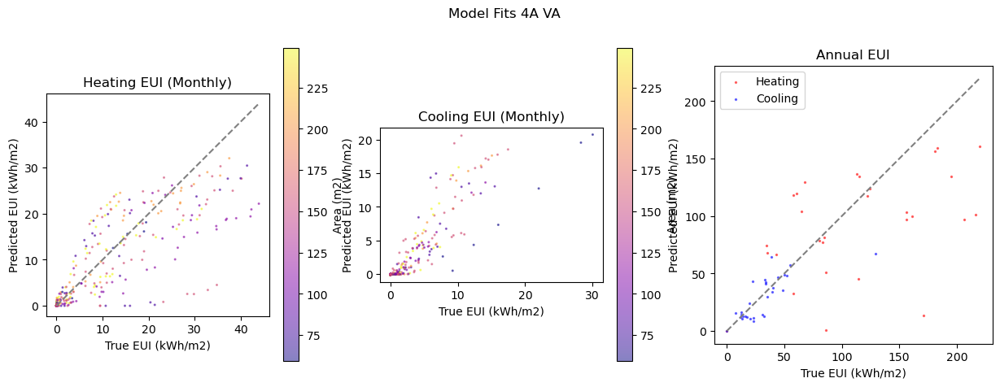

annual urban euis
               True       Pred
Name                          
Cooling   28.384505  27.343598
Heating  109.041275  93.472150
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   48.2  -8.9  15.2    78.2  -8.9  2.1
Heating   51.6 -18.1  58.4    72.0 -18.1  6.8

 -------------------- G5500790 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G5500790 has 8 PUMAs; lat/lon may be off
GISMATCH                                                   5541001
GEOID                                                      5541001
STATEFIP                                                        55
State                                                    Wisconsin
PUMA                                                         41001
Name                                   Milwaukee City (North) PUMA
state_abbr             

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/1718 [00:00<?, ?it/s]

Succesfully pulled 1718 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
291 setpoints are crossed over.
772 setpoints are out of bounds (heating: 193, cooling:648).
791 buildings have setpoint errors.
927 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 927/1718 buildings in G5500790 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 232/232 [00:04<00:00, 53.36it/s]
Beginning evaluation...
Done evaluating.


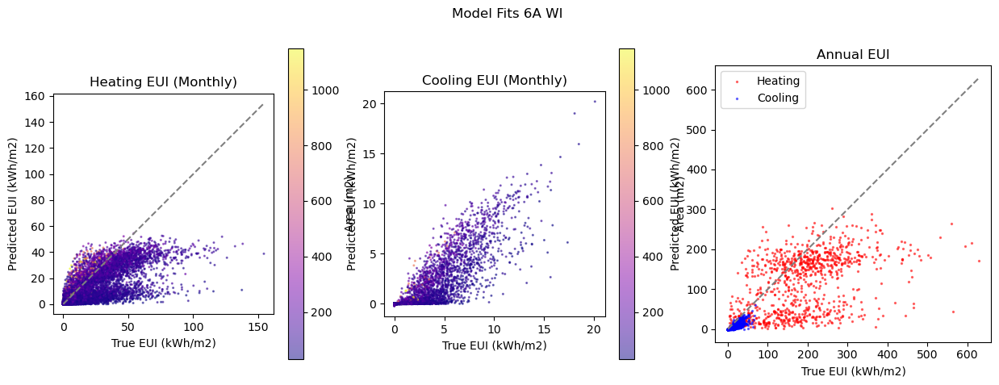

annual urban euis
               True        Pred
Name                           
Cooling   10.840933    5.745712
Heating  177.556311  135.517748
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   79.9 -51.0   10.9    98.4 -51.0   1.7
Heating   63.9 -38.6  121.3    91.6 -38.6  14.5

 -------------------- G3701990 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   3700100
GEOID                                                      3700100
STATEFIP                                                        37
State                                               North Carolina
PUMA                                                         00100
Name             Boone High Country--Watauga, Ashe, Yancey, Ave...
state_abbr                                               

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/46 [00:00<?, ?it/s]

Succesfully pulled 46 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
4 setpoints are crossed over.
25 setpoints are out of bounds (heating: 11, cooling:19).
27 buildings have setpoint errors.
19 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 19/46 buildings in G3701990 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 5/5 [00:00<00:00, 13.61it/s]
Beginning evaluation...
Done evaluating.


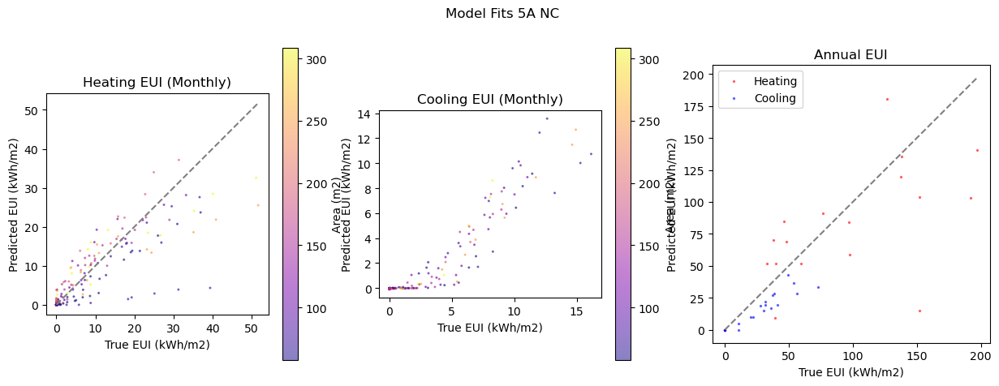

annual urban euis
              True       Pred
Name                         
Cooling  27.615032  16.313806
Heating  92.514945  84.378534
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   52.4 -41.7  15.8    64.5 -41.7  1.9
Heating   53.3 -14.8  46.9    78.4 -14.8  5.7

 -------------------- G0600370 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G0600370 has 69 PUMAs; lat/lon may be off
GISMATCH                                                    603708
GEOID                                                      0603708
STATEFIP                                                        06
State                                                   California
PUMA                                                         03708
Name             Los Angeles County (North)--LA City (Northeast...
state_abbr                

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/2000 [00:00<?, ?it/s]

Succesfully pulled 2000 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
466 setpoints are crossed over.
892 setpoints are out of bounds (heating: 302, cooling:690).
923 buildings have setpoint errors.
1077 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 1077/14394 buildings in G0600370 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 270/270 [00:05<00:00, 52.28it/s]
Beginning evaluation...
Done evaluating.


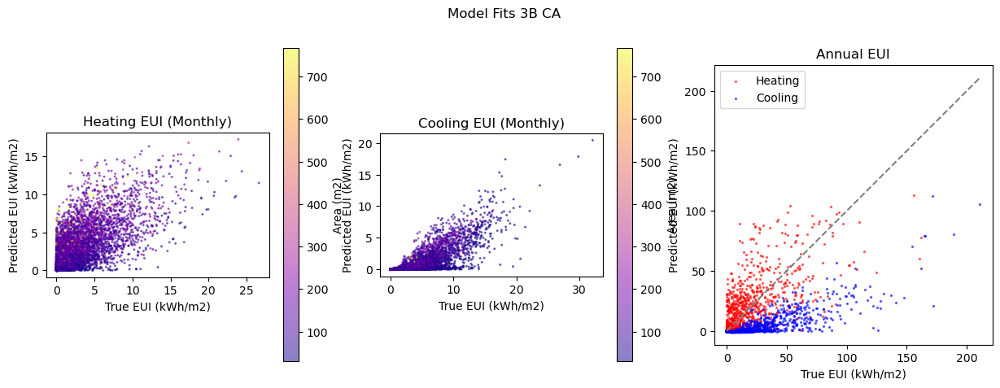

annual urban euis
              True       Pred
Name                         
Cooling  19.362653   3.397385
Heating  17.444818  22.769280
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  125.2 -81.4  30.8   113.1 -81.4  3.5
Heating  110.4   9.5  17.6   131.1   9.5  1.9

 -------------------- G1901970 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   1900600
GEOID                                                      1900600
STATEFIP                                                        19
State                                                         Iowa
PUMA                                                         00600
Name             Webster, Hardin, Hamilton, Butler, Wright, Gru...
state_abbr                                                      IA
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/27 [00:00<?, ?it/s]

Succesfully pulled 27 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
3 setpoints are crossed over.
14 setpoints are out of bounds (heating: 3, cooling:12).
14 buildings have setpoint errors.
13 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 13/27 buildings in G1901970 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 4/4 [00:00<00:00, 19.35it/s]
Beginning evaluation...
Done evaluating.


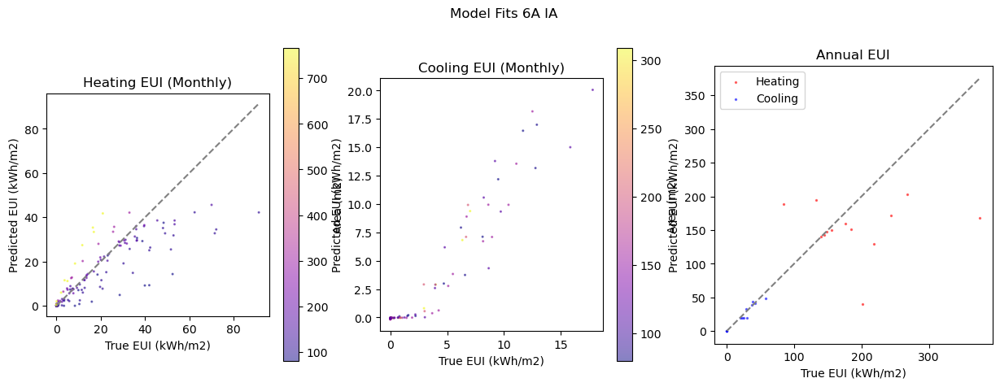

annual urban euis
               True        Pred
Name                           
Cooling   16.170138   14.855344
Heating  156.242833  166.472498
building errors
        Annual             Monthly            
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE  RMSE
Name                                          
Cooling   21.1  -6.4   4.9    55.6  -6.4   1.6
Heating   46.5 -19.7  88.5    65.9 -19.7  10.4

 -------------------- G0400250 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                    400500
GEOID                                                      0400500
STATEFIP                                                        04
State                                                      Arizona
PUMA                                                         00500
Name                                           Yavapai County PUMA
state_abbr                                                    

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/466 [00:00<?, ?it/s]

Succesfully pulled 466 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
82 setpoints are crossed over.
212 setpoints are out of bounds (heating: 111, cooling:139).
217 buildings have setpoint errors.
249 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 249/466 buildings in G0400250 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 63/63 [00:01<00:00, 46.68it/s]
Beginning evaluation...
Done evaluating.


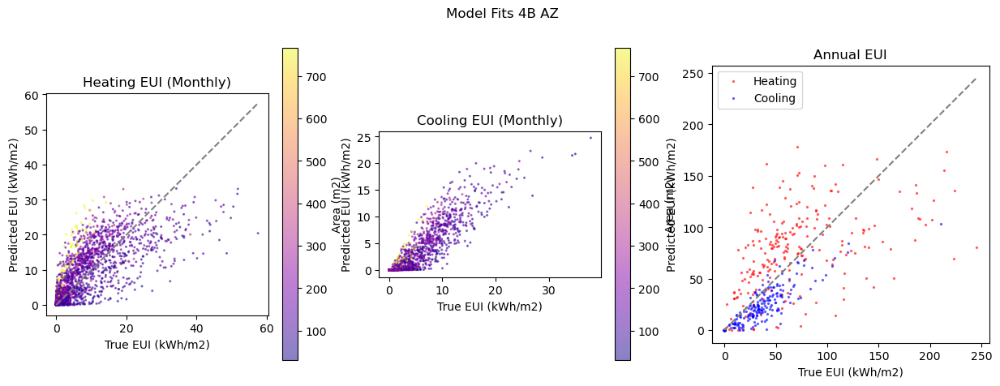

annual urban euis
              True       Pred
Name                         
Cooling  25.834229  18.010767
Heating  57.773525  79.803297
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   57.5 -34.9  17.2    69.4 -34.9  2.3
Heating   68.7  10.3  44.9    95.6  10.3  5.2

 -------------------- G4805070 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   4806200
GEOID                                                      4806200
STATEFIP                                                        48
State                                                        Texas
PUMA                                                         06200
Name                    Middle Rio Grande Development Council PUMA
state_abbr                                                      TX
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/18 [00:00<?, ?it/s]

Succesfully pulled 18 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
2 setpoints are crossed over.
6 setpoints are out of bounds (heating: 5, cooling:2).
6 buildings have setpoint errors.
12 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 12/18 buildings in G4805070 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 3/3 [00:00<00:00, 10.11it/s]
Beginning evaluation...
Done evaluating.


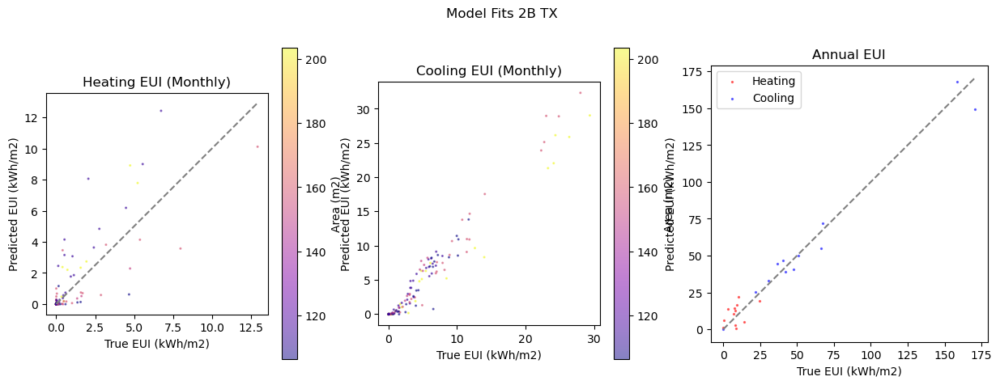

annual urban euis
              True       Pred
Name                         
Cooling  67.011763  65.850617
Heating   8.802099  10.690210
building errors
        Annual            Monthly           
        CVRMSE  NMBE RMSE  CVRMSE  NMBE RMSE
Name                                        
Cooling   13.8  -1.2  8.4    29.6  -1.2  1.6
Heating   84.2  23.3  7.2   178.5  23.3  1.3

 -------------------- G3400410 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   3401700
GEOID                                                      3401700
STATEFIP                                                        34
State                                                   New Jersey
PUMA                                                         01700
Name                                            Warren County PUMA
state_abbr                                                      NJ
division_name

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/187 [00:00<?, ?it/s]

Succesfully pulled 187 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
38 setpoints are crossed over.
90 setpoints are out of bounds (heating: 24, cooling:72).
96 buildings have setpoint errors.
91 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 91/187 buildings in G3400410 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 23/23 [00:00<00:00, 33.55it/s]
Beginning evaluation...
Done evaluating.


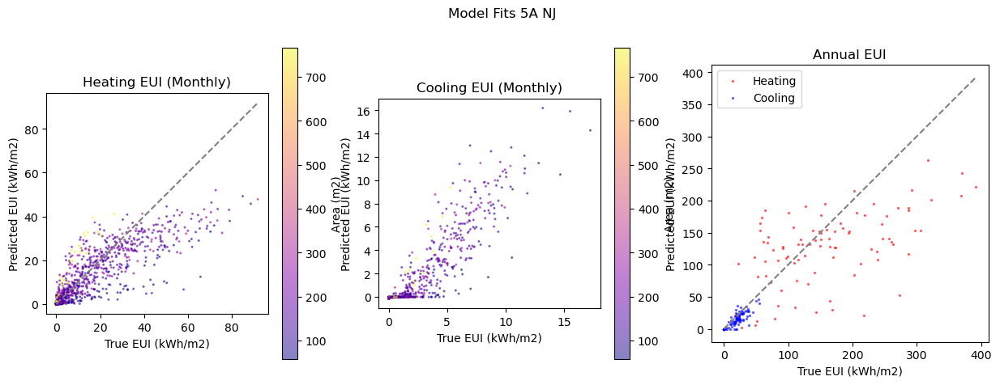

annual urban euis
               True        Pred
Name                           
Cooling   18.813210   14.743810
Heating  156.216231  141.312495
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   45.3 -26.7   9.1    68.4 -26.7  1.3
Heating   50.6 -21.0  82.0    73.5 -21.0  9.9

 -------------------- G0400270 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                    400700
GEOID                                                      0400700
STATEFIP                                                        04
State                                                      Arizona
PUMA                                                         00700
Name                                   Yuma County--Yuma City PUMA
state_abbr                                                      AZ


c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/371 [00:00<?, ?it/s]

Succesfully pulled 371 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
35 setpoints are crossed over.
149 setpoints are out of bounds (heating: 120, cooling:40).
150 buildings have setpoint errors.
221 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 221/371 buildings in G0400270 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 56/56 [00:01<00:00, 43.45it/s]
Beginning evaluation...
Done evaluating.


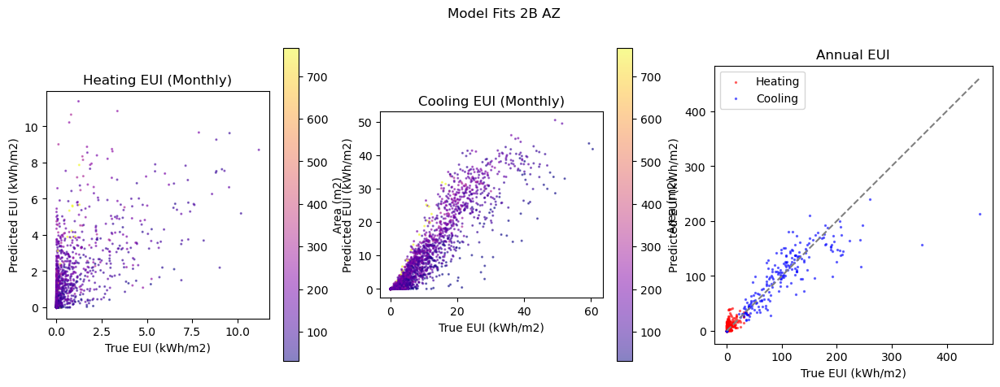

annual urban euis
              True       Pred
Name                         
Cooling  91.192878  96.709106
Heating   4.279573  11.188194
building errors
        Annual              Monthly            
        CVRMSE   NMBE  RMSE  CVRMSE   NMBE RMSE
Name                                           
Cooling   34.6   -3.6  34.6    50.0   -3.6  4.5
Heating  198.9  103.1   9.7   292.1  103.1  1.3

 -------------------- G1301210 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G1301210 has 8 PUMAs; lat/lon may be off
GISMATCH                                                   1301006
GEOID                                                      1301006
STATEFIP                                                        13
State                                                      Georgia
PUMA                                                         01006
Name             Atlanta Regional Commission (Central)--Fulton ...
state_abbr       

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/1852 [00:00<?, ?it/s]

Succesfully pulled 1852 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
480 setpoints are crossed over.
989 setpoints are out of bounds (heating: 422, cooling:725).
1041 buildings have setpoint errors.
811 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 811/1852 buildings in G1301210 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 203/203 [00:03<00:00, 51.69it/s]
Beginning evaluation...
Done evaluating.


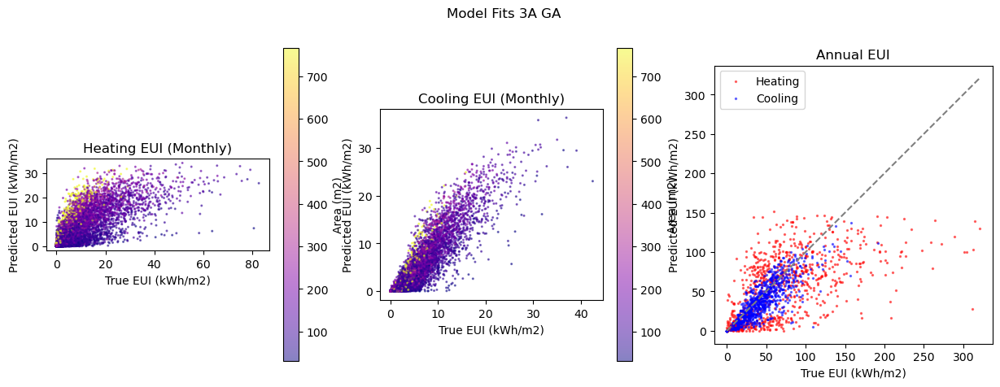

annual urban euis
              True       Pred
Name                         
Cooling  38.601938  36.307525
Heating  70.391039  72.370514
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   36.9 -15.1  16.6    59.4 -15.1  2.3
Heating   68.5 -22.6  50.0   100.8 -22.6  6.2

 -------------------- G3600470 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G3600470 has 18 PUMAs; lat/lon may be off
GISMATCH                                                   3604004
GEOID                                                      3604004
STATEFIP                                                        36
State                                                     New York
PUMA                                                         04004
Name             NYC-Brooklyn Community District 2--Brooklyn He...
state_abbr                

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/2000 [00:00<?, ?it/s]

Succesfully pulled 2000 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
602 setpoints are crossed over.
1124 setpoints are out of bounds (heating: 291, cooling:977).
1160 buildings have setpoint errors.
840 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 840/4189 buildings in G3600470 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 210/210 [00:03<00:00, 52.58it/s]
Beginning evaluation...
Done evaluating.


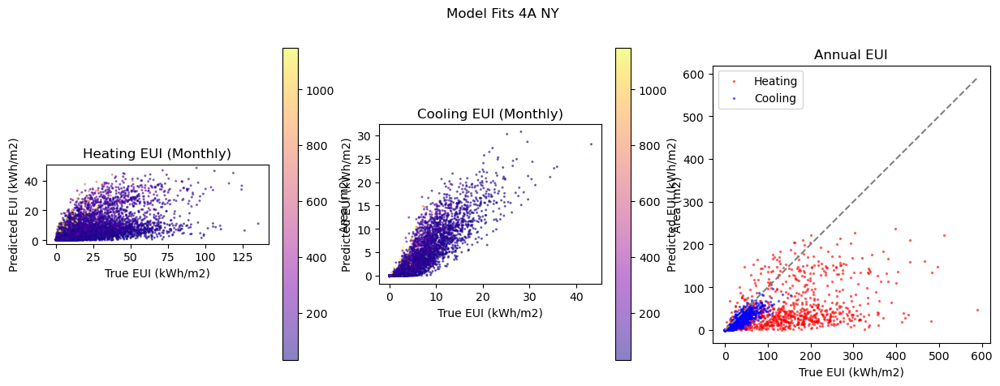

annual urban euis
               True       Pred
Name                          
Cooling   28.297730  19.119071
Heating  144.300029  69.593318
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   53.6 -36.8   18.2    73.3 -36.8   2.5
Heating   88.6 -65.8  135.6   128.8 -65.8  16.6

 -------------------- G5300770 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   5310901
GEOID                                                      5310901
STATEFIP                                                        53
State                                                   Washington
PUMA                                                         10901
Name             Yakima County (Central)--Greater Yakima City PUMA
state_abbr                                                   

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/355 [00:00<?, ?it/s]

Succesfully pulled 355 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
56 setpoints are crossed over.
133 setpoints are out of bounds (heating: 32, cooling:113).
137 buildings have setpoint errors.
218 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 218/355 buildings in G5300770 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 55/55 [00:01<00:00, 43.55it/s]
Beginning evaluation...
Done evaluating.


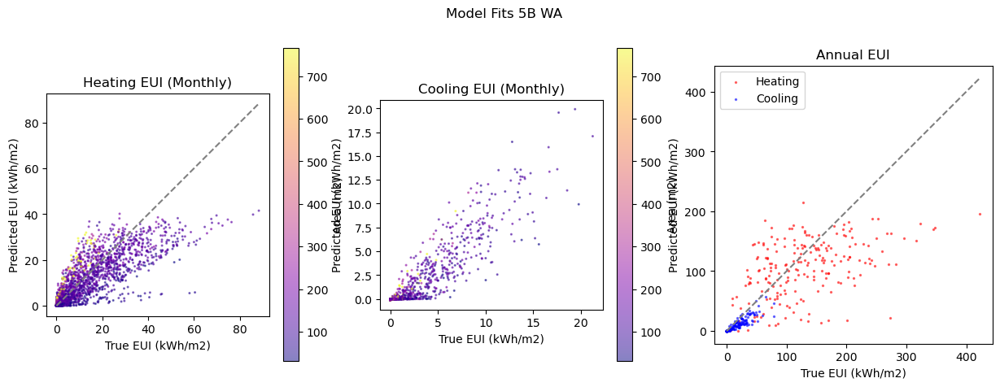

annual urban euis
               True        Pred
Name                           
Cooling   11.216371    7.402368
Heating  114.687590  112.144735
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   72.0 -37.3   9.6    80.6 -37.3  1.6
Heating   55.4 -19.5  69.7    75.3 -19.5  7.9

 -------------------- G3801050 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   3800100
GEOID                                                      3800100
STATEFIP                                                        38
State                                                 North Dakota
PUMA                                                         00100
Name                            West North Dakota--Minot City PUMA
state_abbr                                                      ND


c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/66 [00:00<?, ?it/s]

Succesfully pulled 66 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
13 setpoints are crossed over.
42 setpoints are out of bounds (heating: 12, cooling:38).
43 buildings have setpoint errors.
23 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 23/66 buildings in G3801050 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 6/6 [00:00<00:00, 16.85it/s]
Beginning evaluation...
Done evaluating.


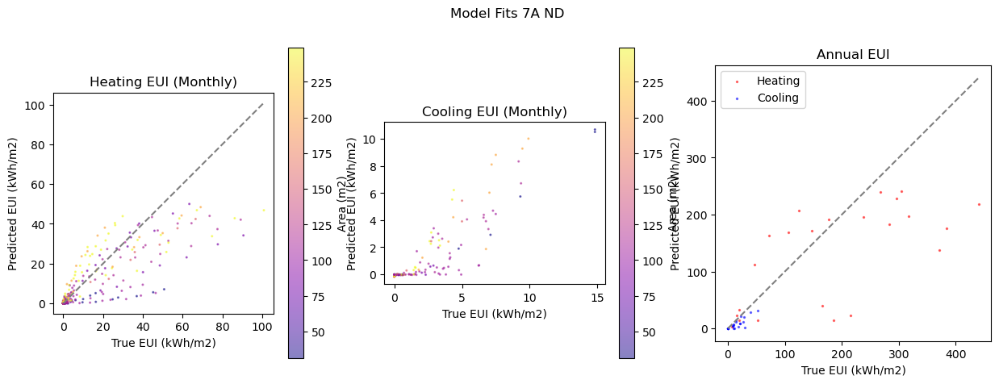

annual urban euis
               True        Pred
Name                           
Cooling   14.030520    8.363287
Heating  194.080032  153.899808
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   68.6 -46.6   10.4    88.1 -46.6   1.5
Heating   60.7 -29.7  112.4    86.0 -29.7  13.3

 -------------------- G4900350 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G4900350 has 9 PUMAs; lat/lon may be off
GISMATCH                                                   4935002
GEOID                                                      4935002
STATEFIP                                                        49
State                                                         Utah
PUMA                                                         35002
Name             Salt Lake County (Northeast)--Salt Lake City (...
state_abb

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/1553 [00:00<?, ?it/s]

Succesfully pulled 1553 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
315 setpoints are crossed over.
636 setpoints are out of bounds (heating: 132, cooling:559).
663 buildings have setpoint errors.
890 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 890/1553 buildings in G4900350 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 223/223 [00:04<00:00, 51.19it/s]
Beginning evaluation...
Done evaluating.


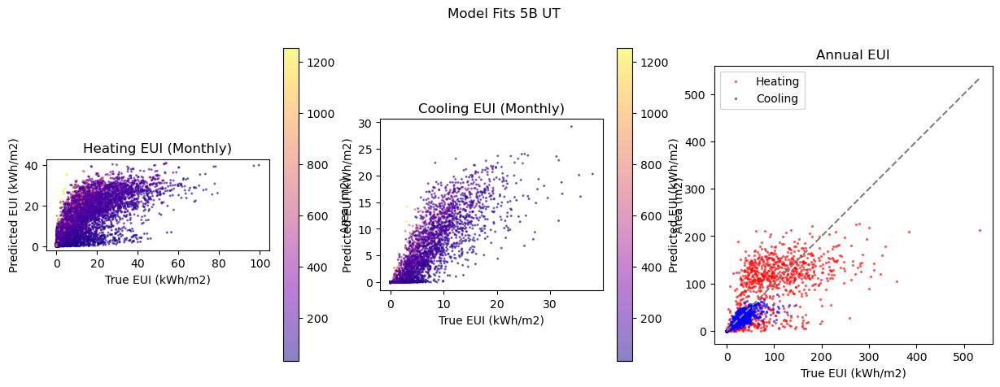

annual urban euis
              True        Pred
Name                          
Cooling  18.771706   18.335239
Heating  94.158336  115.099895
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   59.1 -16.7  13.5    76.3 -16.7  2.3
Heating   62.4  -2.7  62.8    87.2  -2.7  7.3

 -------------------- G0600010 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G0600010 has 10 PUMAs; lat/lon may be off
GISMATCH                                                    600103
GEOID                                                      0600103
STATEFIP                                                        06
State                                                   California
PUMA                                                         00103
Name             Alameda County (Northeast)--Oakland (East) & P...
state_abbr            

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/2000 [00:00<?, ?it/s]

Succesfully pulled 2000 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
313 setpoints are crossed over.
945 setpoints are out of bounds (heating: 182, cooling:837).
973 buildings have setpoint errors.
1027 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 1027/2443 buildings in G0600010 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 257/257 [00:04<00:00, 51.91it/s]
Beginning evaluation...
Done evaluating.


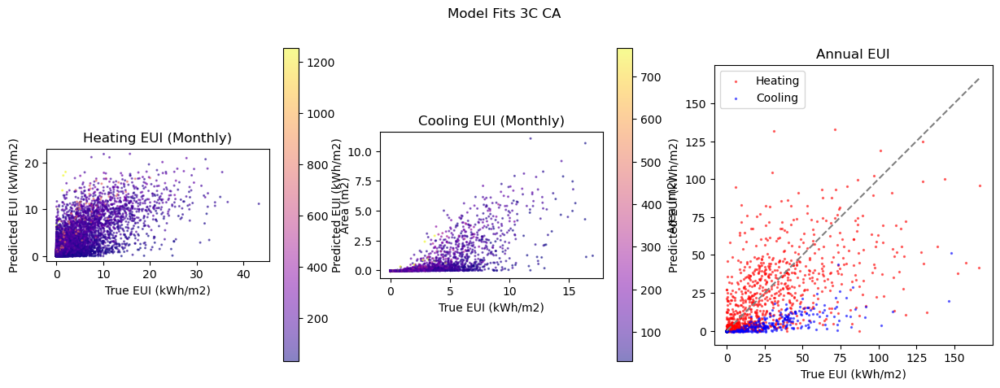

annual urban euis
              True       Pred
Name                         
Cooling   6.505893   1.091626
Heating  27.857401  28.290695
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling  204.3 -82.8  16.6   114.5 -82.8  3.2
Heating   90.8 -18.9  24.0   130.3 -18.9  2.9

 -------------------- G4201330 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   4203601
GEOID                                                      4203601
STATEFIP                                                        42
State                                                 Pennsylvania
PUMA                                                         03601
Name                York County (Central)--York City & Shiloh PUMA
state_abbr                                                      PA
division

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/744 [00:00<?, ?it/s]

Succesfully pulled 744 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
161 setpoints are crossed over.
335 setpoints are out of bounds (heating: 77, cooling:291).
353 buildings have setpoint errors.
391 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 391/744 buildings in G4201330 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 98/98 [00:02<00:00, 47.71it/s]
Beginning evaluation...
Done evaluating.


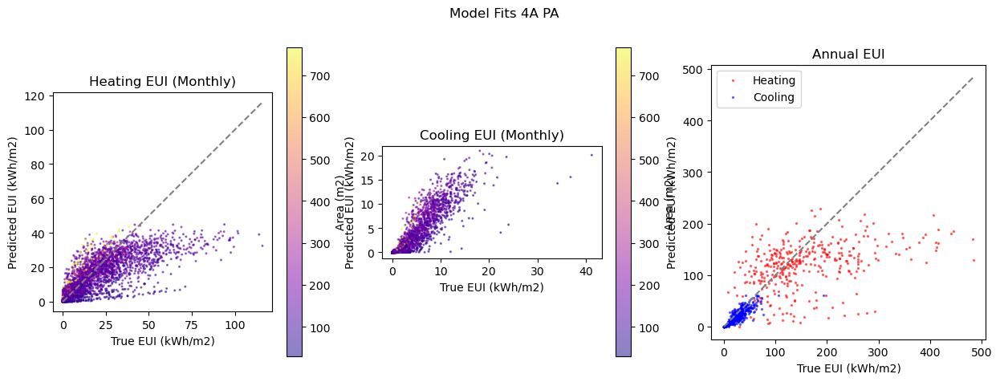

annual urban euis
               True        Pred
Name                           
Cooling   23.872014   19.537573
Heating  137.347642  120.439132
building errors
        Annual             Monthly            
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE  RMSE
Name                                          
Cooling   46.8 -23.3  12.8    69.5 -23.3   1.7
Heating   59.4 -24.8  88.6    86.9 -24.8  10.8

 -------------------- G2601630 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G2601630 has 13 PUMAs; lat/lon may be off
GISMATCH                                                   2603210
GEOID                                                      2603210
STATEFIP                                                        26
State                                                     Michigan
PUMA                                                         03210
Name                                 Detroit City (Northeast) PUMA
state_abbr   

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/2000 [00:00<?, ?it/s]

Succesfully pulled 2000 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
349 setpoints are crossed over.
1038 setpoints are out of bounds (heating: 381, cooling:807).
1063 buildings have setpoint errors.
937 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 937/3367 buildings in G2601630 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 235/235 [00:04<00:00, 53.65it/s]
Beginning evaluation...
Done evaluating.


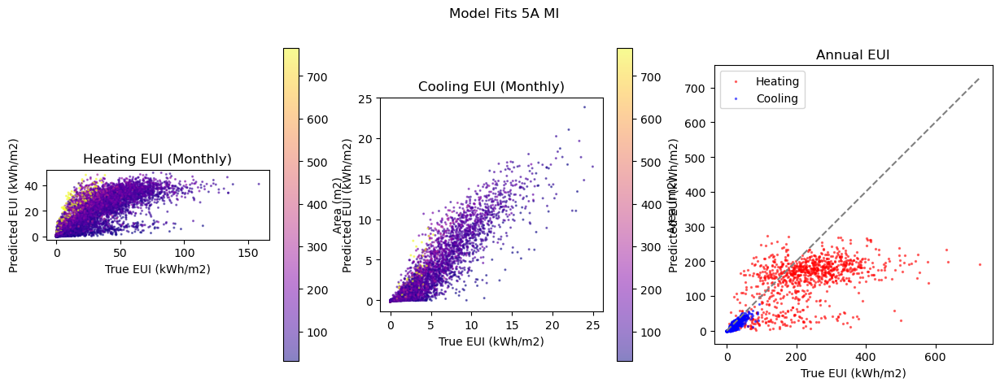

annual urban euis
               True        Pred
Name                           
Cooling   18.019385   13.266253
Heating  213.536163  161.476723
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   47.4 -29.8   10.0    69.8 -29.8   1.5
Heating   55.2 -35.7  127.1    79.6 -35.7  15.3

 -------------------- G3600610 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
County G3600610 has 10 PUMAs; lat/lon may be off
GISMATCH                                                   3603810
GEOID                                                      3603810
STATEFIP                                                        36
State                                                     New York
PUMA                                                         03810
Name             NYC-Manhattan Community District 1 & 2--Batter...
state_ab

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/2000 [00:00<?, ?it/s]

Succesfully pulled 2000 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
578 setpoints are crossed over.
1193 setpoints are out of bounds (heating: 391, cooling:996).
1236 buildings have setpoint errors.
764 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 764/3512 buildings in G3600610 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 191/191 [00:03<00:00, 53.59it/s]
Beginning evaluation...
Done evaluating.


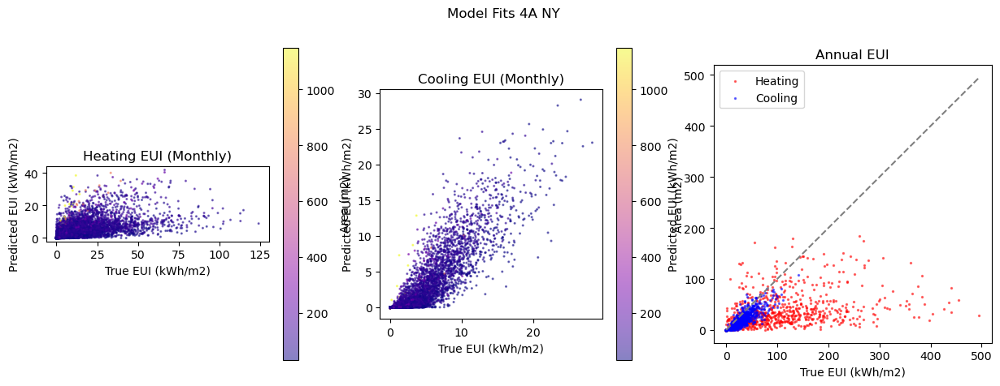

annual urban euis
               True       Pred
Name                          
Cooling   23.961757  16.091918
Heating  103.236545  46.939220
building errors
        Annual              Monthly            
        CVRMSE  NMBE   RMSE  CVRMSE  NMBE  RMSE
Name                                           
Cooling   53.7 -35.7   15.5    76.0 -35.7   2.2
Heating  100.7 -65.4  108.7   144.2 -65.4  13.4

 -------------------- G4701890 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                   4702300
GEOID                                                      4702300
STATEFIP                                                        47
State                                                    Tennessee
PUMA                                                         02300
Name             Wilson County--Lebanon & Mount Juliet Cities PUMA
state_abbr                                                   

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/203 [00:00<?, ?it/s]

Succesfully pulled 203 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
43 setpoints are crossed over.
93 setpoints are out of bounds (heating: 22, cooling:80).
97 buildings have setpoint errors.
106 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 106/203 buildings in G4701890 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 27/27 [00:00<00:00, 37.39it/s]
Beginning evaluation...
Done evaluating.


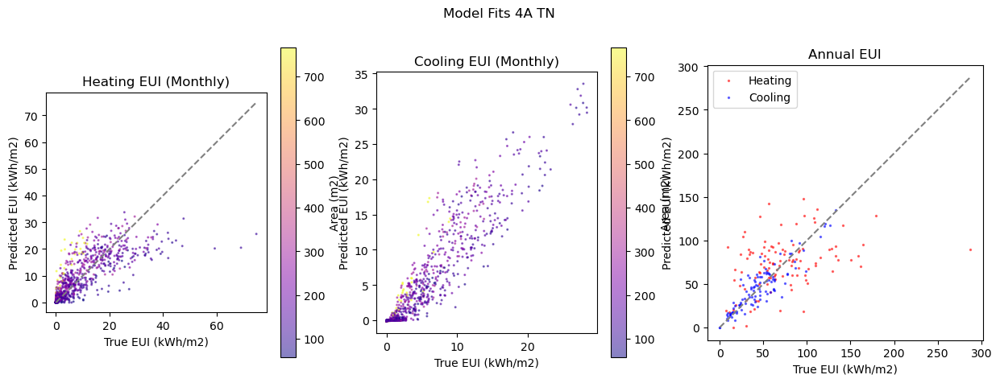

annual urban euis
              True       Pred
Name                         
Cooling  38.428679  41.443393
Heating  62.603648  77.098531
building errors
        Annual            Monthly          
        CVRMSE NMBE  RMSE  CVRMSE NMBE RMSE
Name                                       
Cooling   27.3  1.4  12.5    57.9  1.4  2.3
Heating   57.9  0.9  42.0    88.6  0.9  5.4

 -------------------- G0101330 --------------------
Loading surrogate model from cache...
Surrogate model loaded.
Loading Data For County
GISMATCH                                                    100700
GEOID                                                      0100700
STATEFIP                                                        01
State                                                      Alabama
PUMA                                                         00700
Name                               Cullman & Winston Counties PUMA
state_abbr                                                      AL
division_name     

c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:387: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\pandas\io\formats\printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
c:\tool

  0%|          | 0/55 [00:00<?, ?it/s]

Succesfully pulled 55 parquet files.
Preparing EPD/LPD features...
Done preparing EPD/LPD features.
Preparing shoebox features...
9 setpoints are crossed over.
23 setpoints are out of bounds (heating: 14, cooling:14).
23 buildings have setpoint errors.
32 buildings remain after setpoint errors.
Done preparing shoebox features.
Preparing weather...
Will process 32/55 buildings in G0101330 county.


Done preparing weather
Clearing prediction cache.


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\tools\Anaconda3\envs\ml-for-bem-final\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 8/8 [00:00<00:00, 18.71it/s]
Beginning evaluation...
Done evaluating.


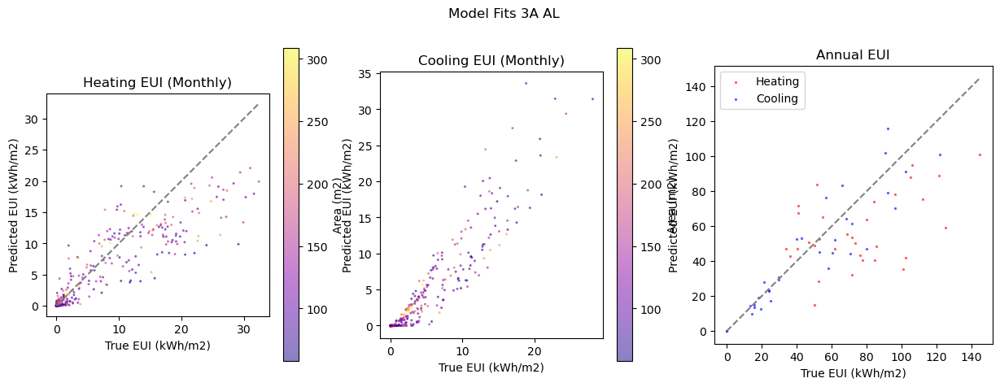

annual urban euis
              True       Pred
Name                         
Cooling  46.618915  43.132945
Heating  76.321888  60.337546
building errors
        Annual             Monthly           
        CVRMSE  NMBE  RMSE  CVRMSE  NMBE RMSE
Name                                         
Cooling   27.8  -7.5  13.7    52.0  -7.5  2.3
Heating   41.6 -23.5  31.1    66.8 -23.5  4.2


In [3]:
# iterates over counties selected in previous cell (three most populous per cz)
max_buildings = 2000  # set to None to run all buildings in county
use_pred_caching = False
apply_cops = True
nrel_bucket = "oedi-data-lake"
county_resource_dir = Path("c:/users/szvsw/downloads/county_resources")
dummy_epw_path = county_resource_dir / "G0500070_base_epw.epw"
res_schedule_path = Path("c:/users/szvsw/downloads/res_schedule.npy")
county_id = "G0500070"
# run_counties = [county_id] # uncomment this line to only run a single county!

# model config
registry = "ml-for-building-energy-modeling/model-registry"
model = "Global UBEM Shoebox Surrogate with Combined TS Embedder"
tag = "v3"
resource = "model.ckpt"

error_dfs = []
preds_dfs = []
ubem_dfs = []
for county_id in tqdm(run_counties):
    gc.collect()
    print("\n", "-" * 20, county_id, "-" * 20)
    # county_id = county_list[0]
    # county_id = counties_by_cz["6A"][0]

    surr_cache_key = f"{registry}/{model}/{tag}/{resource}"
    if surr_cache_key in surrogate_cache:
        print("Loading surrogate model from cache...")
        surrogate, trainer = surrogate_cache[surr_cache_key]
    else:
        print("Loading surrogate model from registry...")
        surrogate = Surrogate.load_from_registry(registry, model, tag, resource)
        surrogate.model.eval()
        torch.set_float32_matmul_precision("medium")
        trainer = Trainer(
            accelerator="auto",
            devices="auto",
            strategy="auto",
            enable_progress_bar=True,
        )
        surrogate_cache[surr_cache_key] = (surrogate, trainer)
    print("Surrogate model loaded.")

    print("Loading Data For County")
    county_data = tract_df[
        ["nhgis_puma_gisjoin", "weather_file_2018", "weather_file_TMY3"]
    ].loc[county_id]
    # assert county_data.nhgis_puma_gisjoin.nunique() < 5
    if isinstance(county_data.nhgis_puma_gisjoin, pd.Series):
        if county_data.nhgis_puma_gisjoin.nunique() > 5:
            print(
                f"County {county_id} has {county_data.nhgis_puma_gisjoin.nunique()} PUMAs; lat/lon may be off"
            )
        puma_join = county_data.nhgis_puma_gisjoin.values[0]
    else:
        puma_join = county_data.nhgis_puma_gisjoin

    row = gdf.set_index("GISJOIN").loc[puma_join]
    lon, lat = row.geometry.centroid.x, row.geometry.centroid.y
    print(row)
    county_features = rs_df.xs(county_id, level="county")
    print(f"done loading data for county: found {len(county_features)} buildings")

    occ_sched = np.load(res_schedule_path)[-1]
    s3_nrel = boto3.client("s3", config=Config(signature_version=UNSIGNED))
    county_resource_dir.mkdir(exist_ok=True, parents=True)
    if max_buildings is None:
        features = county_features.copy(deep=True)
    else:
        max_buildings_ = min(max_buildings, len(county_features))
        features = county_features.iloc[:max_buildings_]
    features = features.reset_index()
    # features = features[features.floors == 4]
    assert "building_id" in features.columns

    """
    ####################
    PULL BUILDING DATA
    ####################
    """
    results_files = features.results
    assert results_files.nunique() == len(features)

    with tempfile.TemporaryDirectory() as tempdir:
        cache_key = hash(f"{features.to_json()}")
        if cache_key in parquet_cache:
            df_out = parquet_cache[cache_key]
        else:
            dl_parquet = partial(
                download_and_open_parquet,
                s3_client=s3_nrel,
                bucket=nrel_bucket,
            )
            print(f"Attempting to pull {len(results_files)} parquet files...")
            with ThreadPoolExecutor(max_workers=14) as executor:
                df_out = pd.concat(
                    list(
                        tqdm(
                            executor.map(dl_parquet, results_files),
                            total=len(results_files),
                        )
                    ),
                    keys=features.building_id,
                )
            # parquet_cache[cache_key] = df_out
            print(
                f"Succesfully pulled {df_out.index.get_level_values('building_id').nunique()} parquet files."
            )

    """
    ####################
    EPD/LPD HANDLING
    ####################
    """
    print("Preparing EPD/LPD features...")
    elec_kWh = df_out[elec_cols].sum(axis=1).unstack(level="building_id")
    lighting_kWh = df_out[light_cols].sum(axis=1).unstack(level="building_id")
    footprint_area = features.area.values
    n_floors = features.floors.values
    area = footprint_area  # * n_floors
    elec_W = elec_kWh * 1000
    lighting_W = lighting_kWh * 1000
    peak_elec = elec_W.max()
    peak_lighting = lighting_W.max()
    peak_elec = peak_elec.replace(0, 1)  # prevent divide by zero errors
    peak_lighting = peak_lighting.replace(0, 1)
    elec_W = elec_W.T
    lighting_W = lighting_W.T
    epd = peak_elec / area
    lpd = peak_lighting / area
    elec_frac = elec_W / peak_elec.values.reshape(-1, 1)
    lighting_frac = lighting_W / peak_lighting.values.reshape(-1, 1)
    del elec_kWh, lighting_kWh, elec_W, lighting_W
    gc.collect()
    if len(elec_frac) == 0:
        continue
    schedules = np.stack(
        [
            elec_frac.values,
            lighting_frac.values,
            occ_sched.reshape(1, 8760).repeat(len(features), axis=0),
        ],
        axis=1,
    )
    # matches the schedule stacking, each a unique schedule
    features["template_idx"] = range(len(features))
    assert (features.building_id == epd.index).all()
    assert (features.building_id == lpd.index).all()

    print("Done preparing EPD/LPD features.")

    """
    ####################
    FEATURE SETTING
    ####################
    """
    print("Preparing shoebox features...")
    for i in range(12):
        features[f"shading_{i}"] = 0

    features["EquipmentPowerDensity"] = epd.values
    features["LightingPowerDensity"] = lpd.values
    features["LightingPowerDensity"] = lpd.values
    features["RecoverySettings"] = 0
    features["SlabRValue"] = 0.35
    features["RoofRValue"] = features["RoofRValue"] / 2
    features["FacadeRValue"] = features["FacadeRValue"] / 2
    features["perim_depth"] = 5
    features["core_depth"] = 10
    features["ground_2_footprint"] = 1.0
    features["roof_2_footprint"] = 1.0
    # features["RoofRValue"] = features["RoofRValue"] / 3

    # setpoint handling
    setpoints = features[["HeatingSetpoint", "CoolingSetpoint"]].values
    new_sp = np.ones_like(setpoints) * setpoints
    sp_crossover_violation = setpoints[:, 0] > setpoints[:, 1]
    new_sp[sp_crossover_violation, 0] = setpoints[sp_crossover_violation, 1] - 0.01
    assert (new_sp[:, 0] <= new_sp[:, 1]).all()
    # features["HeatingSetpoint"] = new_sp[:, 0]
    # features["CoolingSetpoint"] = new_sp[:, 1]
    print(f"{sp_crossover_violation.sum()} setpoints are crossed over.")
    hsp_conf = surrogate.space_config["HeatingSetpoint"]
    csp_conf = surrogate.space_config["CoolingSetpoint"]
    hsp_oob = (features["HeatingSetpoint"] > hsp_conf["max"]) | (
        features["HeatingSetpoint"] < hsp_conf["min"]
    )
    csp_oob = (features["CoolingSetpoint"] > csp_conf["max"]) | (
        features["CoolingSetpoint"] < csp_conf["min"]
    )
    sp_oob = hsp_oob | csp_oob
    print(
        f"{sp_oob.sum()} setpoints are out of bounds (heating: {hsp_oob.sum()}, cooling:{csp_oob.sum()})."
    )
    sp_error_mask = sp_crossover_violation | sp_oob
    print(f"{sp_error_mask.sum()} buildings have setpoint errors.")
    features = features[~sp_error_mask]
    df_out = df_out[
        df_out.index.get_level_values("building_id").isin(features.building_id)
    ]

    print(f"{len(features)} buildings remain after setpoint errors.")

    #################### Infiltration Handling
    original_infil_min = features.Infiltration.min()
    original_infil_max = features.Infiltration.max()
    infil_range = original_infil_max - original_infil_min
    infil_range = np.where(np.abs(infil_range - 0) > 1e-6, infil_range, 1)
    original_infil_scalar = (
        features.Infiltration.values.reshape(-1, 1) - original_infil_min
    ) / (infil_range.reshape(-1, 1)) * 2 - 1
    winter_infil = 0.000075
    summer_infil = 0.001
    winter_infil_var_percent = 0.5
    summer_infil_var_percent = 0.2
    # winter_infil = 0.0001
    # summer_infil = 0.001
    # winter_infil_var_percent = 0.0
    # summer_infil_var_percent = 0.0
    features["WinterInfiltration"] = (
        winter_infil + winter_infil * winter_infil_var_percent * original_infil_scalar
    )
    features["SummerInfiltration"] = (
        summer_infil + summer_infil * summer_infil_var_percent * original_infil_scalar
    )

    ##### Finalizing

    features["weight"] = 0.25
    features = features.set_index("building_id")
    bldg_ids = features.index.values

    ############## Shoebox Generation
    # 8 sb per building because 4 orientations and 2 seasons with different infiltration rates
    bldg_ids_for_sb = np.repeat(bldg_ids, 8)
    is_summer = np.tile(np.array([False, True]), len(bldg_ids)).repeat(4)
    sb_features = features.loc[bldg_ids_for_sb]
    sb_features["is_summer"] = is_summer
    sb_features["sb_orientation_ix"] = np.tile(np.tile(np.arange(4), len(bldg_ids)), 2)
    sb_features["orientation"] = (
        sb_features.sb_orientation_ix / 4 * 2 * np.pi + sb_features.orientation
    ) % (2 * np.pi)
    # sb_features.loc[~sb_features.is_summer, "Infiltration"] = winter_infil
    # sb_features.loc[sb_features.is_summer, "Infiltration"] = summer_infil
    sb_features.loc[~sb_features.is_summer, "Infiltration"] = sb_features.loc[
        ~sb_features.is_summer, "WinterInfiltration"
    ]
    sb_features.loc[sb_features.is_summer, "Infiltration"] = sb_features.loc[
        sb_features.is_summer, "SummerInfiltration"
    ]

    sb_features = sb_features.reset_index()
    sb_features.loc[sb_features.is_summer, "building_id"] = -sb_features.loc[
        sb_features.is_summer, "building_id"
    ]

    print("Done preparing shoebox features.")

    """
    ####################
    WEATHER
    ####################
    """
    print("Preparing weather...")
    if len(features) == 0:
        continue
    epw_files = features.epw.unique()
    assert len(epw_files) == 1
    epw_file = epw_files[0]
    print(
        f"Will process {len(features)}/{len(county_features)} buildings in {county_id} county."
    )
    # TODO: we can manually construct climate directly from climate_csv
    # if we can compute the lat/lon directly from the county code.
    #  once we have lat lon we can also compute solar positions identically to as in 'extract'
    # Instead, we have to open the original location based epw, and then overwrite with data from the downloaded csv
    epw = EPW(dummy_epw_path)
    epw.location.latitude = lat
    epw.location.longitude = lon
    climate = extract(epw, surrogate.weather_transform.channel_names)
    epw_csv_data = download_and_open_epw_csv(
        s3_client=s3_nrel,
        bucket=nrel_bucket,
        local_output_path=county_resource_dir,
        key=epw_file,
    )
    for key, val in channel_map.items():
        if val is None:
            continue
        if isinstance(val, str):
            climate[surrogate.weather_transform.channel_names.index(key)] = (
                epw_csv_data[val].values
            )
        elif callable(val):
            climate[surrogate.weather_transform.channel_names.index(key)] = val(
                epw_csv_data
            )

    print("Done preparing weather")

    """
    ####################
    PREDICTIONS
    ####################
    """
    cache_key = hash(f"{(sb_features.to_json(), schedules, climate)}")
    if not use_pred_caching:
        print("Clearing prediction cache.")
        preds_cache = {}
    if cache_key in preds_cache and use_pred_caching:
        sb_preds, monthly_preds, annual_preds = preds_cache[cache_key]
    else:
        sb_preds, monthly_preds, annual_preds = predict_ubem(
            trainer=trainer,
            surrogate=surrogate,
            features=sb_features,
            schedules=schedules,
            climate=climate,
            apply_cops=apply_cops,
            batch_size=32,
        )
        del schedules
        gc.collect()
        monthly_preds["Cooling"] = monthly_preds.loc[
            -monthly_preds.index, "Cooling"
        ].values
        monthly_preds = monthly_preds.loc[monthly_preds.index > 0]
        annual_preds["Cooling"] = annual_preds.loc[
            -annual_preds.index, "Cooling"
        ].values
        annual_preds = annual_preds.loc[annual_preds.index > 0]
        no_thermal = df_out[res_thermal_output_cols].groupby("building_id").sum() < 0.1
        no_heating = no_thermal["out.load.heating.energy_delivered.kbtu"]
        no_cooling = no_thermal["out.load.cooling.energy_delivered.kbtu"]
        monthly_preds.loc[:, ("Heating", slice(None))] = monthly_preds.loc[
            :, ("Heating", slice(None))
        ] * (~no_heating).values.reshape(-1, 1)
        monthly_preds.loc[:, ("Cooling", slice(None))] = monthly_preds.loc[
            :, ("Cooling", slice(None))
        ] * (~no_cooling).values.reshape(-1, 1)
        annual_preds.loc[:, "Heating"] = annual_preds["Heating"] * (~no_heating)
        annual_preds.loc[:, "Cooling"] = annual_preds["Cooling"] * (~no_cooling)

        preds_cache[cache_key] = (
            sb_preds,
            monthly_preds,
            annual_preds,
        )

    """
    ####################
    EVALUATION
    ####################
    """
    print("Beginning evaluation...")
    area = features.area.values.reshape(-1, 1)
    kWh_per_kBtu = 1 / 3.412
    y_true = df_out[
        [
            "out.load.heating.energy_delivered.kbtu",
            "out.load.cooling.energy_delivered.kbtu",
        ]
    ]
    del df_out
    gc.collect()
    y_true.columns = ["Heating", "Cooling"]
    monthly_preds = monthly_preds[y_true.columns]

    y_true = y_true.unstack(level="building_id")
    y_true = y_true.resample("1M").sum()
    y_true = (
        y_true.stack(level="building_id").unstack(level="timestamp")
        * kWh_per_kBtu
        / area
    )
    y_true.columns = monthly_preds.columns
    if apply_cops:
        y_true["Cooling"] = y_true["Cooling"] / features.cop_cooling.values.reshape(
            -1, 1
        )
        y_true["Heating"] = y_true["Heating"] / features.cop_heating.values.reshape(
            -1, 1
        )

    annual_eui_true = y_true.T.groupby("Name").sum().T
    annual_gross_true = annual_eui_true * area
    annual_gross_preds = annual_preds * area
    annual_urban_gross_true = annual_gross_true.sum()
    annual_urban_gross_preds = annual_gross_preds.sum()
    annual_urban_eui_true = annual_urban_gross_true / area.sum()
    annual_urban_eui_preds = annual_urban_gross_preds / area.sum()
    annual_urban_eui = pd.concat(
        [annual_urban_eui_true, annual_urban_eui_preds], axis=1, keys=["True", "Pred"]
    )

    rmse_annual = (annual_eui_true - annual_preds).pow(2).mean().pow(0.5)
    cvrmse_annual = rmse_annual / annual_eui_true.mean()
    nmbe_annual = (annual_preds - annual_eui_true).mean() / annual_eui_true.mean()
    rmse_monthly = (
        (monthly_preds - y_true).pow(2).mean().groupby("Name").mean().pow(0.5)
    )
    cvrmse_monthly = rmse_monthly / y_true.mean().groupby("Name").mean()
    nmbe_monthly = (monthly_preds - y_true).mean().groupby(
        "Name"
    ).mean() / y_true.mean().groupby("Name").mean()
    rmse = pd.concat(
        [rmse_annual, rmse_monthly], axis=1, keys=["Annual", "Monthly"]
    ).round(1)
    cvrmse = (
        pd.concat([cvrmse_annual, cvrmse_monthly], axis=1, keys=["Annual", "Monthly"])
        * 100
    ).round(1)
    nmbe = (
        pd.concat([nmbe_annual, nmbe_monthly], axis=1, keys=["Annual", "Monthly"]) * 100
    ).round(1)
    errors = (
        pd.concat([rmse, cvrmse, nmbe], axis=1, keys=["RMSE", "CVRMSE", "NMBE"])
        .swaplevel(axis=1)
        .sort_index(axis=1)
    )
    errors
    print("Done evaluating.")
    """
    ####################
    PLOTTING
    ####################
    """
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    plt.suptitle(f"Model Fits {features.iloc[0].climate_zone} {features.iloc[0].state}")
    for i, target in enumerate(["Heating", "Cooling"]):
        y_true_col = y_true[target].values.flatten()
        y_pred_col = monthly_preds[target].values.flatten()
        sc = ax[i].scatter(
            y_true_col,
            y_pred_col,
            s=1.5,
            alpha=0.5,
            # color="blue" if target == "Cooling" else "red",
            c=county_features.loc[monthly_preds.index].area.values.repeat(12),
            cmap="plasma",
            label=target,
        )
        ax[i].plot(
            [0, y_true_col.max()],
            [0, y_true_col.max()],
            color="gray",
            linestyle="--",
        )
        fig.colorbar(sc, ax=ax[i], label="Area (m2)")
        ax[i].set_xlabel("True EUI (kWh/m2)")
        ax[i].set_ylabel("Predicted EUI (kWh/m2)")
        ax[i].set_title(f"{target} EUI (Monthly)")
        ax[i].set_aspect("equal", adjustable="box")

        ax[2].scatter(
            annual_eui_true[target],
            annual_preds[target],
            color="blue" if target == "Cooling" else "red",
            label=target,
            s=2,
            alpha=0.5,
        )
    ax[2].set_title("Annual EUI")
    ax[2].set_xlabel("True EUI (kWh/m2)")
    ax[2].set_ylabel("Predicted EUI (kWh/m2)")
    ax[2].plot(
        [0, annual_eui_true.max().max()],
        [0, annual_eui_true.max().max()],
        color="gray",
        linestyle="--",
    )
    ax[2].set_aspect("equal", adjustable="box")
    ax[2].legend()
    plt.show()

    fig.tight_layout()

    print("annual urban euis")
    print(annual_urban_eui)
    print("building errors")
    print(errors)

    """
    ####################
    SAVE RESULTS
    ####################
    """
    X = features.reset_index()
    df = pd.concat(
        [monthly_preds, y_true], axis=1, keys=["Predicted", "True"], names=["Segment"]
    )
    assert (df.index.values == X.building_id.values).all()
    df.index = pd.MultiIndex.from_frame(X)
    fp = f"resstock_validation_{county_id}_USA.hdf"
    df.to_hdf(fp, mode="w", key="preds_and_true")
    errors.to_hdf(fp, mode="a", key="errors")
    annual_urban_eui.to_hdf(fp, mode="a", key="urban_eui")
    preds_dfs.append(df)
    error_dfs.append(errors)
    ubem_dfs.append(annual_urban_eui)

    gc.collect()

In [4]:
load_from_disk = False
matcher = "resstock_validation_*_worse_envelope.hdf"
if load_from_disk:
    preds_dfs = []
    ubem_dfs = []
    error_dfs = []
    for file in Path(".").glob(matcher):
        error_dfs.append(pd.read_hdf(file, key="errors"))
        ubem_dfs.append(pd.read_hdf(file, key="urban_eui"))
        preds_dfs.append(pd.read_hdf(file, key="preds_and_true"))

all_errors = pd.concat(error_dfs, axis=0, keys=run_counties, names=["county"])
all_urbans = pd.concat(ubem_dfs, axis=0, keys=run_counties, names=["county"])
all_preds = pd.concat(preds_dfs, axis=0, keys=run_counties, names=["county"])
all_preds.columns.names = ["segment", "end_use", "month"]
all_areas = all_preds.index.get_level_values("area")
total_monthly_energy = all_preds * all_areas.values.reshape(-1, 1)

In [5]:
len(all_areas)

36309

In [6]:
# TODO: predict total energy usage for the counties by buildings; see how well we predict each county.
data = all_preds
# data = total_monthly_energy
res = (all_preds["Predicted"] - all_preds["True"]).T.groupby("end_use").sum().T
squared_error = res.pow(2)
mse_by_cz_and_end_use = squared_error.groupby("climate_zone").mean().sort_index()
true_mean_by_cz_and_end_use = (
    all_preds["True"]
    .T.groupby("end_use")
    .sum()
    .T.groupby("climate_zone")
    .mean()
    .sort_index()
)
cvrmse_by_cz_and_end_use = (
    mse_by_cz_and_end_use.pow(0.5) / true_mean_by_cz_and_end_use
).sort_index() * 100
cvrmse_by_cz_and_end_use
nmbe_by_end_cz_and_end_use = (
    res.groupby("climate_zone").mean().sort_index() / true_mean_by_cz_and_end_use * 100
)
(nmbe_by_end_cz_and_end_use).round(1)

end_use,Cooling,Heating
climate_zone,,
1A,5.6,45.5
2A,-1.6,-12.6
2B,-8.2,40.5
3A,1.1,-16.7
3B,-76.1,24.8
3C,-80.6,-21.5
4A,-23.5,-50.5
4B,-35.8,-10.9
4C,-62.3,-17.0


In [7]:
national_energy_use = total_monthly_energy.sum().groupby(["segment", "end_use"]).sum()
national_energy_percent_error = (
    (national_energy_use["Predicted"] - national_energy_use["True"])
    / national_energy_use["True"]
).sort_index()
national_energy_percent_error * 100

end_use
Cooling   -5.626574
Heating   -6.359437
dtype: float64

Text(0, 0.5, 'Predicted EUI (kWh/m2)')

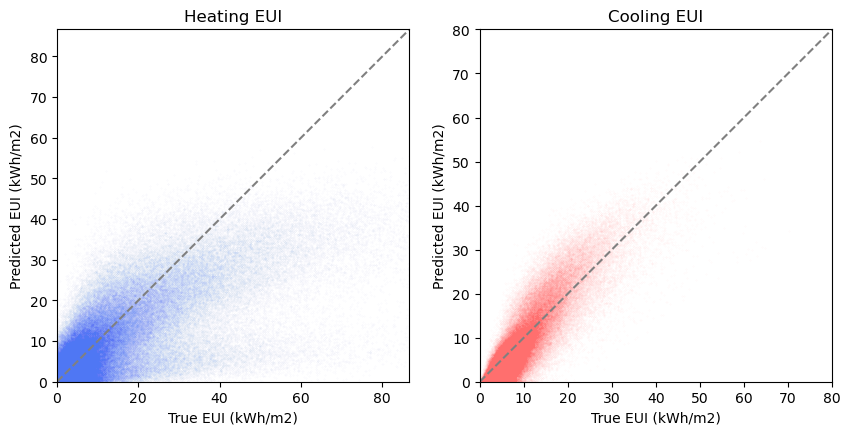

In [9]:
stacked = all_preds.stack(level=["month"])
c = pd.Series(stacked.index.get_level_values("climate_zone")).apply(
    lambda x: czs.index(x)
)
scale_y = 0.5
psize = 0.05
a = 0.05

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].scatter(
    stacked["True"].Heating,
    stacked["Predicted"].Heating,
    s=psize,
    alpha=a,
    color="#4f77f4",
)
ax[0].set_aspect("equal", adjustable="box")
max_y = max(stacked["True"].Heating.max() * scale_y, 80)
ax[0].plot(
    [0, max_y],
    [0, max_y],
    linestyle="--",
    color="gray",
)
ax[0].set_ylim(0, max_y)
ax[0].set_xlim(0, max_y)
ax[0].set_title("Heating EUI")
ax[0].set_xlabel("True EUI (kWh/m2)")
ax[0].set_ylabel("Predicted EUI (kWh/m2)")

ax[1].scatter(
    stacked["True"].Cooling,
    stacked["Predicted"].Cooling,
    s=psize,
    alpha=a,
    color="#ff6f6e",
)
ax[1].set_aspect("equal", adjustable="box")
scale_y = 0.5
max_y = max(stacked["True"].Cooling.max() * scale_y, 80)
ax[1].plot(
    [0, max_y],
    [0, max_y],
    linestyle="--",
    color="gray",
)
ax[1].set_ylim(0, max_y)
ax[1].set_xlim(0, max_y)
ax[1].set_title("Cooling EUI")
ax[1].set_xlabel("True EUI (kWh/m2)")
ax[1].set_ylabel("Predicted EUI (kWh/m2)")

In [10]:
rs_df.loc[
    rs_df.index.get_level_values("county").isin(
        all_preds.index.get_level_values("county")
    )
].index.get_level_values("county").value_counts().sort_index()
all_preds.index.get_level_values("county").value_counts().sort_index()

G0101330      32
G0400130    1338
G0400190    1201
G0400210     446
G0400250     249
            ... 
G5401090      20
G5500250     527
G5500790     927
G5501410      74
G5600450       7
Name: county, Length: 92, dtype: int64

In [14]:
total_monthly_res = total_monthly_energy["Predicted"] - total_monthly_energy["True"]
national_monthly_nmbe = (
    total_monthly_res.mean().groupby("end_use").mean()
    / total_monthly_energy["True"].mean().groupby("end_use").mean()
    * 100
)

total_county_area = all_preds.index.to_frame()[["area"]].groupby("county").sum()
total_county_energy = (
    total_monthly_energy.groupby("county").sum().T.groupby(["segment"]).sum().T
)
assert (total_county_energy.index == total_county_area.index).all()
total_county_eui = total_county_energy / total_county_area.values.reshape(-1, 1)
county_level_mape = (
    (total_county_energy["Predicted"] - total_county_energy["True"]).abs()
    / total_county_energy["True"]
).mean() * 100
county_level_eui_mape = (
    (total_county_eui["Predicted"] - total_county_eui["True"]).abs()
    / total_county_eui["True"]
).mean() * 100  # always identical to county_level_mape
total_county_energy_by_end_use = (
    total_monthly_energy.groupby("county")
    .sum()
    .T.groupby(["segment", "end_use"])
    .sum()
    .T
)
total_county_eui_by_end_use = (
    total_county_energy_by_end_use / total_county_area.values.reshape(-1, 1)
)
total_county_residual_by_end_use = (
    total_county_energy_by_end_use["Predicted"] - total_county_energy_by_end_use["True"]
)
total_county_eui_residual_by_end_use = (
    total_county_eui_by_end_use["Predicted"] - total_county_eui_by_end_use["True"]
)
total_county_rmse_by_end_use = total_county_residual_by_end_use.pow(2).mean().pow(0.5)
total_county_eui_rmse_by_end_use = (
    total_county_eui_residual_by_end_use.pow(2).mean().pow(0.5)
)
total_county_cvrmse_by_end_use = (
    total_county_rmse_by_end_use / total_county_energy_by_end_use["True"].mean() * 100
)
total_county_eui_cvrmse_by_end_use = (
    total_county_eui_rmse_by_end_use / total_county_eui_by_end_use["True"].mean() * 100
)
total_county_eui_mape_by_end_use = (
    total_county_eui_residual_by_end_use.abs() / total_county_eui_by_end_use["True"]
).mean() * 100
total_county_eui_cvrmse_by_end_use
county_level_mape, county_level_eui_mape
total_county_eui_mape_by_end_use

end_use
Cooling    32.726547
Heating    24.815724
dtype: float64

In [19]:
total_monthly_res = total_monthly_energy["Predicted"] - total_monthly_energy["True"]
total_state_area = all_preds.index.to_frame()[["area"]].groupby("state").sum()
total_state_energy = (
    total_monthly_energy.groupby("state").sum().T.groupby(["segment"]).sum().T
)
assert (total_state_energy.index == total_state_area.index).all()
total_state_eui = total_state_energy / total_state_area.values.reshape(-1, 1)
state_level_mape = (
    (total_state_energy["Predicted"] - total_state_energy["True"]).abs()
    / total_state_energy["True"]
).mean() * 100
state_level_eui_mape = (
    (total_state_eui["Predicted"] - total_state_eui["True"]).abs()
    / total_state_eui["True"]
).mean() * 100  # always identical to state_level_mape
total_state_energy_by_end_use = (
    total_monthly_energy.groupby("state")
    .sum()
    .T.groupby(["segment", "end_use"])
    .sum()
    .T
)
total_state_eui_by_end_use = (
    total_state_energy_by_end_use / total_state_area.values.reshape(-1, 1)
)
total_state_residual_by_end_use = (
    total_state_energy_by_end_use["Predicted"] - total_state_energy_by_end_use["True"]
)
total_state_eui_residual_by_end_use = (
    total_state_eui_by_end_use["Predicted"] - total_state_eui_by_end_use["True"]
)
total_state_rmse_by_end_use = total_state_residual_by_end_use.pow(2).mean().pow(0.5)
total_state_eui_rmse_by_end_use = (
    total_state_eui_residual_by_end_use.pow(2).mean().pow(0.5)
)
total_state_cvrmse_by_end_use = (
    total_state_rmse_by_end_use / total_state_energy_by_end_use["True"].mean() * 100
)
total_state_eui_cvrmse_by_end_use = (
    total_state_eui_rmse_by_end_use / total_state_eui_by_end_use["True"].mean() * 100
)
total_state_eui_mape_by_end_use = (
    total_state_eui_residual_by_end_use.abs() / total_state_eui_by_end_use["True"]
).mean() * 100
total_state_eui_cvrmse_by_end_use
state_level_mape, state_level_eui_mape, total_state_eui_mape_by_end_use
total_state_eui_cvrmse_by_end_use

end_use
Cooling    17.889619
Heating    24.585507
dtype: float64

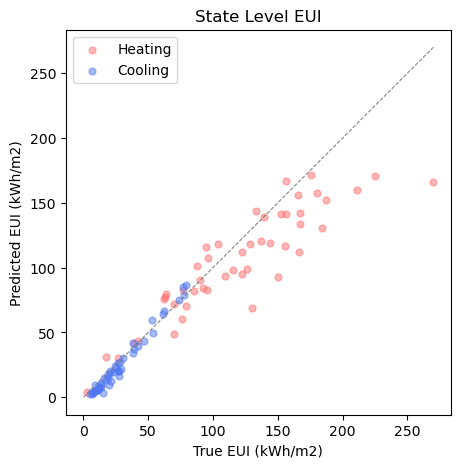

In [40]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
s = 24
a = 0.5
ax.scatter(
    total_state_eui_by_end_use["True"].Heating,
    total_state_eui_by_end_use["Predicted"].Heating,
    s=s,
    alpha=a,
    color="#ff6f6e",
    label="Heating",
)
ax.scatter(
    total_state_eui_by_end_use["True"].Cooling,
    total_state_eui_by_end_use["Predicted"].Cooling,
    s=s,
    alpha=a,
    color="#4f77f4",
    label="Cooling",
)
ax.plot(
    [0, total_state_eui_by_end_use["True"].max().max()],
    [0, total_state_eui_by_end_use["True"].max().max()],
    linestyle="--",
    color="gray",
    lw=0.75,
)
ax.set_aspect("equal", adjustable="box")
ax.set_title("State Level EUI")
ax.set_xlabel("True EUI (kWh/m2)")
ax.set_ylabel("Predicted EUI (kWh/m2)")
ax.legend()